# Machine Learning Assignment — Galaxy10 DECaLS Binary Classification with KNN

## Student Details
- Student 1: **Netanel Z**, **1066**
- Student 2: **Hodaya E**, **9361**

## Submission / Registration Metadata
- **Assignment type:** Image Processing / Computer Vision
- **Learning type:** Classification
- **Implemented learning algorithm:** K-Nearest Neighbors (KNN)
- **Dataset name:** Galaxy10 DECaLS Binary Classification Dataset
- **Dataset URL:** https://www.kaggle.com/datasets/anth0nym/galaxy10-decals-fork-dataset
- **Repository / Colab / Azure URL:** **[add link]**
- **Presentation video URL:** **[add link if submitting a video]**


---

## Project Goal

This project performs supervised **image classification** on the **Galaxy10 DECaLS Binary Classification Dataset**. The task is to classify each galaxy image into one of two morphology classes:

- `0` — **Round Smooth Galaxy**
- `1` — **Barred Spiral Galaxy**

The dataset contains 256×256 images with three astronomical bands (`g`, `r`, `z`). The official assignment metric is **Macro-F1**, because this is a binary classification problem without one designated central class.

The model is **K-Nearest Neighbors (KNN)** from scikit-learn. The main challenge is not only choosing KNN hyperparameters, but converting galaxy images into useful numerical feature vectors. The notebook therefore evaluates multiple image-processing and feature-engineering strategies before selecting the best complete pipeline using **5-fold stratified cross-validation on the training set only**.


# AI Tools and External Resources

AI tools were used as supporting resources for requirements analysis, methodology design, implementation review, visualization design, and debugging. Every stage must still be understood and explained during the presentation.

### Main Prompts

**Prompt 1 — Dataset and assignment design**

> We are using the Galaxy10 DECaLS binary image-classification dataset with KNN. Map every assignment requirement to a correct supervised-learning workflow, including the required Macro-F1 metric, feature engineering, five-fold cross-validation, full grid search, final training, and test evaluation.

**Purpose:** align the notebook structure with the grading instructions.

**Prompt 2 — Image feature engineering**

> Design image-processing features suitable for distinguishing round smooth galaxies from barred spiral galaxies using KNN. Include a simple baseline, HOG, astronomical intensity stretching, color-band histograms, and interpretable morphology statistics, with visual demonstrations.

**Purpose:** create meaningful image features rather than feeding raw high-resolution images directly into KNN.

**Prompt 3 — Bonus experiments**

> Add a full Cartesian grid-search with five-fold stratified cross-validation, imbalance treatments, visual error analysis, and explainability tailored to KNN.

**Purpose:** address Parts 6A, 6B, and 6C of the bonus requirements.

**Prompt 4 — Validation and leakage review**

> Review the complete flow for data leakage. Ensure feature extraction is sample-wise, scaling and sampling are fitted only inside training folds, the fixed test split is untouched until final evaluation, and all model-selection decisions are based only on the fixed training split.

**Purpose:** ensure a methodologically correct evaluation.

### External Resources

- Kaggle — Galaxy10 DECaLS Binary Classification Dataset  
  https://www.kaggle.com/datasets/anth0nym/galaxy10-decals-fork-dataset
- Galaxy10 DECaLS source repository  
  https://github.com/henrysky/Galaxy10
- scikit-learn — KNeighborsClassifier  
  https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html
- scikit-image — HOG  
  https://scikit-image.org/docs/stable/api/skimage.feature.html
- imbalanced-learn — Sampling methods  
  https://imbalanced-learn.org/

# Part 1 — Dataset Loading and Problem Definition

## Dataset Summary

The **Galaxy10 DECaLS Binary Classification Dataset** is an image-classification dataset derived from Galaxy10 DECaLS. It contains **4,688 galaxy images**, each with resolution **256×256×3**, and focuses on two morphology classes:

- `0` — **Round Smooth Galaxy**
- `1` — **Barred Spiral Galaxy**

The Kaggle data card documents the following split sizes and class counts:

| Split | Images | Round Smooth | Barred Spiral |
|---|---:|---:|---:|
| Train | 3,750 | 2,116 | 1,634 |
| Validation | 469 | 264 | 205 |
| Test | 469 | 265 | 204 |
| **Total** | **4,688** | **2,645** | **2,043** |

### Important Split Preparation Note

The downloaded `Binary_2_5_dataset.h5` file contains all 4,688 images in one combined `images` array and one combined `labels` array. A separate one-time preparation notebook, `00_prepare_galaxy10_splits.ipynb`, materializes three fixed HDF5 files:

- `data/train.h5`
- `data/validation.h5`
- `data/test.h5`

The **main assignment notebook does not call `train_test_split` and never re-splits these files**. It only loads the already prepared datasets.

Model selection is performed using **5-fold stratified cross-validation on the fixed Train set only**. Validation is used as an independent sanity check after model selection, and Test is used only after the final configuration has been fixed.

## Why This Is a Computer Vision Problem

The system receives galaxy **images** as its raw input and performs image-specific processing: normalization, intensity stretching, resizing, grayscale conversion, Sobel edge extraction, HOG extraction, channel histograms, and morphology measurements.

Therefore, this is a **Computer Vision / Image Classification** task. KNN is the final classifier, while the image-processing pipeline converts each image into a numerical feature vector suitable for distance-based learning.

## Environment and Version Compatibility

This block imports the libraries used throughout the notebook and prints their versions.

The sampling experiment in Bonus 6B uses `imbalanced-learn`. On Python 3.9, the recommended reproducible environment for this notebook is:

- `scikit-learn==1.5.2`
- `imbalanced-learn==0.12.4`
- `scikit-image==0.24.0`


### Runtime Environment and Shared Configuration

**Why**  
Create one reproducible environment for the entire notebook.

**What**  
Import all libraries and define global paths, class names, random state, and 5-fold CV.

**How**  
The setup is executed once and every later block reuses the same constants.

**Expected result**  
Package versions are printed and no model result is produced yet.

In [1]:
from pathlib import Path
import os
from itertools import product
import hashlib
import sys
import time
import math

import h5py
import imblearn
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sklearn
import skimage

from joblib import parallel_backend

from IPython.display import Markdown

from skimage.feature import hog
from skimage.filters import sobel
from skimage.transform import resize
from skimage import exposure

from sklearn.decomposition import PCA
from sklearn.model_selection import StratifiedKFold, GridSearchCV, cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import (
    StandardScaler,
    RobustScaler,
    MinMaxScaler,
    Normalizer,
    FunctionTransformer
)
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    balanced_accuracy_score,
    precision_score,
    recall_score,
    matthews_corrcoef,
    cohen_kappa_score,
    classification_report,
    confusion_matrix,
    ConfusionMatrixDisplay,
    roc_curve,
    roc_auc_score,
    precision_recall_curve,
    average_precision_score
)

from imblearn.over_sampling import RandomOverSampler, SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline as ImbPipeline

RANDOM_STATE = 42

# Keep outer CV/Grid Search parallel, but avoid nested parallelism.
# Four workers is a good balance for this dataset and prevents joblib
# workers from being killed by memory/CPU oversubscription.
PARALLEL_JOBS = max(
    1,
    min(
        4,
        os.cpu_count() or 1
    )
)
DATA_DIR = Path("./data")
OUTPUT_DIR = Path("./outputs")
OUTPUT_DIR.mkdir(exist_ok=True)

CLASS_NAMES = {
    0: "Round Smooth",
    1: "Barred Spiral"
}

CV = StratifiedKFold(
    n_splits=5,
    shuffle=True,
    random_state=RANDOM_STATE
)

pd.set_option("display.max_columns", 100)
pd.set_option("display.max_rows", 1000)

print("Python:", sys.version.split()[0])
print("NumPy:", np.__version__)
print("scikit-learn:", sklearn.__version__)
print("imbalanced-learn:", imblearn.__version__)
print("scikit-image:", skimage.__version__)
print("Parallel CV/Grid workers:", PARALLEL_JOBS)


Python: 3.9.6
NumPy: 2.0.2
scikit-learn: 1.5.2
imbalanced-learn: 0.12.4
scikit-image: 0.24.0
Parallel CV/Grid workers: 4


## Strict HDF5 Split Loader

The main notebook expects three **distinct prepared files** instead of guessing split names automatically. This intentionally prevents a combined HDF5 file from being silently reused as Train, Validation, and Test.

For each split, the loader verifies the expected sample count, documented class counts, `images`/`labels` datasets, and image-label length consistency.

If the prepared files do not exist, the notebook stops and instructs the user to run `00_prepare_galaxy10_splits.ipynb`.

### Strict Dataset Split Definitions and Loader

This is a critical integrity block. It prevents the same HDF5 data from being reused across Train, Validation, and Test and stops execution if the prepared split files do not match the documented structure.

**Why**  
Prevent accidental Train/Validation/Test leakage.

**What**  
Define the exact prepared files, expected sizes, class counts, and strict HDF5 loading functions.

**How**  
Each file is opened explicitly and validated before its arrays are returned.

**Expected result**  
Three distinct valid split arrays are loaded, or execution stops.

In [2]:
EXPECTED_SPLITS = {
    "train": {
        "file": "train.h5",
        "size": 3750,
        "class_counts": {0: 2116, 1: 1634}
    },
    "validation": {
        "file": "validation.h5",
        "size": 469,
        "class_counts": {0: 264, 1: 205}
    },
    "test": {
        "file": "test.h5",
        "size": 469,
        "class_counts": {0: 265, 1: 204}
    }
}


def inspect_hdf5_file(file_path):
    rows = []

    with h5py.File(file_path, "r") as f:
        for key in f.keys():
            obj = f[key]

            if isinstance(obj, h5py.Dataset):
                rows.append({
                    "file": file_path.name,
                    "dataset": key,
                    "shape": tuple(obj.shape),
                    "dtype": str(obj.dtype)
                })

    return pd.DataFrame(rows)


def load_prepared_split(split_name, data_dir=DATA_DIR):
    spec = EXPECTED_SPLITS[split_name]
    file_path = data_dir / spec["file"]

    if not file_path.exists():
        combined_file = data_dir / "Binary_2_5_dataset.h5"

        if combined_file.exists():
            raise FileNotFoundError(
                f"{file_path.name} was not found. "
                "Run 00_prepare_galaxy10_splits.ipynb once "
                "before running the main notebook."
            )

        raise FileNotFoundError(
            f"Required split file not found: "
            f"{file_path.resolve()}"
        )

    with h5py.File(file_path, "r") as f:
        if "images" not in f or "labels" not in f:
            raise KeyError(
                f"{file_path.name} must contain "
                "'images' and 'labels'."
            )

        images = np.asarray(f["images"])
        labels = (
            np.asarray(f["labels"])
            .reshape(-1)
            .astype(int)
        )

    if images.ndim != 4:
        raise ValueError(
            f"{split_name}: expected 4D images, "
            f"got {images.shape}."
        )

    if len(images) != len(labels):
        raise ValueError(
            f"{split_name}: image/label length mismatch."
        )

    if len(images) != spec["size"]:
        raise ValueError(
            f"{split_name}: expected {spec['size']} samples, "
            f"found {len(images)}."
        )

    actual_counts = (
        pd.Series(labels)
        .value_counts()
        .sort_index()
        .to_dict()
    )

    if actual_counts != spec["class_counts"]:
        raise ValueError(
            f"{split_name}: expected class counts "
            f"{spec['class_counts']}, got {actual_counts}."
        )

    print(
        f"{split_name}: {file_path.name}, "
        f"images={images.shape}, labels={labels.shape}, "
        f"class_counts={actual_counts}"
    )

    return images, labels

### Load and Verify Train / Validation / Test

**Why**  
Load the fixed datasets used by the complete supervised-learning flow.

**What**  
Read Train, Validation, and Test and display their HDF5 structure and shapes.

**How**  
The strict loader verifies documented counts before returning arrays.

**Expected result**  
Train=3750, Validation=469, Test=469 with the expected class counts.

In [3]:
X_train_img, y_train = load_prepared_split("train")
X_val_img, y_val = load_prepared_split("validation")
X_test_img, y_test = load_prepared_split("test")

split_structure = pd.concat(
    [
        inspect_hdf5_file(DATA_DIR / "train.h5"),
        inspect_hdf5_file(DATA_DIR / "validation.h5"),
        inspect_hdf5_file(DATA_DIR / "test.h5")
    ],
    ignore_index=True
)

display(split_structure)

print()
print("Train:", X_train_img.shape, y_train.shape)
print("Validation:", X_val_img.shape, y_val.shape)
print("Test:", X_test_img.shape, y_test.shape)

train: train.h5, images=(3750, 256, 256, 3), labels=(3750,), class_counts={0: 2116, 1: 1634}
validation: validation.h5, images=(469, 256, 256, 3), labels=(469,), class_counts={0: 264, 1: 205}
test: test.h5, images=(469, 256, 256, 3), labels=(469,), class_counts={0: 265, 1: 204}


,file,dataset,shape,dtype
0,train.h5,images,"(3750, 256, 256, 3)",uint8
1,train.h5,labels,"(3750,)",int64
2,validation.h5,images,"(469, 256, 256, 3)",uint8
3,validation.h5,labels,"(469,)",int64
4,test.h5,images,"(469, 256, 256, 3)",uint8
5,test.h5,labels,"(469,)",int64



Train: (3750, 256, 256, 3) (3750,)
Validation: (469, 256, 256, 3) (469,)
Test: (469, 256, 256, 3) (469,)


## First Five Samples from Train and Test

For image datasets, a literal tabular "row" is not very informative. We therefore show:

1. a five-row metadata table, and  
2. the corresponding first five images.

### First-Five Sample Metadata

**Why**  
Meet the requirement to show the first five Train and Test samples in a readable form.

**What**  
Build metadata tables for the first five images of each split.

**How**  
Basic tensor statistics and labels are converted into five-row DataFrames.

**Expected result**  
Two five-row tables corresponding to the first five Train and Test images.

In [4]:
def build_image_metadata(images, labels, n=5):
    rows = []
    for i in range(min(n, len(images))):
        image = np.asarray(images[i])
        rows.append({
            "index": i,
            "label": int(labels[i]),
            "class_name": CLASS_NAMES[int(labels[i])],
            "shape": str(tuple(image.shape)),
            "min": float(np.nanmin(image)),
            "max": float(np.nanmax(image)),
            "mean": float(np.nanmean(image)),
            "std": float(np.nanstd(image))
        })
    return pd.DataFrame(rows)


print("First five TRAIN samples")
display(build_image_metadata(X_train_img, y_train, 5))

print("First five TEST samples")
display(build_image_metadata(X_test_img, y_test, 5))

First five TRAIN samples


,index,label,class_name,shape,min,max,mean,std
0,0,0,Round Smooth,"(256, 256, 3)",0.0,255.0,36.800618,24.567702
1,1,1,Barred Spiral,"(256, 256, 3)",0.0,255.0,42.611415,29.085214
2,2,0,Round Smooth,"(256, 256, 3)",0.0,255.0,42.064713,28.361781
3,3,1,Barred Spiral,"(256, 256, 3)",0.0,255.0,37.754562,26.254618
4,4,0,Round Smooth,"(256, 256, 3)",0.0,255.0,40.471578,24.821077


First five TEST samples


,index,label,class_name,shape,min,max,mean,std
0,0,0,Round Smooth,"(256, 256, 3)",0.0,248.0,33.492635,13.052396
1,1,1,Barred Spiral,"(256, 256, 3)",0.0,255.0,36.185074,25.361798
2,2,0,Round Smooth,"(256, 256, 3)",0.0,255.0,38.485662,22.956239
3,3,1,Barred Spiral,"(256, 256, 3)",0.0,255.0,39.522715,28.928372
4,4,1,Barred Spiral,"(256, 256, 3)",0.0,255.0,40.292379,29.942186


### First-Five Image Galleries

**Why**  
Make the first five image samples visually understandable.

**What**  
Display the actual first five Train and Test galaxy images with class labels.

**How**  
Matplotlib renders the images directly from the HDF5 arrays.

**Expected result**  
Two five-image galleries confirming the image-label mapping.

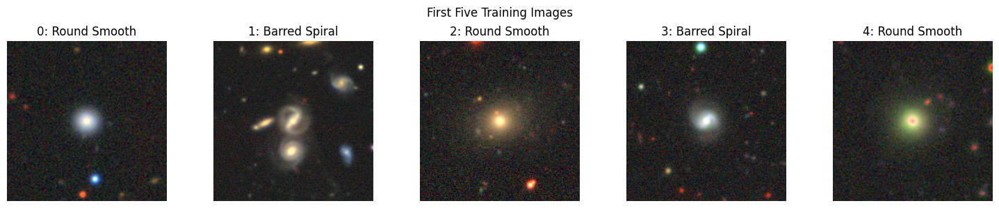

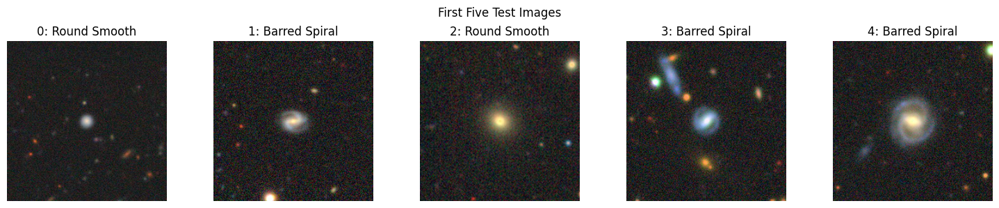

In [5]:
def display_image_grid(images, labels, indices, title):
    fig, axes = plt.subplots(1, len(indices), figsize=(3 * len(indices), 3))
    if len(indices) == 1:
        axes = [axes]

    for ax, idx in zip(axes, indices):
        image = np.asarray(images[idx])

        if image.dtype.kind in "ui":
            shown = image
        else:
            shown = image.astype(float)
            lo, hi = np.nanpercentile(shown, [1, 99])
            shown = np.clip((shown - lo) / (hi - lo + 1e-12), 0, 1)

        ax.imshow(shown)
        ax.set_title(f"{idx}: {CLASS_NAMES[int(labels[idx])]}")
        ax.axis("off")

    fig.suptitle(title)
    plt.tight_layout()
    plt.show()


display_image_grid(
    X_train_img,
    y_train,
    list(range(min(5, len(X_train_img)))),
    "First Five Training Images"
)

display_image_grid(
    X_test_img,
    y_test,
    list(range(min(5, len(X_test_img)))),
    "First Five Test Images"
)

# Data Quality and Leakage Checks

For image classification, data quality is not only about missing values. We also check:

- non-finite pixels
- very low dynamic-range / nearly blank images
- class balance
- duplicate images
- duplicates appearing across different splits

Cross-split duplicates are especially important because they could make the test result unrealistically optimistic.

### Image Quality Summary

**Why**  
Detect corrupted or suspicious images before modeling.

**What**  
Measure non-finite pixels, near-blank images, brightness, and contrast by split.

**How**  
Numerical checks summarize image quality without modifying any observation.

**Expected result**  
A quality table, ideally with no corrupted images.

In [6]:
def image_quality_summary(images, split_name):
    flat = images.reshape(len(images), -1).astype(float)

    return pd.Series({
        "split": split_name,
        "images": len(images),
        "non_finite_pixels": int((~np.isfinite(flat)).sum()),
        "near_blank_images": int((np.nanstd(flat, axis=1) < 1e-8).sum()),
        "mean_image_brightness": float(np.nanmean(flat)),
        "median_image_std": float(np.nanmedian(np.nanstd(flat, axis=1)))
    })


quality_df = pd.DataFrame([
    image_quality_summary(X_train_img, "train"),
    image_quality_summary(X_val_img, "validation"),
    image_quality_summary(X_test_img, "test")
])

display(quality_df)

,split,images,non_finite_pixels,near_blank_images,mean_image_brightness,median_image_std
0,train,3750,0,0,41.771543,27.464180
1,validation,469,0,0,42.204591,27.559270
2,test,469,0,0,41.634922,27.632446


### Class Distribution Across Dataset Splits

**Why**  
Measure class imbalance and compare split distributions.

**What**  
Calculate class percentages for Train, Validation, and Test and plot them.

**How**  
Normalized value counts are computed independently for each fixed split.

**Expected result**  
Similar class ratios across all three splits.

,Train,Validation,Test
Round Smooth,56.43,56.29,56.5
Barred Spiral,43.57,43.71,43.5


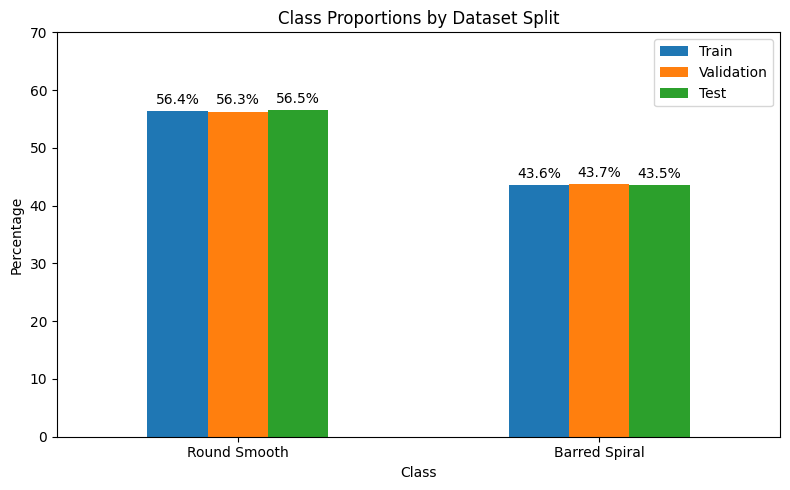

In [7]:
split_labels = {
    "Train": y_train,
    "Validation": y_val,
    "Test": y_test
}

class_proportions = pd.DataFrame({
    split: (
        pd.Series(labels)
        .value_counts(normalize=True)
        .sort_index()
        * 100
    )
    for split, labels in split_labels.items()
})

class_proportions.index = [
    CLASS_NAMES[int(i)]
    for i in class_proportions.index
]

display(class_proportions.round(2))

ax = class_proportions.plot(
    kind="bar",
    figsize=(8, 5)
)

for container in ax.containers:
    ax.bar_label(
        container,
        fmt="%.1f%%",
        padding=3
    )

ax.set_title("Class Proportions by Dataset Split")
ax.set_xlabel("Class")
ax.set_ylabel("Percentage")
ax.set_ylim(0, 70)
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

### Exact-Duplicate Leakage Check

This block is a hard leakage safeguard rather than a descriptive statistic: any exact image overlap across dataset splits invalidates the evaluation and causes the notebook to stop.

**Why**  
Prevent exact-image leakage across dataset splits.

**What**  
Hash every image and count intersections among Train, Validation, and Test.

**How**  
Identical byte content produces the same SHA-256 hash; any overlap raises an exception.

**Expected result**  
Zero cross-split duplicates and a passed integrity message.

In [8]:
def image_hashes(images):
    return [
        hashlib.sha1(np.ascontiguousarray(img).tobytes()).hexdigest()
        for img in images
    ]


train_hashes = set(image_hashes(X_train_img))
val_hashes = set(image_hashes(X_val_img))
test_hashes = set(image_hashes(X_test_img))

duplicate_summary = pd.DataFrame({
    "comparison": [
        "Train ∩ Validation",
        "Train ∩ Test",
        "Validation ∩ Test"
    ],
    "duplicate_images": [
        len(train_hashes & val_hashes),
        len(train_hashes & test_hashes),
        len(val_hashes & test_hashes)
    ]
})

display(duplicate_summary)

if (duplicate_summary["duplicate_images"] > 0).any():
    raise RuntimeError(
        "Data leakage detected: exact images occur in more "
        "than one split. Stop before model selection and fix "
        "the prepared split files."
    )

print(
    "Split-integrity check passed: "
    "no exact cross-split duplicates detected."
)


,comparison,duplicate_images
0,Train ∩ Validation,0
1,Train ∩ Test,0
2,Validation ∩ Test,0


Split-integrity check passed: no exact cross-split duplicates detected.


## Visual Distribution of Image Brightness and Contrast

Extreme brightness or contrast does not automatically mean an image is invalid. Astronomical images naturally contain large intensity differences. These distributions are diagnostic; valid extreme observations are retained unless there is clear evidence of corruption.

### Brightness, Contrast, and Dynamic-Range Statistics

**Why**  
Understand natural image variability before selecting preprocessing.

**What**  
Calculate per-image brightness, contrast, and dynamic range.

**How**  
Statistics are computed independently for every training image and plotted.

**Expected result**  
Brightness and contrast distributions that reveal long tails or unusual observations.

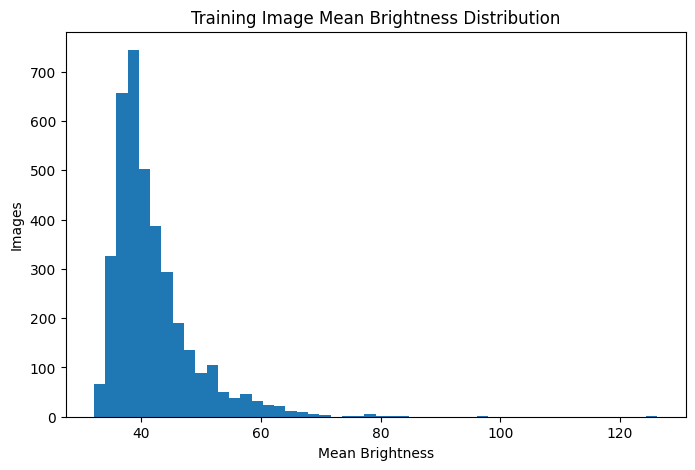

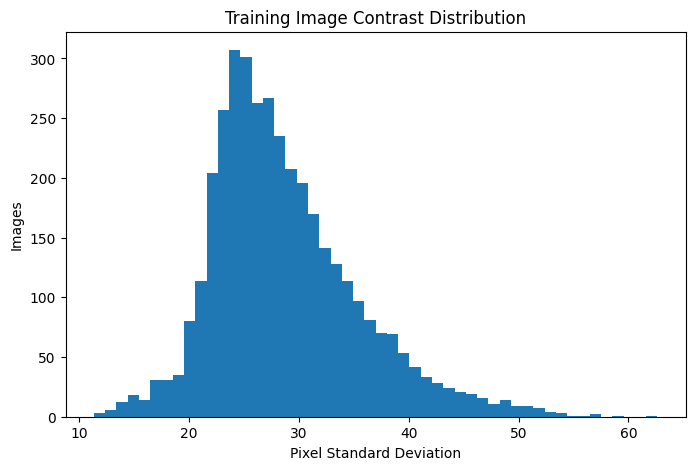

In [9]:
def per_image_stats(images):
    flat = images.reshape(len(images), -1).astype(float)
    return pd.DataFrame({
        "mean_brightness": np.nanmean(flat, axis=1),
        "contrast_std": np.nanstd(flat, axis=1),
        "dynamic_range": np.nanmax(flat, axis=1) - np.nanmin(flat, axis=1)
    })


train_image_stats = per_image_stats(X_train_img)

fig, ax = plt.subplots(figsize=(8, 5))
ax.hist(train_image_stats["mean_brightness"], bins=50)
ax.set_title("Training Image Mean Brightness Distribution")
ax.set_xlabel("Mean Brightness")
ax.set_ylabel("Images")
plt.show()

fig, ax = plt.subplots(figsize=(8, 5))
ax.hist(train_image_stats["contrast_std"], bins=50)
ax.set_title("Training Image Contrast Distribution")
ax.set_xlabel("Pixel Standard Deviation")
ax.set_ylabel("Images")
plt.show()

### Extreme-Image Visual Inspection

**Why**  
Inspect extreme observations instead of deleting them automatically.

**What**  
Display the brightest and darkest training images.

**How**  
Images are ranked by mean brightness and the most extreme examples are rendered.

**Expected result**  
Two galleries used for a visual data-quality sanity check.

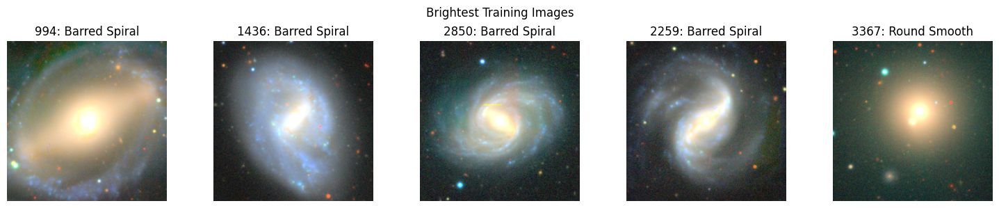

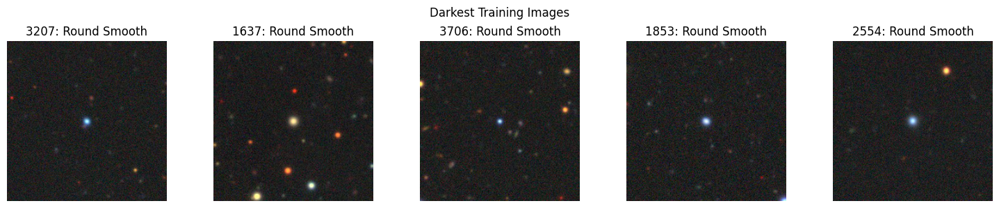

In [10]:
def show_extreme_images(images, labels, values, title, highest=True, n=5):
    order = np.argsort(values)
    selected = order[-n:][::-1] if highest else order[:n]
    display_image_grid(images, labels, selected.tolist(), title)


show_extreme_images(
    X_train_img,
    y_train,
    train_image_stats["mean_brightness"].to_numpy(),
    "Brightest Training Images",
    highest=True
)

show_extreme_images(
    X_train_img,
    y_train,
    train_image_stats["mean_brightness"].to_numpy(),
    "Darkest Training Images",
    highest=False
)

# Course-Taught Feature Engineering Coverage

The three course presentations were reviewed before finalizing the notebook.

This notebook therefore separates the material into two layers:

1. **Course-taught baseline coverage** — direct demonstrations and compact 5-fold experiments for the techniques taught in class.
2. **Bonus extensions** — HOG, astronomical `asinh` stretching, morphology statistics, RobustScaler, sampling methods, and explainability.

This keeps the assignment aligned with the course while still retaining the stronger additional techniques.

# Part 2 — Image Feature Engineering

KNN requires a numerical vector and does not directly understand galaxy morphology. Feeding all 256×256×3 pixels directly to KNN would create **196,608 input dimensions per image**, which is inefficient and makes distance-based learning vulnerable to the curse of dimensionality.

We therefore compare several feature representations:

### 1. Resized grayscale pixels — baseline
A simple baseline. The image is resized to 32×32 and flattened.

### 2. HOG — Histogram of Oriented Gradients
HOG summarizes local edge directions. This is relevant because barred spiral galaxies contain stronger directional and structural patterns than round smooth galaxies.

### 3. HOG + color-band histograms + morphology statistics
This combines:
- HOG shape information
- intensity histograms from the three `g/r/z` bands
- interpretable morphology statistics such as edge density, concentration, asymmetry, mean intensity, and contrast

### Astronomical intensity stretch
Each feature family is evaluated with:
- `linear` normalization
- `asinh` stretch

An `asinh` stretch compresses very bright regions while preserving faint structures, which is useful for astronomical imagery.

## Mapping to the Assignment Requirement

The notebook explicitly separates techniques taught in class from project-specific extensions.

- **Course-taught image processing / Feature Engineering:** normalization, contrast stretching, resizing, grayscale conversion, thresholding, histogram equalization, normalized and cumulative histograms, channel/color histograms, local histograms, 2D joint histograms, and flattened-pixel representations.
- **Additional project extensions:** HOG, astronomical `asinh` stretching, handcrafted morphology statistics, RobustScaler, imbalance treatments, and Explainability analyses.

The additional representations are evaluated alongside course-taught baselines using the same official Macro-F1 metric, so the extensions do not replace the required course material.

### Image Preprocessing and Feature Extraction Toolkit

**Why**  
Create reusable transformations that convert galaxy images into numerical features suitable for KNN.

**What**  
Implement contrast stretching, grayscale conversion, thresholding, histogram equalization, global/normalized/cumulative histograms, local histograms, 2D joint histograms, HOG, channel histograms, and morphology statistics.

**How**  
Each image is processed independently; no dataset-level statistics are learned inside feature extraction, so these transformations can be safely cached before CV.

**Expected result**  
A deterministic feature vector for every supported representation plus visual intermediates for explanation.

In [11]:
def normalize_image(image, stretch="linear"):
    image = np.asarray(image, dtype=np.float32)
    image = np.nan_to_num(image, nan=0.0, posinf=0.0, neginf=0.0)

    lo, hi = np.percentile(image, [1.0, 99.5])
    scaled = np.clip((image - lo) / (hi - lo + 1e-12), 0.0, 1.0)

    if stretch == "linear":
        return scaled

    if stretch == "asinh":
        strength = 5.0
        return np.arcsinh(strength * scaled) / np.arcsinh(strength)

    raise ValueError("stretch must be 'linear' or 'asinh'")


def to_gray(image):
    if image.ndim == 2:
        return image.astype(np.float32)

    if image.shape[-1] == 1:
        return image[..., 0].astype(np.float32)

    return image[..., :3].mean(axis=-1).astype(np.float32)


def resize_gray(image, size):
    gray = to_gray(image)
    return resize(
        gray,
        (size, size),
        anti_aliasing=True,
        preserve_range=True
    ).astype(np.float32)


def color_histogram(image, bins=16):
    channels = image.shape[-1] if image.ndim == 3 else 1
    histograms = []

    for channel in range(min(channels, 3)):
        values = image[..., channel].ravel() if image.ndim == 3 else image.ravel()
        hist, _ = np.histogram(
            values,
            bins=bins,
            range=(0.0, 1.0)
        )
        hist = hist.astype(np.float32)
        hist /= hist.sum() + 1e-12
        histograms.append(hist)

    while len(histograms) < 3:
        histograms.append(np.zeros(bins, dtype=np.float32))

    return np.concatenate(histograms)


def grayscale_histogram(gray, bins=32, normalize=True):
    hist, _ = np.histogram(
        np.asarray(gray).ravel(),
        bins=bins,
        range=(0.0, 1.0)
    )
    hist = hist.astype(np.float32)

    if normalize:
        hist /= hist.sum() + 1e-12

    return hist


def cumulative_grayscale_histogram(gray, bins=32):
    hist = grayscale_histogram(
        gray,
        bins=bins,
        normalize=True
    )
    return np.cumsum(hist).astype(np.float32)


def local_grayscale_histograms(
    gray,
    grid_size=2,
    bins=16
):
    gray = np.asarray(gray, dtype=np.float32)
    h, w = gray.shape

    rows = np.array_split(
        np.arange(h),
        grid_size
    )
    cols = np.array_split(
        np.arange(w),
        grid_size
    )

    features = []

    for row_idx in rows:
        for col_idx in cols:
            region = gray[
                np.ix_(row_idx, col_idx)
            ]
            features.append(
                grayscale_histogram(
                    region,
                    bins=bins,
                    normalize=True
                )
            )

    return np.concatenate(features)


def joint_band_histograms(
    image,
    bins=12
):
    image = np.asarray(
        image,
        dtype=np.float32
    )

    if image.ndim != 3 or image.shape[-1] < 3:
        return np.zeros(
            2 * bins * bins,
            dtype=np.float32
        )

    feature_parts = []

    for ch_a, ch_b in [(0, 1), (1, 2)]:
        hist_2d, _, _ = np.histogram2d(
            image[..., ch_a].ravel(),
            image[..., ch_b].ravel(),
            bins=bins,
            range=[
                [0.0, 1.0],
                [0.0, 1.0]
            ]
        )

        hist_2d = hist_2d.astype(
            np.float32
        )
        hist_2d /= (
            hist_2d.sum() + 1e-12
        )
        feature_parts.append(
            hist_2d.ravel()
        )

    return np.concatenate(feature_parts)


def equalized_grayscale(gray):
    return exposure.equalize_hist(
        np.asarray(gray, dtype=np.float32)
    ).astype(np.float32)


def thresholded_grayscale(
    gray,
    threshold=0.5
):
    return (
        np.asarray(gray, dtype=np.float32)
        >= threshold
    ).astype(np.float32)


def morphology_statistics(gray):
    gray = np.asarray(gray, dtype=np.float32)
    edge_map = sobel(gray)

    h, w = gray.shape
    yy, xx = np.ogrid[:h, :w]
    cy, cx = (h - 1) / 2.0, (w - 1) / 2.0
    radius = np.sqrt((yy - cy) ** 2 + (xx - cx) ** 2)

    inner = radius <= 0.20 * min(h, w)
    outer = (radius >= 0.30 * min(h, w)) & (radius <= 0.48 * min(h, w))

    inner_mean = float(gray[inner].mean()) if inner.any() else 0.0
    outer_mean = float(gray[outer].mean()) if outer.any() else 0.0

    rotated = np.rot90(gray, 2)
    asymmetry = float(
        np.mean(np.abs(gray - rotated)) /
        (2.0 * np.mean(np.abs(gray)) + 1e-6)
    )
    asymmetry = float(np.clip(asymmetry, 0.0, 1.0))

    edge_threshold = np.percentile(edge_map, 75)
    edge_density = float(np.mean(edge_map > edge_threshold))

    concentration = (
        (inner_mean - outer_mean) /
        (inner_mean + outer_mean + 1e-6)
    )
    concentration = float(
        np.clip(concentration, -1.0, 1.0)
    )

    return np.array([
        float(gray.mean()),
        float(gray.std()),
        edge_density,
        concentration,
        asymmetry
    ], dtype=np.float32)


def extract_one_image_features(
    image,
    method,
    size,
    stretch,
    return_visuals=False
):
    normalized = normalize_image(image, stretch=stretch)
    gray = resize_gray(normalized, size=size)

    visuals = {
        "normalized": normalized,
        "gray": gray,
        "edges": sobel(gray)
    }

    if method == "raw_gray":
        features = gray.ravel()
        groups = {
            "raw_pixels": slice(0, features.size)
        }

    elif method == "hog":
        hog_features, hog_image = hog(
            gray,
            orientations=9,
            pixels_per_cell=(8, 8),
            cells_per_block=(2, 2),
            block_norm="L2-Hys",
            visualize=True,
            feature_vector=True
        )
        features = hog_features.astype(np.float32)
        visuals["hog"] = hog_image
        groups = {
            "hog": slice(0, features.size)
        }

    elif method == "gray_hist":
        features = grayscale_histogram(
            gray,
            bins=32,
            normalize=True
        )
        groups = {
            "normalized_gray_histogram": slice(
                0,
                features.size
            )
        }

    elif method == "gray_cdf":
        features = cumulative_grayscale_histogram(
            gray,
            bins=32
        )
        groups = {
            "cumulative_gray_histogram": slice(
                0,
                features.size
            )
        }

    elif method == "channel_hist":
        features = color_histogram(
            normalized,
            bins=16
        )
        groups = {
            "channel_histograms": slice(
                0,
                features.size
            )
        }

    elif method == "local_hist":
        features = local_grayscale_histograms(
            gray,
            grid_size=2,
            bins=16
        )
        groups = {
            "local_histograms": slice(
                0,
                features.size
            )
        }

    elif method == "joint_hist":
        features = joint_band_histograms(
            normalized,
            bins=12
        )
        groups = {
            "joint_band_histograms": slice(
                0,
                features.size
            )
        }

    elif method == "equalized_raw":
        equalized = equalized_grayscale(
            gray
        )
        features = equalized.ravel()
        visuals["equalized"] = equalized
        groups = {
            "equalized_pixels": slice(
                0,
                features.size
            )
        }

    elif method == "binary_raw":
        binary = thresholded_grayscale(
            gray,
            threshold=0.5
        )
        features = binary.ravel()
        visuals["binary"] = binary
        groups = {
            "binary_pixels": slice(
                0,
                features.size
            )
        }

    elif method == "hog_color_stats":
        hog_features, hog_image = hog(
            gray,
            orientations=9,
            pixels_per_cell=(8, 8),
            cells_per_block=(2, 2),
            block_norm="L2-Hys",
            visualize=True,
            feature_vector=True
        )

        hist = color_histogram(normalized, bins=16)
        stats = morphology_statistics(gray)

        start_hog = 0
        end_hog = len(hog_features)
        end_hist = end_hog + len(hist)
        end_stats = end_hist + len(stats)

        features = np.concatenate([
            hog_features.astype(np.float32),
            hist.astype(np.float32),
            stats.astype(np.float32)
        ])

        visuals["hog"] = hog_image
        groups = {
            "hog": slice(start_hog, end_hog),
            "color_histograms": slice(end_hog, end_hist),
            "morphology_statistics": slice(end_hist, end_stats)
        }

    else:
        raise ValueError(f"Unknown feature method: {method}")

    if return_visuals:
        return features, groups, visuals

    return features, groups


def extract_feature_matrix(images, method, size, stretch):
    rows = []
    groups = None

    for image in images:
        feature_vector, current_groups = extract_one_image_features(
            image,
            method=method,
            size=size,
            stretch=stretch
        )
        rows.append(feature_vector)
        groups = current_groups

    return np.vstack(rows).astype(np.float32), groups

## Feature Engineering Demonstration on Train and Test

The assignment explicitly requires showing the feature-engineering process on 2–3 examples from both train and test. The next function visualizes:

**Original → normalized/stretch → grayscale resize → edge map → HOG representation**

### Representative Feature-Engineering Flow

**Why**  
Show Feature Engineering on both galaxy classes rather than three examples from one class.

**What**  
Choose representative indices and visualize Original → stretch → grayscale → edges → HOG.

**How**  
Examples are selected from both labels and processed with the same feature utilities used later.

**Expected result**  
Three Train and three Test processing-flow figures containing both morphologies.

TRAIN feature-engineering examples


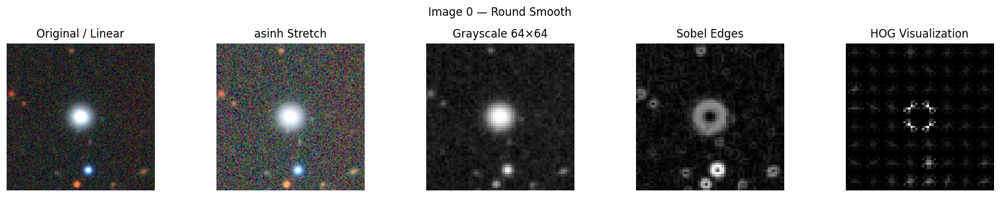

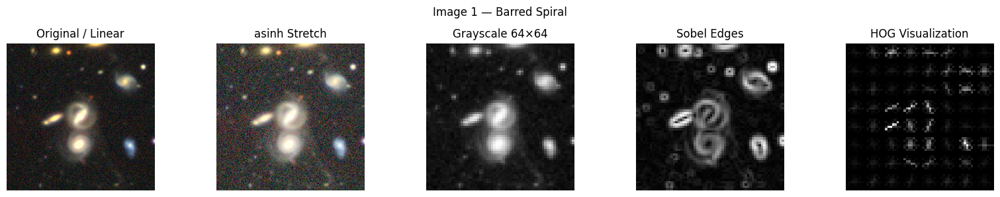

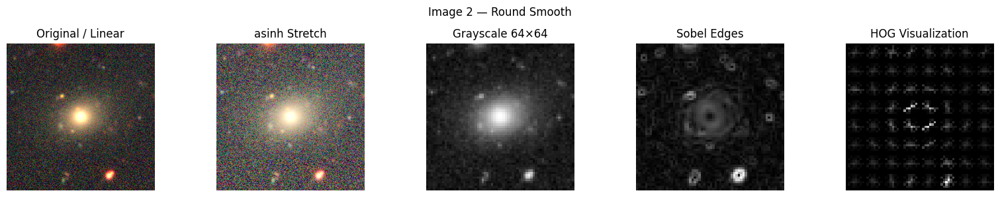

TEST feature-engineering examples


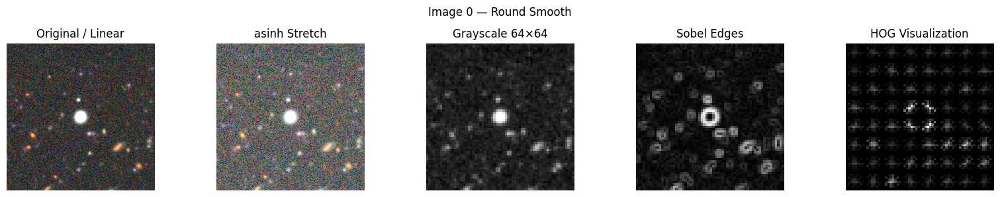

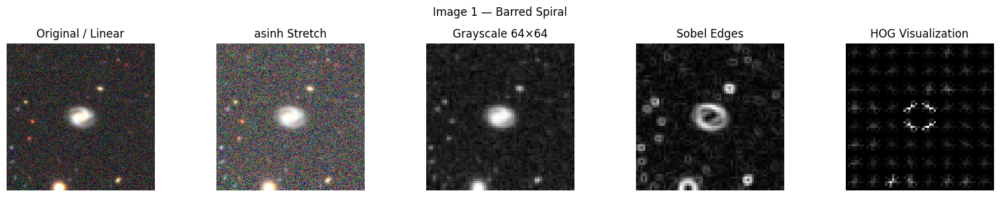

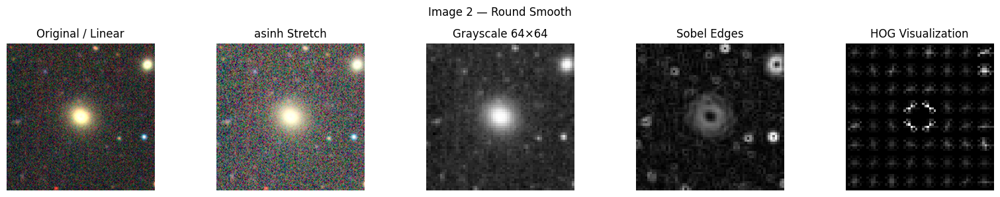

In [12]:
def representative_indices(labels, n=3):
    labels = np.asarray(labels)
    classes = sorted(np.unique(labels))
    selected = []

    for class_id in classes:
        class_indices = np.flatnonzero(
            labels == class_id
        )

        if len(class_indices) > 0:
            selected.append(
                int(class_indices[0])
            )

    cursor = {
        class_id: 1
        for class_id in classes
    }

    while len(selected) < n:
        for class_id in classes:
            class_indices = np.flatnonzero(
                labels == class_id
            )

            position = cursor[class_id]

            if position < len(class_indices):
                selected.append(
                    int(class_indices[position])
                )
                cursor[class_id] += 1

            if len(selected) >= n:
                break

    return selected[:n]


def visualize_processing_flow(
    images,
    labels,
    indices,
    stretch="asinh",
    size=64
):
    for index in indices:
        _, _, visuals = extract_one_image_features(
            images[index],
            method="hog_color_stats",
            size=size,
            stretch=stretch,
            return_visuals=True
        )

        original = normalize_image(
            images[index],
            stretch="linear"
        )
        stretched = normalize_image(
            images[index],
            stretch=stretch
        )

        fig, axes = plt.subplots(
            1,
            5,
            figsize=(16, 3)
        )

        axes[0].imshow(original)
        axes[0].set_title("Original / Linear")

        axes[1].imshow(stretched)
        axes[1].set_title(
            f"{stretch} Stretch"
        )

        axes[2].imshow(
            visuals["gray"],
            cmap="gray"
        )
        axes[2].set_title(
            f"Grayscale {size}×{size}"
        )

        axes[3].imshow(
            visuals["edges"],
            cmap="gray"
        )
        axes[3].set_title("Sobel Edges")

        axes[4].imshow(
            visuals["hog"],
            cmap="gray"
        )
        axes[4].set_title("HOG Visualization")

        for ax in axes:
            ax.axis("off")

        plt.suptitle(
            f"Image {index} — "
            f"{CLASS_NAMES[int(labels[index])]}"
        )
        plt.tight_layout()
        plt.show()


train_example_indices = representative_indices(
    y_train,
    n=3
)
test_example_indices = representative_indices(
    y_test,
    n=3
)

print("TRAIN feature-engineering examples")
visualize_processing_flow(
    X_train_img,
    y_train,
    train_example_indices,
    stretch="asinh",
    size=64
)

print("TEST feature-engineering examples")
visualize_processing_flow(
    X_test_img,
    y_test,
    test_example_indices,
    stretch="asinh",
    size=64
)

## Visual Demonstration of Course-Taught Image Features

The next figures make the techniques from the image-processing lecture concrete on real Galaxy10 data.

The first figure shows image-domain transformations: contrast-stretched grayscale, binary thresholding, and histogram equalization.

The second figure shows statistical representations: normalized grayscale histogram, cumulative histogram, local/sub-region histograms, and a 2D joint histogram between two image channels.

### Course-Taught Image Transformations

**Why**  
Demonstrate that the notebook does not rely only on advanced HOG features; it explicitly implements the basic image-processing Feature Engineering taught in class.

**What**  
Show grayscale, binary thresholding, histogram equalization, global normalized histogram, cumulative histogram, local histograms, and a 2D joint channel histogram.

**How**  
One representative training image is normalized, resized, transformed, and summarized with the same helper functions used by the benchmark below.

**Expected result**  
Two clear figures showing both image-domain transformations and histogram-based feature representations.

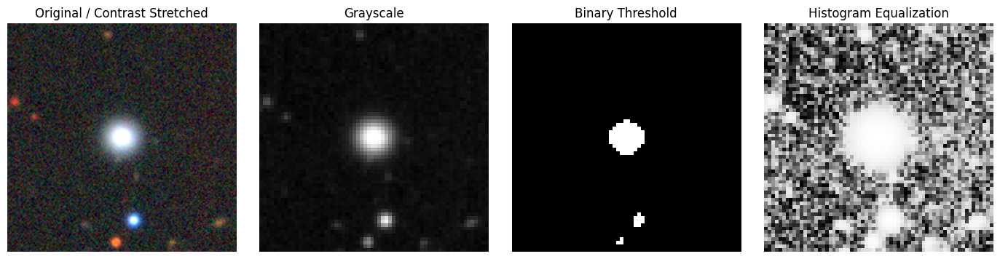

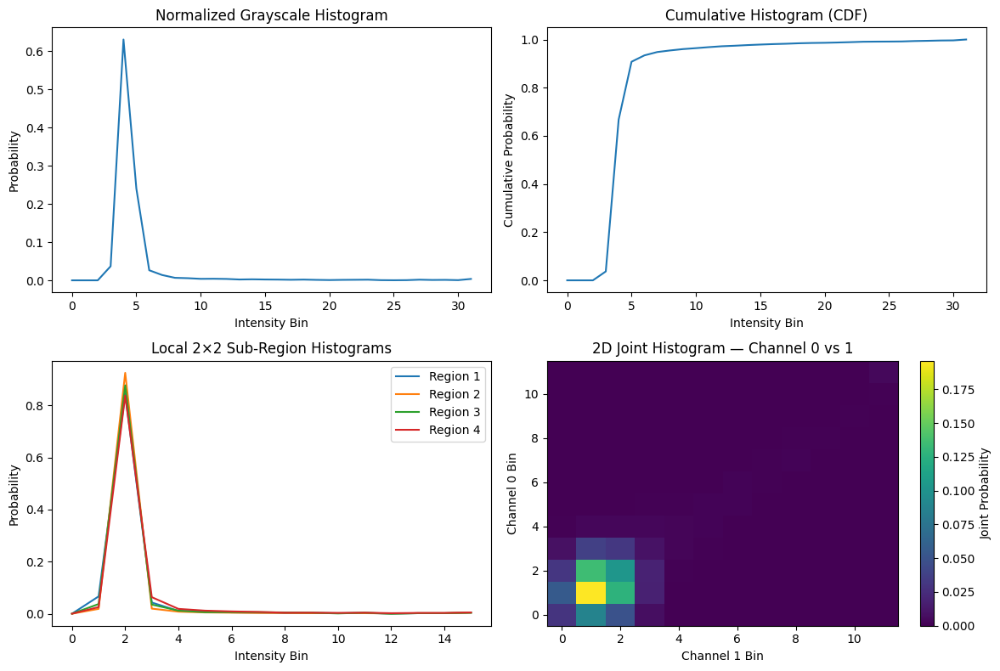

In [13]:
course_example_index = int(
    representative_indices(
        y_train,
        n=2
    )[0]
)

course_image = normalize_image(
    X_train_img[course_example_index],
    stretch="linear"
)

course_gray = resize_gray(
    course_image,
    size=64
)

course_binary = thresholded_grayscale(
    course_gray,
    threshold=0.5
)

course_equalized = equalized_grayscale(
    course_gray
)

fig, axes = plt.subplots(
    1,
    4,
    figsize=(14, 3.5)
)

axes[0].imshow(course_image)
axes[0].set_title("Original / Contrast Stretched")

axes[1].imshow(
    course_gray,
    cmap="gray"
)
axes[1].set_title("Grayscale")

axes[2].imshow(
    course_binary,
    cmap="gray"
)
axes[2].set_title("Binary Threshold")

axes[3].imshow(
    course_equalized,
    cmap="gray"
)
axes[3].set_title("Histogram Equalization")

for ax in axes:
    ax.axis("off")

plt.tight_layout()
plt.show()


global_hist = grayscale_histogram(
    course_gray,
    bins=32,
    normalize=True
)

global_cdf = cumulative_grayscale_histogram(
    course_gray,
    bins=32
)

local_hist = local_grayscale_histograms(
    course_gray,
    grid_size=2,
    bins=16
).reshape(4, 16)

joint_hist = joint_band_histograms(
    course_image,
    bins=12
)[: 12 * 12].reshape(12, 12)

fig, axes = plt.subplots(
    2,
    2,
    figsize=(12, 8)
)

axes[0, 0].plot(global_hist)
axes[0, 0].set_title(
    "Normalized Grayscale Histogram"
)
axes[0, 0].set_xlabel("Intensity Bin")
axes[0, 0].set_ylabel("Probability")

axes[0, 1].plot(global_cdf)
axes[0, 1].set_title(
    "Cumulative Histogram (CDF)"
)
axes[0, 1].set_xlabel("Intensity Bin")
axes[0, 1].set_ylabel("Cumulative Probability")

for region_idx in range(4):
    axes[1, 0].plot(
        local_hist[region_idx],
        label=f"Region {region_idx + 1}"
    )

axes[1, 0].set_title(
    "Local 2×2 Sub-Region Histograms"
)
axes[1, 0].set_xlabel("Intensity Bin")
axes[1, 0].set_ylabel("Probability")
axes[1, 0].legend()

im = axes[1, 1].imshow(
    joint_hist,
    origin="lower",
    aspect="auto"
)
axes[1, 1].set_title(
    "2D Joint Histogram — Channel 0 vs 1"
)
axes[1, 1].set_xlabel("Channel 1 Bin")
axes[1, 1].set_ylabel("Channel 0 Bin")
fig.colorbar(
    im,
    ax=axes[1, 1],
    label="Joint Probability"
)

plt.tight_layout()
plt.show()

## Color-Band Histograms by Class

The plot below compares average normalized intensity histograms for the three image channels. This helps determine whether color-band information contributes useful separation in addition to morphology.

### Color-Band Histogram Comparison

**Why**  
Check whether the three astronomical channels contain discriminative information.

**What**  
Compare average normalized channel histograms between the two classes.

**How**  
Histograms are calculated per image and averaged within each class.

**Expected result**  
Three channel plots showing similarities or differences between morphologies.

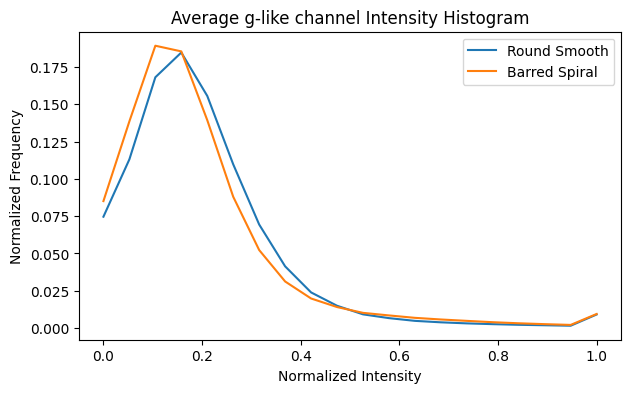

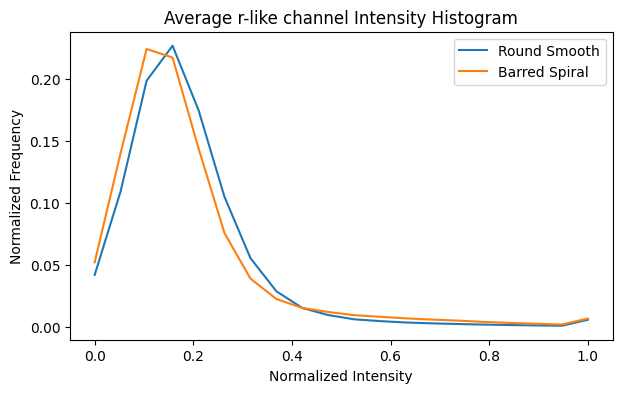

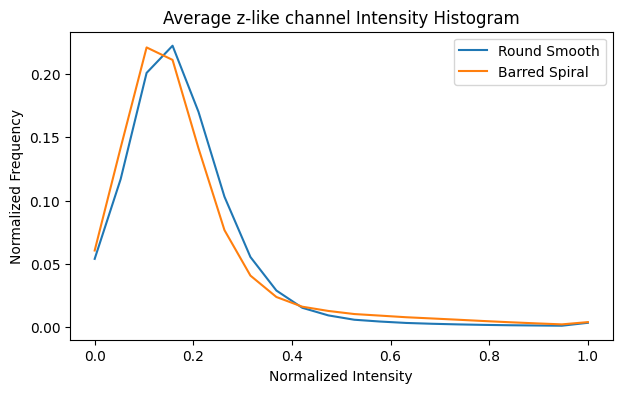

In [14]:
def mean_channel_histograms(images, labels, sample_per_class=500, bins=20):
    results = {}

    rng = np.random.default_rng(RANDOM_STATE)

    for class_id in sorted(np.unique(labels)):
        class_indices = np.flatnonzero(labels == class_id)
        if len(class_indices) > sample_per_class:
            class_indices = rng.choice(
                class_indices,
                sample_per_class,
                replace=False
            )

        hists = []
        for idx in class_indices:
            image = normalize_image(images[idx], stretch="linear")
            hist = color_histogram(image, bins=bins)
            hists.append(hist.reshape(3, bins))

        results[class_id] = np.mean(hists, axis=0)

    return results


hist_results = mean_channel_histograms(
    X_train_img,
    y_train,
    sample_per_class=500,
    bins=20
)

band_names = ["g-like channel", "r-like channel", "z-like channel"]
x = np.linspace(0, 1, 20)

for band_idx, band_name in enumerate(band_names):
    plt.figure(figsize=(7, 4))

    for class_id, class_hist in hist_results.items():
        plt.plot(
            x,
            class_hist[band_idx],
            label=CLASS_NAMES[class_id]
        )

    plt.title(f"Average {band_name} Intensity Histogram")
    plt.xlabel("Normalized Intensity")
    plt.ylabel("Normalized Frequency")
    plt.legend()
    plt.show()

## 5-Fold Benchmark of Course-Taught Image Features

The benchmark below evaluates the relevant taught image representations with the **same 5-fold Macro-F1 framework** and a fixed KNN configuration. This isolates the representation itself before the later Bonus 6A hyperparameter search.

The advanced HOG/morphology representations remain in the Bonus section and are compared against these course baselines.

### Course Feature Representation Benchmark

This benchmark is intentionally small and controlled: only the image representation changes.

**Why**  
Verify empirically which course-taught image features are useful for Galaxy10 rather than merely demonstrating them visually.

**What**  
Compare raw grayscale pixels, normalized global histogram, cumulative histogram, channel histogram, local histograms, 2D joint histograms, histogram-equalized pixels, and thresholded binary pixels.

**How**  
Each representation is evaluated with 5-fold stratified CV using a fixed KNN baseline: `k=3`, uniform voting, Euclidean distance, and Min-Max scaling to `[-1,1]`.

**Expected result**  
A DataFrame and labeled bar chart showing the mean Macro-F1 and standard deviation of every course-taught representation.

Course feature benchmark: raw_gray_32
Course feature benchmark: normalized_gray_hist
Course feature benchmark: cumulative_gray_hist
Course feature benchmark: channel_histograms
Course feature benchmark: local_histograms
Course feature benchmark: joint_band_histograms
Course feature benchmark: equalized_gray_pixels
Course feature benchmark: binary_threshold_pixels


,feature_representation,mean_macro_f1,std_macro_f1,fold_1,fold_2,fold_3,fold_4,fold_5,feature_count
0,binary_threshold_pixels,0.8164,0.0152,0.8085,0.8337,0.7948,0.8111,0.8337,1024
1,joint_band_histograms,0.7878,0.0222,0.7956,0.8265,0.7834,0.7641,0.7694,288
2,normalized_gray_hist,0.7850,0.0194,0.7660,0.8056,0.8075,0.7855,0.7606,32
3,channel_histograms,0.7844,0.0109,0.7689,0.8019,0.7887,0.7828,0.7796,48
4,cumulative_gray_hist,0.7811,0.0162,0.7712,0.7976,0.8035,0.7633,0.7699,32
5,local_histograms,0.7275,0.0135,0.7335,0.7386,0.7410,0.7190,0.7053,64
6,raw_gray_32,0.7156,0.0148,0.6894,0.7339,0.7199,0.7223,0.7127,1024
7,equalized_gray_pixels,0.5378,0.0160,0.5261,0.5551,0.5475,0.5125,0.5481,1024


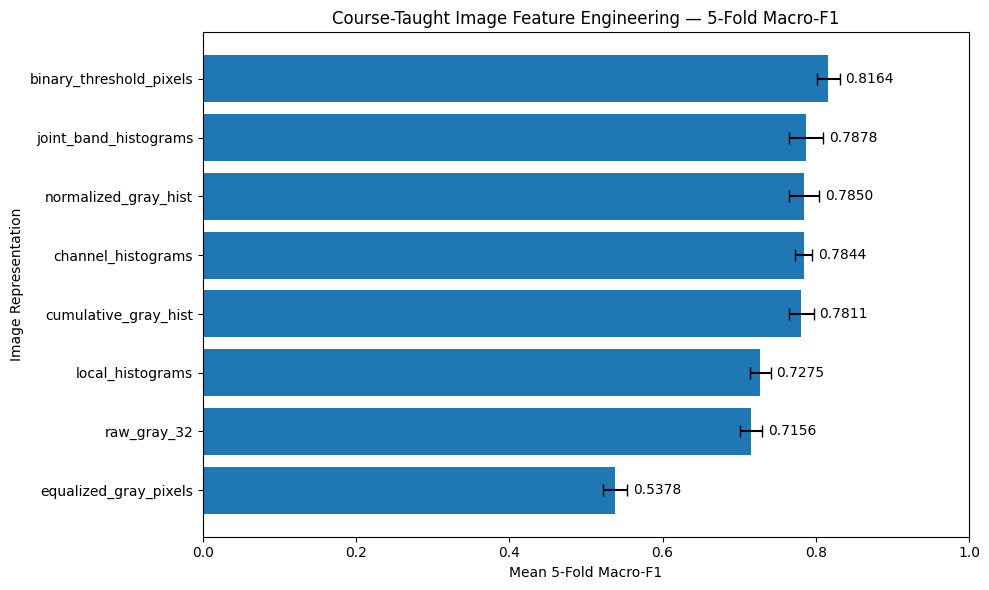

In [15]:
COURSE_FEATURE_CONFIGS = {
    "raw_gray_32": {
        "method": "raw_gray",
        "size": 32,
        "stretch": "linear"
    },
    "normalized_gray_hist": {
        "method": "gray_hist",
        "size": 64,
        "stretch": "linear"
    },
    "cumulative_gray_hist": {
        "method": "gray_cdf",
        "size": 64,
        "stretch": "linear"
    },
    "channel_histograms": {
        "method": "channel_hist",
        "size": 64,
        "stretch": "linear"
    },
    "local_histograms": {
        "method": "local_hist",
        "size": 64,
        "stretch": "linear"
    },
    "joint_band_histograms": {
        "method": "joint_hist",
        "size": 64,
        "stretch": "linear"
    },
    "equalized_gray_pixels": {
        "method": "equalized_raw",
        "size": 32,
        "stretch": "linear"
    },
    "binary_threshold_pixels": {
        "method": "binary_raw",
        "size": 32,
        "stretch": "linear"
    }
}

course_feature_cache = {}
course_feature_results = []

for config_name, settings in COURSE_FEATURE_CONFIGS.items():
    print(
        "Course feature benchmark:",
        config_name
    )

    X_course, _ = extract_feature_matrix(
        X_train_img,
        method=settings["method"],
        size=settings["size"],
        stretch=settings["stretch"]
    )

    course_feature_cache[
        config_name
    ] = X_course

    model = Pipeline([
        (
            "scaler",
            MinMaxScaler(
                feature_range=(-1, 1)
            )
        ),
        (
            "knn",
            KNeighborsClassifier(
                n_neighbors=3,
                weights="uniform",
                metric="euclidean",
                algorithm="brute",
                n_jobs=1
            )
        )
    ])

    scores = cross_val_score(
        model,
        X_course,
        y_train,
        cv=CV,
        scoring="f1_macro",
        n_jobs=PARALLEL_JOBS,
        pre_dispatch=PARALLEL_JOBS
    )

    course_feature_results.append({
        "feature_representation": config_name,
        "mean_macro_f1": scores.mean(),
        "std_macro_f1": scores.std(),
        "fold_1": scores[0],
        "fold_2": scores[1],
        "fold_3": scores[2],
        "fold_4": scores[3],
        "fold_5": scores[4],
        "feature_count": X_course.shape[1]
    })

course_feature_results_df = (
    pd.DataFrame(course_feature_results)
    .sort_values(
        "mean_macro_f1",
        ascending=False
    )
    .reset_index(drop=True)
)

display(
    course_feature_results_df.round(4)
)

plot_df = (
    course_feature_results_df
    .sort_values(
        "mean_macro_f1",
        ascending=True
    )
)

fig, ax = plt.subplots(
    figsize=(10, 6)
)

bars = ax.barh(
    plot_df["feature_representation"],
    plot_df["mean_macro_f1"],
    xerr=plot_df["std_macro_f1"],
    capsize=4
)

ax.bar_label(
    bars,
    labels=[
        f"{value:.4f}"
        for value in plot_df[
            "mean_macro_f1"
        ]
    ],
    padding=4
)

ax.set_title(
    "Course-Taught Image Feature Engineering — 5-Fold Macro-F1"
)
ax.set_xlabel(
    "Mean 5-Fold Macro-F1"
)
ax.set_ylabel(
    "Image Representation"
)
ax.set_xlim(0, 1)

plt.tight_layout()
plt.show()

# Part 3 — KNN Learning Algorithm

The project uses scikit-learn's `KNeighborsClassifier`, as permitted by the course.

For each new feature vector, KNN:

1. computes its distance from the stored training examples,
2. selects the `k` nearest examples,
3. combines their labels using the selected voting rule,
4. predicts the class with the strongest vote.

### Hyperparameters evaluated

- **`n_neighbors` (`k`)** — neighborhood size  
  Final focused search: `3, 9, 10, 11, 20`.

- **Voting weights**
  - `uniform`
  - `distance`

- **Distance metric**
  - Manhattan
  - Euclidean
  - Chebyshev
  - Cosine

- **Feature scaling**
  - `StandardScaler`
  - `RobustScaler`
  - `MinMaxScaler(feature_range=(-1, 1))`

Scaling and distance selection are especially important for KNN because the model makes its prediction entirely from distances in the transformed feature space.

### Numerically Stable KNN Training and Prediction Pipeline

This block preserves the same data, selected features, and KNN semantics while eliminating the floating-point overflow that appeared when direct cosine calculations were performed on scaled float32 matrices.

**Why**  
Keep the course-required KNN workflow numerically stable without suppressing warnings or clipping feature values.

**What**  
Promote features to float64 before scaling; for cosine, use the exact L2-normalization identity and convert distance-weighted voting back to inverse cosine distance.

**How**  
The pipeline uses mathematically equivalent cosine neighbor ordering and weighting. No image, feature, observation, or model-selection option is removed.

**Expected result**  
The same model predictions and model-selection logic, but without overflow/invalid-matmul warnings.

In [16]:
def to_float64_features(X):
    """Promote feature matrices before scaling/distance calculations."""
    return np.asarray(
        X,
        dtype=np.float64
    )


def cosine_distance_weights(
    normalized_euclidean_distances
):
    """
    Exact inverse-cosine-distance weights using the identity

        cosine_distance = 0.5 * ||x_hat - y_hat||^2

    for L2-normalized vectors.
    """
    distances = np.asarray(
        normalized_euclidean_distances,
        dtype=np.float64
    )

    cosine_distances = (
        0.5
        * np.square(distances)
    )

    with np.errstate(
        divide="ignore",
        invalid="ignore"
    ):
        weights = (
            1.0
            / cosine_distances
        )

    # Match sklearn's distance-weight semantics for an exact match:
    # zero-distance neighbors receive all the vote mass.
    infinite = np.isinf(weights)

    if weights.ndim == 2:
        rows_with_exact_match = (
            infinite.any(axis=1)
        )

        if rows_with_exact_match.any():
            weights[
                rows_with_exact_match
            ] = infinite[
                rows_with_exact_match
            ].astype(np.float64)

    elif infinite.any():
        weights = (
            infinite.astype(
                np.float64
            )
        )

    return weights


def reported_neighbor_distances(
    internal_distances,
    distance_metric
):
    """Convert internal stable-cosine distances back to cosine distance."""
    internal_distances = np.asarray(
        internal_distances,
        dtype=np.float64
    )

    if distance_metric == "cosine":
        return (
            0.5
            * np.square(
                internal_distances
            )
        )

    return internal_distances


def make_scaler(name):
    if name == "standard":
        return StandardScaler()

    if name == "robust":
        return RobustScaler()

    if name == "minmax_m1_1":
        return MinMaxScaler(
            feature_range=(-1, 1)
        )

    raise ValueError(
        "name must be 'standard', 'robust', "
        "or 'minmax_m1_1'"
    )


def make_sampler(name):
    if name == "none":
        return None

    if name == "random_over":
        return RandomOverSampler(
            random_state=RANDOM_STATE
        )

    if name == "random_under":
        return RandomUnderSampler(
            random_state=RANDOM_STATE
        )

    if name == "smote":
        return SMOTE(
            random_state=RANDOM_STATE,
            k_neighbors=5
        )

    raise ValueError(
        f"Unknown sampling method: {name}"
    )


def build_knn_pipeline(
    n_neighbors,
    weights,
    distance_metric,
    scaler_name,
    sampling_name="none",
    knn_n_jobs=1
):
    """
    Build the exact learning pipeline used by validation/final training.

    For cosine distance, sklearn's direct float32 cosine implementation is
    avoided. After promotion to float64 and scaling, vectors are L2-normalized.
    Euclidean neighbor search on normalized vectors has exactly the same
    neighbor ordering because:

        ||x_hat - y_hat||^2 = 2 * cosine_distance

    Distance-weighted cosine KNN is also preserved by converting the internal
    normalized-Euclidean distances back to cosine distance in the weight
    callable.
    """
    scaler = make_scaler(
        scaler_name
    )
    sampler = make_sampler(
        sampling_name
    )

    steps = [
        (
            "float64",
            FunctionTransformer(
                to_float64_features,
                validate=False
            )
        ),
        (
            "scaler",
            scaler
        )
    ]

    if sampler is not None:
        steps.append(
            (
                "sampler",
                sampler
            )
        )

    if distance_metric == "cosine":
        steps.append(
            (
                "cosine_normalizer",
                Normalizer(
                    norm="l2"
                )
            )
        )

        knn_metric = "euclidean"

        if weights == "distance":
            knn_weights = (
                cosine_distance_weights
            )
        else:
            knn_weights = "uniform"

    else:
        knn_metric = distance_metric
        knn_weights = weights

    steps.append(
        (
            "knn",
            KNeighborsClassifier(
                n_neighbors=n_neighbors,
                weights=knn_weights,
                metric=knn_metric,
                algorithm="brute",
                n_jobs=knn_n_jobs
            )
        )
    )

    return ImbPipeline(
        steps
    )


def train_knn(
    X_train,
    y_train,
    n_neighbors=9,
    weights="distance",
    distance_metric="euclidean",
    scaler_name="standard",
    sampling_name="none"
):
    model = build_knn_pipeline(
        n_neighbors=n_neighbors,
        weights=weights,
        distance_metric=distance_metric,
        scaler_name=scaler_name,
        sampling_name=sampling_name,
        knn_n_jobs=1
    )

    model.fit(
        X_train,
        y_train
    )
    return model


def predict_knn(model, X):
    return model.predict(X)


def macro_f1(y_true, y_pred):
    return f1_score(
        y_true,
        y_pred,
        average="macro"
    )

## Course-Taught Scaling and Normalization Benchmark

KNN is distance-based, so feature magnitude directly affects which observations are considered nearest.

The general Feature Engineering lecture covers Min-Max `[0,1]`, Min-Max `[-1,1]`, centralization, standardization, L1 normalization, and L2 normalization. The project additionally tests RobustScaler as a bonus technique.

The benchmark below compares all of these transformations under the same fixed KNN configuration using 5-fold Macro-F1.

### Scaling / Normalization Coverage Benchmark

This is a course-alignment experiment rather than the final hyperparameter search.

**Why**  
Show that the notebook understands and tests the scaling strategies taught in class, which is particularly important for a distance-based algorithm.

**What**  
Compare no scaling, centralization, standardization, Min-Max `[0,1]`, Min-Max `[-1,1]`, L1 sample normalization, L2 sample normalization, and RobustScaler.

**How**  
Every transformer is placed inside a 5-fold CV pipeline with the same HOG+color+morphology representation and fixed `k=3`, uniform voting, Euclidean KNN.

**Expected result**  
A table and labeled bar chart showing how strongly the choice of scaling/normalization affects Macro-F1.

,scaling_method,mean_macro_f1,std_macro_f1,fold_1,fold_2,fold_3,fold_4,fold_5
0,robust_bonus,0.8269,0.0166,0.8125,0.8518,0.8052,0.8296,0.8353
1,none,0.7815,0.0270,0.7738,0.8058,0.7386,0.8149,0.7746
2,centralization,0.7815,0.0270,0.7738,0.8058,0.7386,0.8149,0.7746
3,l2_sample_normalization,0.7802,0.0278,0.7738,0.8010,0.7351,0.8165,0.7746
4,l1_sample_normalization,0.7763,0.0231,0.7750,0.7990,0.7344,0.7963,0.7767
5,minmax_0_1,0.7759,0.0254,0.7581,0.8058,0.7393,0.8016,0.7746
6,minmax_m1_1,0.7759,0.0254,0.7581,0.8058,0.7393,0.8016,0.7746
7,standardization,0.7672,0.0193,0.7581,0.7790,0.7368,0.7938,0.7683


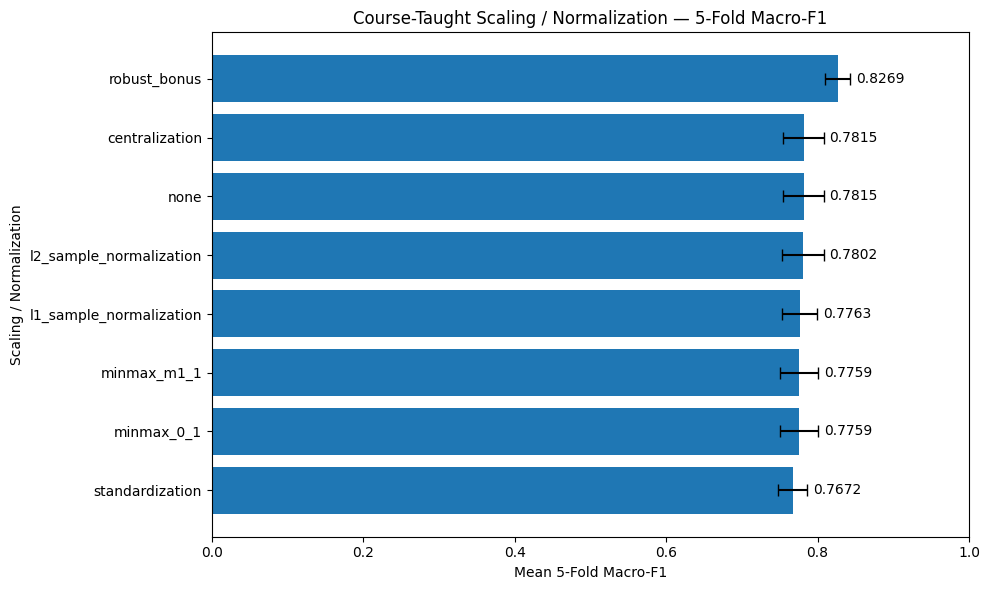

In [17]:
course_scalers = {
    "none": FunctionTransformer(
        validate=False
    ),
    "centralization": StandardScaler(
        with_std=False
    ),
    "standardization": StandardScaler(),
    "minmax_0_1": MinMaxScaler(
        feature_range=(0, 1)
    ),
    "minmax_m1_1": MinMaxScaler(
        feature_range=(-1, 1)
    ),
    "l1_sample_normalization": Normalizer(
        norm="l1"
    ),
    "l2_sample_normalization": Normalizer(
        norm="l2"
    ),
    "robust_bonus": RobustScaler()
}

course_scaling_features, _ = extract_feature_matrix(
    X_train_img,
    method="hog_color_stats",
    size=64,
    stretch="linear"
)

course_scaling_results = []

for scaler_name, transformer in course_scalers.items():
    model = Pipeline([
        ("float64", FunctionTransformer(to_float64_features, validate=False)),
        ("scaler", transformer),
        (
            "knn",
            KNeighborsClassifier(
                n_neighbors=3,
                weights="uniform",
                metric="euclidean",
                algorithm="brute",
                n_jobs=1
            )
        )
    ])

    scores = cross_val_score(
        model,
        course_scaling_features,
        y_train,
        cv=CV,
        scoring="f1_macro",
        n_jobs=PARALLEL_JOBS,
        pre_dispatch=PARALLEL_JOBS
    )

    course_scaling_results.append({
        "scaling_method": scaler_name,
        "mean_macro_f1": scores.mean(),
        "std_macro_f1": scores.std(),
        "fold_1": scores[0],
        "fold_2": scores[1],
        "fold_3": scores[2],
        "fold_4": scores[3],
        "fold_5": scores[4]
    })

course_scaling_results_df = (
    pd.DataFrame(course_scaling_results)
    .sort_values(
        "mean_macro_f1",
        ascending=False
    )
    .reset_index(drop=True)
)

display(
    course_scaling_results_df.round(4)
)

plot_df = (
    course_scaling_results_df
    .sort_values(
        "mean_macro_f1",
        ascending=True
    )
)

fig, ax = plt.subplots(
    figsize=(10, 6)
)

bars = ax.barh(
    plot_df["scaling_method"],
    plot_df["mean_macro_f1"],
    xerr=plot_df["std_macro_f1"],
    capsize=4
)

ax.bar_label(
    bars,
    labels=[
        f"{value:.4f}"
        for value in plot_df[
            "mean_macro_f1"
        ]
    ],
    padding=4
)

ax.set_title(
    "Course-Taught Scaling / Normalization — 5-Fold Macro-F1"
)
ax.set_xlabel(
    "Mean 5-Fold Macro-F1"
)
ax.set_ylabel(
    "Scaling / Normalization"
)
ax.set_xlim(0, 1)

plt.tight_layout()
plt.show()

## Course-Taught KNN Distance Metrics for Image Data

The KNN lecture covers Manhattan, Euclidean, and Chebyshev distances directly, and also discusses Cosine similarity, Histogram Intersection, and Mahalanobis distance in the image-processing context.

Not every metric is appropriate for every representation. Histogram Intersection is naturally defined on normalized histograms, while Mahalanobis requires a covariance model. Therefore, the following compact experiment uses the normalized channel-histogram representation, where all six techniques can be compared meaningfully.

The universal main Grid Search later still tests the distance metrics that are directly compatible with all feature representations: Manhattan, Euclidean, Chebyshev, and Cosine.

### Numerically Stable Course-Taught Image Distance Benchmark

The mathematical techniques are unchanged, but the implementations of Cosine and Mahalanobis are made numerically stable so that the benchmark can be shown without overflow or invalid-matrix warnings.

**Why**  
Compare all KNN/image distances taught in class on the compact histogram representation.

**What**  
Use direct metrics where appropriate; evaluate cosine through the exact L2-normalized Euclidean equivalence; estimate Mahalanobis with a fold-local regularized covariance solved in float64.

**How**  
Every covariance/scaling calculation uses only its training fold, so no validation leakage is introduced.

**Expected result**  
The same six-row course-distance comparison with finite, warning-free calculations.

,distance_metric,mean_macro_f1,std_macro_f1,fold_1,fold_2,fold_3,fold_4,fold_5
0,manhattan,0.7281,0.0052,0.7299,0.7185,0.7344,0.7287,0.7289
1,histogram_intersection,0.7281,0.0052,0.7299,0.7185,0.7344,0.7287,0.7289
2,euclidean,0.7036,0.0150,0.7043,0.6850,0.7065,0.7292,0.6929
3,mahalanobis,0.6925,0.0182,0.6745,0.7270,0.6844,0.6928,0.6839
4,cosine,0.6868,0.0085,0.6887,0.6831,0.6953,0.6944,0.6723
5,chebyshev,0.6685,0.0126,0.6747,0.6539,0.6679,0.6887,0.6571


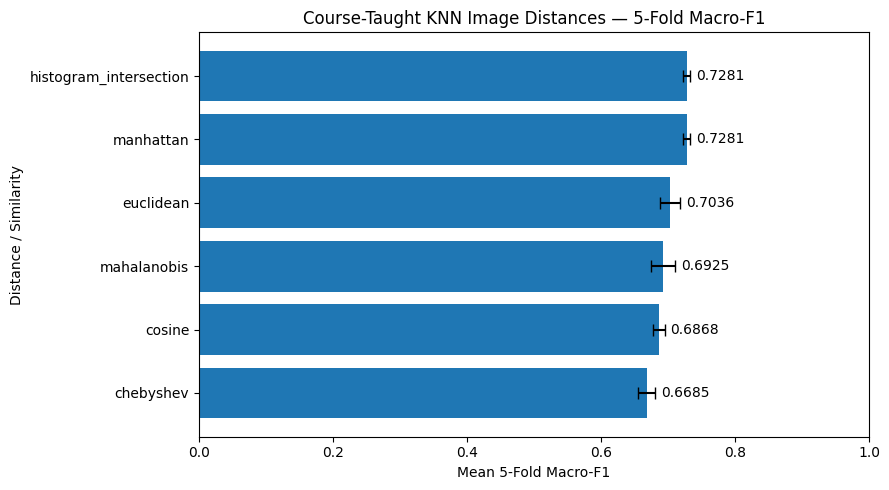

In [18]:
def histogram_intersection_distance(a, b):
    a = np.asarray(
        a,
        dtype=np.float64
    )
    b = np.asarray(
        b,
        dtype=np.float64
    )

    intersection = np.minimum(
        a,
        b
    ).sum()

    return float(
        1.0 - intersection
    )


X_hist_distance = to_float64_features(
    course_feature_cache[
        "channel_histograms"
    ]
)

X_hist_distance = (
    X_hist_distance
    /
    (
        X_hist_distance.sum(
            axis=1,
            keepdims=True
        )
        + 1e-12
    )
)

distance_methods = [
    "manhattan",
    "euclidean",
    "chebyshev",
    "cosine",
    "histogram_intersection",
    "mahalanobis"
]

course_distance_results = []

for distance_name in distance_methods:
    fold_scores = []

    for train_idx, validation_idx in CV.split(
        X_hist_distance,
        y_train
    ):
        X_fold_train = X_hist_distance[
            train_idx
        ]
        y_fold_train = y_train[
            train_idx
        ]

        X_fold_validation = X_hist_distance[
            validation_idx
        ]
        y_fold_validation = y_train[
            validation_idx
        ]

        if distance_name == "histogram_intersection":
            model = KNeighborsClassifier(
                n_neighbors=3,
                weights="uniform",
                metric=histogram_intersection_distance,
                algorithm="brute",
                n_jobs=1
            )

            fit_train = X_fold_train
            fit_validation = (
                X_fold_validation
            )

        elif distance_name == "mahalanobis":
            covariance = np.cov(
                X_fold_train,
                rowvar=False,
                dtype=np.float64
            )

            covariance = (
                0.5
                * (
                    covariance
                    + covariance.T
                )
            )

            mean_variance = float(
                np.mean(
                    np.diag(
                        covariance
                    )
                )
            )

            ridge = max(
                1e-8,
                1e-3 * mean_variance
            )

            regularized_covariance = (
                covariance
                + ridge
                * np.eye(
                    covariance.shape[0],
                    dtype=np.float64
                )
            )

            # Solve C * VI = I instead of a general pseudo-inverse.
            # The ridge makes the covariance matrix nonsingular.
            inverse_covariance = np.linalg.solve(
                regularized_covariance,
                np.eye(
                    regularized_covariance.shape[0],
                    dtype=np.float64
                )
            )

            model = KNeighborsClassifier(
                n_neighbors=3,
                weights="uniform",
                metric="mahalanobis",
                metric_params={
                    "VI":
                        inverse_covariance
                },
                algorithm="brute",
                n_jobs=1
            )

            fit_train = X_fold_train
            fit_validation = (
                X_fold_validation
            )

        elif distance_name == "cosine":
            # On L2-normalized vectors, Euclidean distance is a strictly
            # monotonic transformation of cosine distance, so uniform KNN
            # selects exactly the same neighbors without the unstable
            # direct matrix-product implementation.
            normalizer = Normalizer(
                norm="l2"
            )

            fit_train = (
                normalizer.fit_transform(
                    X_fold_train
                )
            )
            fit_validation = (
                normalizer.transform(
                    X_fold_validation
                )
            )

            model = KNeighborsClassifier(
                n_neighbors=3,
                weights="uniform",
                metric="euclidean",
                algorithm="brute",
                n_jobs=1
            )

        else:
            model = KNeighborsClassifier(
                n_neighbors=3,
                weights="uniform",
                metric=distance_name,
                algorithm="brute",
                n_jobs=1
            )

            fit_train = X_fold_train
            fit_validation = (
                X_fold_validation
            )

        model.fit(
            fit_train,
            y_fold_train
        )

        predictions = model.predict(
            fit_validation
        )

        fold_scores.append(
            f1_score(
                y_fold_validation,
                predictions,
                average="macro"
            )
        )

    course_distance_results.append({
        "distance_metric":
            distance_name,
        "mean_macro_f1":
            np.mean(fold_scores),
        "std_macro_f1":
            np.std(fold_scores),
        "fold_1": fold_scores[0],
        "fold_2": fold_scores[1],
        "fold_3": fold_scores[2],
        "fold_4": fold_scores[3],
        "fold_5": fold_scores[4]
    })

course_distance_results_df = (
    pd.DataFrame(
        course_distance_results
    )
    .sort_values(
        "mean_macro_f1",
        ascending=False
    )
    .reset_index(drop=True)
)

display(
    course_distance_results_df.round(
        4
    )
)

plot_df = (
    course_distance_results_df
    .sort_values(
        "mean_macro_f1",
        ascending=True
    )
)

fig, ax = plt.subplots(
    figsize=(9, 5)
)

bars = ax.barh(
    plot_df["distance_metric"],
    plot_df["mean_macro_f1"],
    xerr=plot_df["std_macro_f1"],
    capsize=4
)

ax.bar_label(
    bars,
    labels=[
        f"{value:.4f}"
        for value in plot_df[
            "mean_macro_f1"
        ]
    ],
    padding=4
)

ax.set_title(
    "Course-Taught KNN Image Distances — "
    "5-Fold Macro-F1"
)
ax.set_xlabel(
    "Mean 5-Fold Macro-F1"
)
ax.set_ylabel(
    "Distance / Similarity"
)
ax.set_xlim(0, 1)

plt.tight_layout()
plt.show()

# Part 4 / Bonus 6A — Full Feature Engineering + Hyperparameter Grid Search

The bonus requires a **Cartesian product** of Feature Engineering choices and KNN hyperparameters, evaluated using **5-fold cross-validation** on the provided training set.

The course-taught baseline experiments above establish coverage of the Feature Engineering, scaling, and image-distance techniques taught in class. Bonus 6A now performs the exhaustive final model-selection search over the feature representations and universally applicable KNN settings used for the final classifier.

### Feature configurations

| ID | Method | Size | Stretch |
|---|---|---:|---|
| `raw32_linear` | resized grayscale pixels | 32 | linear |
| `raw32_asinh` | resized grayscale pixels | 32 | asinh |
| `hog64_linear` | HOG | 64 | linear |
| `hog64_asinh` | HOG | 64 | asinh |
| `hog_color_stats64_linear` | HOG + histograms + morphology | 64 | linear |
| `hog_color_stats64_asinh` | HOG + histograms + morphology | 64 | asinh |

Each feature configuration is crossed with:

- scaler: **3** values — Standard, Robust, Min-Max `[-1,1]`
- `k`: **5** values — `3, 9, 10, 11, 20`
- weights: **2** values — uniform / distance
- distance metric: **4** values — Manhattan / Euclidean / Chebyshev / Cosine

Total:

\[
6 * 3 * 5 * 2 * 4 = 720
\]

complete permutations.

Each permutation is evaluated on 5 folds:

\[
720 * 5 = 3600
\]

training/validation fits.

The previous refined run selected **`k=10`**. The final search therefore checks its immediate neighborhood with `k=9`, `k=10`, and `k=11`, while retaining `k=3` as a clearly smaller-neighborhood reference and `k=20` as a substantially smoother high-k reference. This is the final focused k-search: it tests both sides of the current optimum without increasing the total number of permutations.

### Feature and Hyperparameter Search Space

The main exhaustive search now includes the core KNN choices taught in class plus the RobustScaler bonus extension.

**Why**  
Define the complete Bonus 6A Cartesian search before any result is known.

**What**  
Use six feature representations, three scalers, five k values, two voting rules, and four universally applicable KNN distances.

**How**  
GridSearchCV evaluates every Cartesian combination with the same 5-fold Macro-F1 procedure.

**Expected result**  
720 complete permutations and 3,600 fold-level model fits.

In [19]:
FEATURE_CONFIGS = {
    "raw32_linear": {
        "method": "raw_gray",
        "size": 32,
        "stretch": "linear"
    },
    "raw32_asinh": {
        "method": "raw_gray",
        "size": 32,
        "stretch": "asinh"
    },
    "hog64_linear": {
        "method": "hog",
        "size": 64,
        "stretch": "linear"
    },
    "hog64_asinh": {
        "method": "hog",
        "size": 64,
        "stretch": "asinh"
    },
    "hog_color_stats64_linear": {
        "method": "hog_color_stats",
        "size": 64,
        "stretch": "linear"
    },
    "hog_color_stats64_asinh": {
        "method": "hog_color_stats",
        "size": 64,
        "stretch": "asinh"
    }
}


SCALER_OPTIONS = [
    StandardScaler(),
    RobustScaler(),
    MinMaxScaler(
        feature_range=(-1, 1)
    )
]

K_VALUES = [
    3,
    9,
    10,
    11,
    20
]

WEIGHT_OPTIONS = [
    "uniform",
    "distance"
]

DISTANCE_OPTIONS = [
    "manhattan",
    "euclidean",
    "chebyshev",
    "cosine"
]

# Kept as a descriptive search-space dictionary so later visualizations
# use the same values as the actual Grid Search.
PARAM_GRID = {
    "scaler": SCALER_OPTIONS,
    "knn__n_neighbors": K_VALUES,
    "knn__weights": WEIGHT_OPTIONS,
    "distance_metric": DISTANCE_OPTIONS
}

TOTAL_PERMUTATIONS = (
    len(FEATURE_CONFIGS)
    * math.prod(
        len(values)
        for values in PARAM_GRID.values()
    )
)

TOTAL_CV_FITS = (
    TOTAL_PERMUTATIONS
    * CV.get_n_splits()
)

print("k values tested:", PARAM_GRID["knn__n_neighbors"])
print("Complete permutations:", TOTAL_PERMUTATIONS)
print("5-fold model fits:", TOTAL_CV_FITS)


k values tested: [3, 9, 10, 11, 20]
Complete permutations: 720
5-fold model fits: 3600


## Visualizing the Required 5-Fold Cross-Validation Split

**Why:** The bonus explicitly requires each complete permutation to be evaluated five times, each time using four folds for training and one fold for validation.

**What:** The table and graph below verify that every validation fold contains both classes in nearly the same proportions.

**How:** `StratifiedKFold` preserves the class ratio while rotating which observations serve as validation data.

**Expected result:** Five validation folds with similar class percentages and no use of the external test set.

### Five-Fold Stratification Verification

**Why**  
Verify the required 5-fold validation setup.

**What**  
Show each fold's training size, validation size, and class percentages.

**How**  
StratifiedKFold rotates one fold into validation while preserving class ratios.

**Expected result**  
Five validation folds with nearly identical class proportions.

,fold,class,validation_count,validation_percentage,training_size,validation_size
0,Fold 1,Round Smooth,424,56.533333,3000,750
1,Fold 1,Barred Spiral,326,43.466667,3000,750
2,Fold 2,Round Smooth,423,56.400000,3000,750
3,Fold 2,Barred Spiral,327,43.600000,3000,750
4,Fold 3,Round Smooth,423,56.400000,3000,750
5,Fold 3,Barred Spiral,327,43.600000,3000,750
6,Fold 4,Round Smooth,423,56.400000,3000,750
7,Fold 4,Barred Spiral,327,43.600000,3000,750
8,Fold 5,Round Smooth,423,56.400000,3000,750
9,Fold 5,Barred Spiral,327,43.600000,3000,750


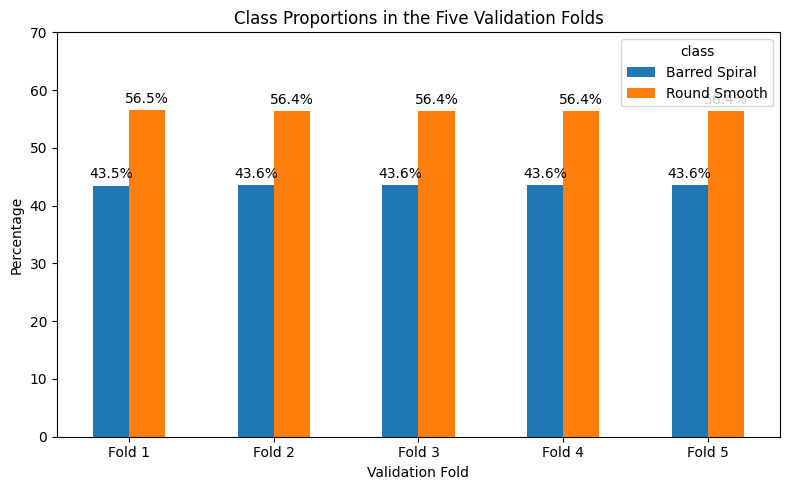

In [20]:
cv_rows = []

for fold_number, (train_idx, validation_idx) in enumerate(
    CV.split(np.zeros(len(y_train)), y_train),
    start=1
):
    fold_labels = y_train[validation_idx]
    counts = pd.Series(fold_labels).value_counts().sort_index()

    for class_id in sorted(np.unique(y_train)):
        cv_rows.append({
            "fold": f"Fold {fold_number}",
            "class": CLASS_NAMES[int(class_id)],
            "validation_count": int(counts.get(class_id, 0)),
            "validation_percentage": float(
                100 * np.mean(fold_labels == class_id)
            ),
            "training_size": len(train_idx),
            "validation_size": len(validation_idx)
        })

cv_distribution_df = pd.DataFrame(cv_rows)
display(cv_distribution_df)

cv_plot = cv_distribution_df.pivot(
    index="fold",
    columns="class",
    values="validation_percentage"
)

ax = cv_plot.plot(
    kind="bar",
    figsize=(8, 5)
)

for container in ax.containers:
    ax.bar_label(
        container,
        fmt="%.1f%%",
        padding=3
    )

ax.set_title(
    "Class Proportions in the Five Validation Folds"
)
ax.set_xlabel("Validation Fold")
ax.set_ylabel("Percentage")
ax.set_ylim(0, 70)
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

### Feature Matrix Cache

Feature extraction is deterministic and sample-wise, so it is safely computed once per representation and reused. This greatly reduces runtime without fitting any population-dependent preprocessing outside the CV folds.

**Why**  
Avoid repeatedly recomputing deterministic image features during Grid Search.

**What**  
Extract every planned Feature Engineering representation once for the Train images.

**How**  
Feature extraction is sample-wise and has no fitted population statistics, so caching does not leak validation information.

**Expected result**  
Six cached feature matrices with dimensions and extraction times.

In [21]:
feature_cache = {}

for config_name, config in FEATURE_CONFIGS.items():
    start = time.time()

    X_features, groups = extract_feature_matrix(
        X_train_img,
        method=config["method"],
        size=config["size"],
        stretch=config["stretch"]
    )

    feature_cache[config_name] = {
        "X_train": X_features,
        "groups": groups,
        "config": config
    }

    print(
        f"{config_name}: shape={X_features.shape}, "
        f"time={time.time() - start:.1f}s"
    )

raw32_linear: shape=(3750, 1024), time=9.8s
raw32_asinh: shape=(3750, 1024), time=14.4s
hog64_linear: shape=(3750, 1764), time=24.6s
hog64_asinh: shape=(3750, 1764), time=29.2s
hog_color_stats64_linear: shape=(3750, 1817), time=28.7s
hog_color_stats64_asinh: shape=(3750, 1817), time=32.9s


## Full Cartesian Grid Search Results — All 720 Permutations

The following table is intentionally **not truncated to only the best candidates**. The assignment explicitly requires all permutations and their average cross-validation results to be presented.

The table is sorted by mean 5-fold Macro-F1 so the reason for selecting the first-ranked configuration is directly visible while every alternative remains available for comparison.

### Stable Full 720-Permutation Cartesian Grid Search

The experiment still evaluates exactly the same 720 conceptual permutations. Cosine is computed through a numerically stable but mathematically equivalent representation, and parallelism is bounded to prevent worker failures.

**Why**  
Preserve the complete Bonus 6A search while eliminating the overflow and joblib worker warnings from the executed notebook.

**What**  
Evaluate Manhattan/Euclidean/Chebyshev directly and evaluate Cosine using float64 scaling + L2 normalization + Euclidean neighbor search; exact inverse-cosine weights are retained for distance voting.

**How**  
Every conceptual Feature Engineering × scaler × k × weights × distance option remains in the same 720-row result table.

**Expected result**  
All 720 permutations, five fold scores, mean/std Macro-F1, and timing columns with no numerical-warning spam.

In [22]:
all_grid_results = []


def scaler_display_name(scaler):
    if isinstance(
        scaler,
        RobustScaler
    ):
        return "RobustScaler"

    if isinstance(
        scaler,
        StandardScaler
    ):
        return "StandardScaler"

    if isinstance(
        scaler,
        MinMaxScaler
    ):
        return "MinMax[-1,1]"

    return type(scaler).__name__


def ordinary_weight_display_name(
    weight
):
    return str(weight)


def cosine_weight_display_name(
    weight
):
    if weight == "uniform":
        return "uniform"

    if callable(weight):
        return "distance"

    return str(weight)


def standardize_search_results(
    search,
    config_name,
    distance_name,
    weight_name_function
):
    result_df = pd.DataFrame(
        search.cv_results_
    )

    result_df = pd.DataFrame({
        "feature_config":
            config_name,
        "scaler_name":
            result_df[
                "param_scaler"
            ].apply(
                scaler_display_name
            ),
        "k_value":
            result_df[
                "param_knn__n_neighbors"
            ].astype(int),
        "weights_name":
            result_df[
                "param_knn__weights"
            ].apply(
                weight_name_function
            ),
        "distance_name":
            distance_name
            if isinstance(
                distance_name,
                str
            )
            else result_df[
                distance_name
            ].astype(str),
        "mean_test_score":
            result_df[
                "mean_test_score"
            ],
        "std_test_score":
            result_df[
                "std_test_score"
            ],
        "mean_fit_time":
            result_df[
                "mean_fit_time"
            ],
        "mean_score_time":
            result_df[
                "mean_score_time"
            ],
        "split0_test_score":
            result_df[
                "split0_test_score"
            ],
        "split1_test_score":
            result_df[
                "split1_test_score"
            ],
        "split2_test_score":
            result_df[
                "split2_test_score"
            ],
        "split3_test_score":
            result_df[
                "split3_test_score"
            ],
        "split4_test_score":
            result_df[
                "split4_test_score"
            ]
    })

    return result_df


for config_name, cached in feature_cache.items():
    print(
        f"Grid search: {config_name}"
    )

    # --------------------------------------------------------------
    # Manhattan / Euclidean / Chebyshev
    # --------------------------------------------------------------
    ordinary_pipeline = Pipeline([
        (
            "float64",
            FunctionTransformer(
                to_float64_features,
                validate=False
            )
        ),
        (
            "scaler",
            StandardScaler()
        ),
        (
            "knn",
            KNeighborsClassifier(
                algorithm="brute",
                n_jobs=1
            )
        )
    ])

    ordinary_grid = {
        "scaler":
            SCALER_OPTIONS,
        "knn__n_neighbors":
            K_VALUES,
        "knn__weights":
            WEIGHT_OPTIONS,
        "knn__metric": [
            "manhattan",
            "euclidean",
            "chebyshev"
        ]
    }

    ordinary_search = GridSearchCV(
        estimator=ordinary_pipeline,
        param_grid=ordinary_grid,
        scoring="f1_macro",
        cv=CV,
        n_jobs=PARALLEL_JOBS,
        pre_dispatch=PARALLEL_JOBS,
        return_train_score=False
    )

    with parallel_backend(
        "threading",
        n_jobs=PARALLEL_JOBS
    ):
        ordinary_search.fit(
            cached["X_train"],
            y_train
        )

    ordinary_results = pd.DataFrame(
        ordinary_search.cv_results_
    )

    for metric_name in [
        "manhattan",
        "euclidean",
        "chebyshev"
    ]:
        metric_mask = (
            ordinary_results[
                "param_knn__metric"
            ].astype(str)
            == metric_name
        )

        metric_search_df = (
            ordinary_results[
                metric_mask
            ].copy()
        )

        metric_df = pd.DataFrame({
            "feature_config":
                config_name,
            "scaler_name":
                metric_search_df[
                    "param_scaler"
                ].apply(
                    scaler_display_name
                ),
            "k_value":
                metric_search_df[
                    "param_knn__n_neighbors"
                ].astype(int),
            "weights_name":
                metric_search_df[
                    "param_knn__weights"
                ].astype(str),
            "distance_name":
                metric_name,
            "mean_test_score":
                metric_search_df[
                    "mean_test_score"
                ],
            "std_test_score":
                metric_search_df[
                    "std_test_score"
                ],
            "mean_fit_time":
                metric_search_df[
                    "mean_fit_time"
                ],
            "mean_score_time":
                metric_search_df[
                    "mean_score_time"
                ],
            "split0_test_score":
                metric_search_df[
                    "split0_test_score"
                ],
            "split1_test_score":
                metric_search_df[
                    "split1_test_score"
                ],
            "split2_test_score":
                metric_search_df[
                    "split2_test_score"
                ],
            "split3_test_score":
                metric_search_df[
                    "split3_test_score"
                ],
            "split4_test_score":
                metric_search_df[
                    "split4_test_score"
                ]
        })

        all_grid_results.append(
            metric_df
        )

    # --------------------------------------------------------------
    # Stable Cosine
    # --------------------------------------------------------------
    cosine_pipeline = Pipeline([
        (
            "float64",
            FunctionTransformer(
                to_float64_features,
                validate=False
            )
        ),
        (
            "scaler",
            StandardScaler()
        ),
        (
            "cosine_normalizer",
            Normalizer(
                norm="l2"
            )
        ),
        (
            "knn",
            KNeighborsClassifier(
                metric="euclidean",
                algorithm="brute",
                n_jobs=1
            )
        )
    ])

    cosine_grid = {
        "scaler":
            SCALER_OPTIONS,
        "knn__n_neighbors":
            K_VALUES,
        "knn__weights": [
            "uniform",
            cosine_distance_weights
        ]
    }

    cosine_search = GridSearchCV(
        estimator=cosine_pipeline,
        param_grid=cosine_grid,
        scoring="f1_macro",
        cv=CV,
        n_jobs=PARALLEL_JOBS,
        pre_dispatch=PARALLEL_JOBS,
        return_train_score=False
    )

    with parallel_backend(
        "threading",
        n_jobs=PARALLEL_JOBS
    ):
        cosine_search.fit(
            cached["X_train"],
            y_train
        )

    cosine_results = pd.DataFrame(
        cosine_search.cv_results_
    )

    cosine_df = pd.DataFrame({
        "feature_config":
            config_name,
        "scaler_name":
            cosine_results[
                "param_scaler"
            ].apply(
                scaler_display_name
            ),
        "k_value":
            cosine_results[
                "param_knn__n_neighbors"
            ].astype(int),
        "weights_name":
            cosine_results[
                "param_knn__weights"
            ].apply(
                cosine_weight_display_name
            ),
        "distance_name":
            "cosine",
        "mean_test_score":
            cosine_results[
                "mean_test_score"
            ],
        "std_test_score":
            cosine_results[
                "std_test_score"
            ],
        "mean_fit_time":
            cosine_results[
                "mean_fit_time"
            ],
        "mean_score_time":
            cosine_results[
                "mean_score_time"
            ],
        "split0_test_score":
            cosine_results[
                "split0_test_score"
            ],
        "split1_test_score":
            cosine_results[
                "split1_test_score"
            ],
        "split2_test_score":
            cosine_results[
                "split2_test_score"
            ],
        "split3_test_score":
            cosine_results[
                "split3_test_score"
            ],
        "split4_test_score":
            cosine_results[
                "split4_test_score"
            ]
    })

    all_grid_results.append(
        cosine_df
    )


grid_results = pd.concat(
    all_grid_results,
    ignore_index=True
)

if len(grid_results) != TOTAL_PERMUTATIONS:
    raise RuntimeError(
        "Unexpected Grid Search size: "
        f"expected {TOTAL_PERMUTATIONS}, "
        f"got {len(grid_results)}."
    )

grid_results = (
    grid_results
    .sort_values(
        [
            "mean_test_score",
            "std_test_score"
        ],
        ascending=[
            False,
            True
        ]
    )
    .reset_index(drop=True)
)

grid_results_display = pd.DataFrame({
    "rank":
        np.arange(
            1,
            len(grid_results) + 1
        ),
    "feature_config":
        grid_results[
            "feature_config"
        ],
    "scaler":
        grid_results[
            "scaler_name"
        ],
    "k":
        grid_results[
            "k_value"
        ].astype(int),
    "weights":
        grid_results[
            "weights_name"
        ],
    "distance":
        grid_results[
            "distance_name"
        ].str.title(),
    "fold_1_macro_f1":
        grid_results[
            "split0_test_score"
        ],
    "fold_2_macro_f1":
        grid_results[
            "split1_test_score"
        ],
    "fold_3_macro_f1":
        grid_results[
            "split2_test_score"
        ],
    "fold_4_macro_f1":
        grid_results[
            "split3_test_score"
        ],
    "fold_5_macro_f1":
        grid_results[
            "split4_test_score"
        ],
    "mean_macro_f1":
        grid_results[
            "mean_test_score"
        ],
    "std_macro_f1":
        grid_results[
            "std_test_score"
        ],
    "mean_fit_time_s":
        grid_results[
            "mean_fit_time"
        ],
    "mean_score_time_s":
        grid_results[
            "mean_score_time"
        ]
})

grid_results_display.to_csv(
    OUTPUT_DIR
    / "bonus_6a_full_grid_results.csv",
    index=False
)

print(
    f"Displaying all "
    f"{len(grid_results_display)} "
    "Feature Engineering × "
    "hyperparameter permutations."
)

with pd.option_context(
    "display.max_rows",
    1000,
    "display.max_columns",
    None
):
    display(
        grid_results_display.round(
            4
        )
    )

Grid search: raw32_linear
Grid search: raw32_asinh
Grid search: hog64_linear
Grid search: hog64_asinh
Grid search: hog_color_stats64_linear
Grid search: hog_color_stats64_asinh
Displaying all 720 Feature Engineering × hyperparameter permutations.


,rank,feature_config,scaler,k,weights,distance,fold_1_macro_f1,fold_2_macro_f1,fold_3_macro_f1,fold_4_macro_f1,fold_5_macro_f1,mean_macro_f1,std_macro_f1,mean_fit_time_s,mean_score_time_s
0,1,hog_color_stats64_linear,RobustScaler,10,distance,Cosine,0.8977,0.9048,0.9194,0.9103,0.8923,0.9049,0.0095,0.6124,0.0420
1,2,hog_color_stats64_linear,RobustScaler,10,uniform,Cosine,0.8932,0.9086,0.9190,0.9074,0.8863,0.9029,0.0117,0.6200,0.0595
2,3,hog_color_stats64_linear,RobustScaler,11,uniform,Cosine,0.8911,0.9008,0.9206,0.9091,0.8867,0.9017,0.0123,0.6407,0.0605
3,4,hog_color_stats64_linear,RobustScaler,11,distance,Cosine,0.8911,0.9008,0.9206,0.9091,0.8867,0.9017,0.0123,0.6121,0.0425
4,5,hog_color_stats64_linear,RobustScaler,9,uniform,Cosine,0.8949,0.9048,0.9167,0.9049,0.8868,0.9016,0.0101,0.6462,0.0665
5,6,hog_color_stats64_linear,RobustScaler,9,distance,Cosine,0.8949,0.9048,0.9167,0.9049,0.8868,0.9016,0.0101,0.5893,0.0635
6,7,hog_color_stats64_linear,RobustScaler,20,uniform,Cosine,0.8935,0.9018,0.9085,0.9077,0.8837,0.8990,0.0094,0.6114,0.0696
7,8,hog_color_stats64_linear,RobustScaler,20,distance,Cosine,0.8937,0.8993,0.9073,0.9050,0.8827,0.8976,0.0088,0.6075,0.0470
8,9,hog64_linear,RobustScaler,10,uniform,Cosine,0.8844,0.8964,0.9108,0.9057,0.8891,0.8973,0.0099,0.5788,0.0800
9,10,hog64_linear,RobustScaler,11,uniform,Cosine,0.8961,0.8940,0.9070,0.9007,0.8815,0.8958,0.0084,0.5901,0.0639


## Best Permutation

The best feature engineering and hyperparameter combination is displayed separately.

### Select the Best Validated Configuration

This block converts the complete experiment into one final model-selection decision. Every later training, validation, test, and explainability stage must use this selected configuration without looking at Test performance.

**Why**  
Choose the one configuration used by subsequent stages.

**What**  
Read the highest mean 5-fold Macro-F1 row and store its parameters.

**How**  
The complete results are sorted by the official metric before BEST_* variables are created.

**Expected result**  
The winning representation, scaler, k, weights, distance, and CV score.

In [23]:
best_row = grid_results.iloc[0]

BEST_FEATURE_CONFIG = str(
    best_row["feature_config"]
)

BEST_SCALER = str(
    best_row["scaler_name"]
)

BEST_K = int(
    best_row["k_value"]
)

BEST_WEIGHTS = str(
    best_row["weights_name"]
)

BEST_DISTANCE = str(
    best_row["distance_name"]
)

BEST_CV_MACRO_F1 = float(
    best_row["mean_test_score"]
)

if BEST_SCALER == "RobustScaler":
    best_scaler_name = "robust"

elif BEST_SCALER == "MinMax[-1,1]":
    best_scaler_name = (
        "minmax_m1_1"
    )

else:
    best_scaler_name = (
        "standard"
    )

best_summary = pd.DataFrame({
    "setting": [
        "feature_config",
        "scaler",
        "n_neighbors",
        "weights",
        "distance",
        "5-fold mean Macro-F1"
    ],
    "value": [
        BEST_FEATURE_CONFIG,
        BEST_SCALER,
        BEST_K,
        BEST_WEIGHTS,
        BEST_DISTANCE.title(),
        BEST_CV_MACRO_F1
    ]
})

display(
    best_summary
)

print(
    f"Best 5-fold CV Macro-F1: "
    f"{BEST_CV_MACRO_F1:.4f}"
)

X_best_train = feature_cache[
    BEST_FEATURE_CONFIG
]["X_train"]

print(
    "Winning training feature matrix:",
    X_best_train.shape
)

,setting,value
0,feature_config,hog_color_stats64_linear
1,scaler,RobustScaler
2,n_neighbors,10
3,weights,distance
4,distance,Cosine
5,5-fold mean Macro-F1,0.904907


Best 5-fold CV Macro-F1: 0.9049
Winning training feature matrix: (3750, 1817)


### Winning-Pipeline Finite-Value Diagnostic

This check is deliberately performed once after model selection rather than inside every CV fit, so it adds negligible runtime.

**Why**  
Verify that the warning fix solved the numerical problem instead of merely hiding warning messages.

**What**  
Fit only the selected preprocessing on the full Train feature matrix and inspect dtype, finite values, magnitude, and row norms.

**How**  
Features are promoted to float64, transformed by the winning scaler, and L2-normalized if Cosine is selected.

**Expected result**  
`float64`, `all finite = True`, and unit row norms for a Cosine winner.

In [24]:
diagnostic_float64 = to_float64_features(
    X_best_train
)

diagnostic_scaler = make_scaler(
    best_scaler_name
)

diagnostic_scaled = (
    diagnostic_scaler
    .fit_transform(
        diagnostic_float64
    )
)

print(
    "Input dtype:",
    diagnostic_float64.dtype
)
print(
    "Scaled dtype:",
    diagnostic_scaled.dtype
)
print(
    "All scaled values finite:",
    bool(
        np.isfinite(
            diagnostic_scaled
        ).all()
    )
)
print(
    "Maximum absolute scaled value:",
    float(
        np.max(
            np.abs(
                diagnostic_scaled
            )
        )
    )
)

if BEST_DISTANCE == "cosine":
    diagnostic_normalized = (
        Normalizer(
            norm="l2"
        )
        .fit_transform(
            diagnostic_scaled
        )
    )

    row_norms = np.linalg.norm(
        diagnostic_normalized,
        axis=1
    )

    print(
        "All normalized values finite:",
        bool(
            np.isfinite(
                diagnostic_normalized
            ).all()
        )
    )
    print(
        "Normalized row-norm range:",
        (
            float(
                row_norms.min()
            ),
            float(
                row_norms.max()
            )
        )
    )

Input dtype: float64
Scaled dtype: float64
All scaled values finite: True
Maximum absolute scaled value: 24.95537824723406
All normalized values finite: True
Normalized row-norm range: (0.9999999999999987, 1.000000000000001)


## Visualizing Why the Best Configuration Was Selected

The next plots show the effect of:
- feature engineering
- number of neighbors
- weighting
- distance metric
- scaling
- fold-to-fold variability

### Compare Feature Representations

**Why**  
Show whether advanced image features beat the raw-pixel baseline.

**What**  
Compare the best validated score achieved by each feature representation.

**How**  
The maximum mean Macro-F1 per representation is summarized and plotted.

**Expected result**  
A ranked visual comparison of all Feature Engineering alternatives.

,feature_config,best_macro_f1
3,hog_color_stats64_linear,0.9049
1,hog64_linear,0.8973
2,hog_color_stats64_asinh,0.8867
0,hog64_asinh,0.8867
4,raw32_asinh,0.7747
5,raw32_linear,0.7533


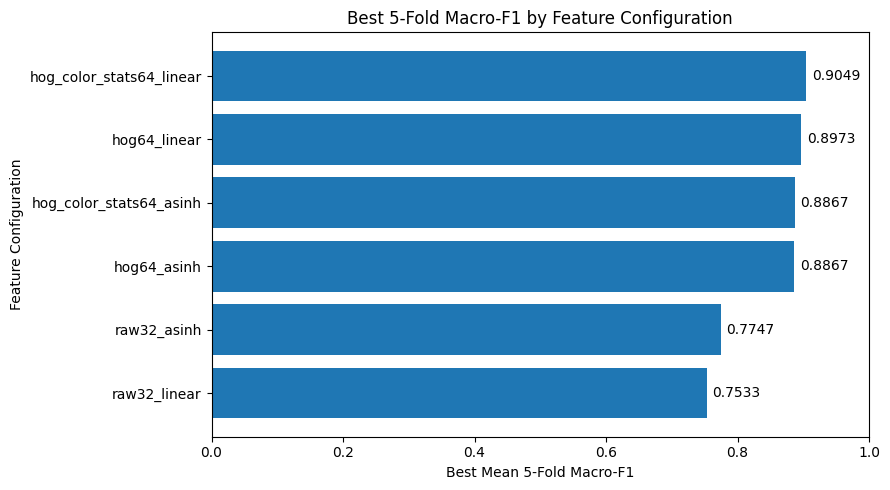

In [25]:
best_by_feature = (
    grid_results
    .groupby("feature_config", as_index=False)["mean_test_score"]
    .max()
    .rename(columns={"mean_test_score": "best_macro_f1"})
    .sort_values("best_macro_f1", ascending=True)
)

display(
    best_by_feature
    .sort_values("best_macro_f1", ascending=False)
    .round(4)
)

fig, ax = plt.subplots(figsize=(9, 5))
bars = ax.barh(
    best_by_feature["feature_config"],
    best_by_feature["best_macro_f1"]
)
ax.bar_label(bars, fmt="%.4f", padding=4)
ax.set_title("Best 5-Fold Macro-F1 by Feature Configuration")
ax.set_xlabel("Best Mean 5-Fold Macro-F1")
ax.set_ylabel("Feature Configuration")
ax.set_xlim(0, 1)
plt.tight_layout()
plt.show()

### Controlled k Comparison

The previous refined run selected `k=10`. The final search now checks both immediate neighbors of that value while retaining one clearly smaller and one clearly larger reference point.

**Why**  
Confirm that `k=10` remains the local optimum after testing both sides of it.

**What**  
Compare `k=3`, `k=9`, `k=10`, `k=11`, and `k=20` while the winning feature representation, scaler, voting rule, and distance metric are held fixed.

**How**  
The five relevant rows are taken from the same full 5-fold Grid Search and plotted with fold standard-deviation error bars and numeric score labels.

**Expected result**  
A focused five-point curve showing whether `k=9`, `k=10`, or `k=11` is the strongest local choice, with `k=3` and `k=20` providing broader context.

,k,mean_macro_f1,std_macro_f1
19,3,0.8894,0.0074
5,9,0.9016,0.0101
0,10,0.9049,0.0095
3,11,0.9017,0.0123
7,20,0.8976,0.0088


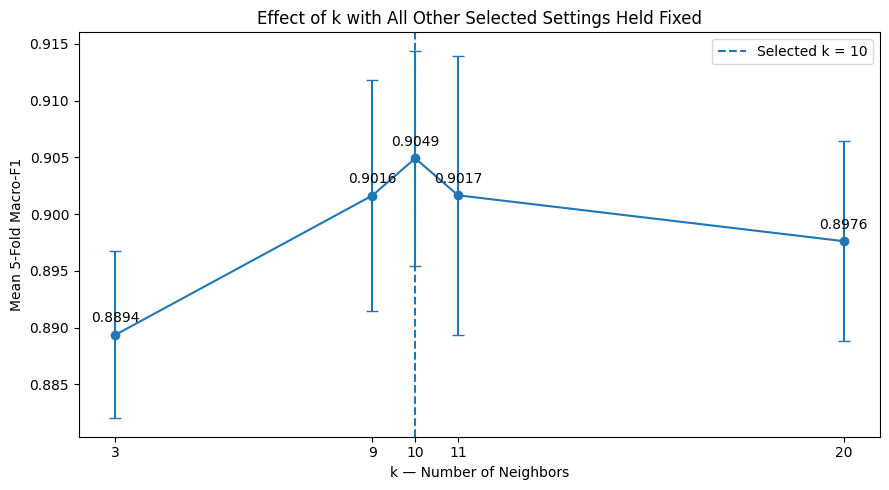

In [26]:
selected_setting_rows = grid_results[
    (
        grid_results[
            "feature_config"
        ] == BEST_FEATURE_CONFIG
    )
    & (
        grid_results[
            "scaler_name"
        ] == BEST_SCALER
    )
    & (
        grid_results[
            "weights_name"
        ] == BEST_WEIGHTS
    )
    & (
        grid_results[
            "distance_name"
        ] == BEST_DISTANCE
    )
].copy()

selected_setting_rows = (
    selected_setting_rows
    .sort_values(
        "k_value"
    )
)

k_comparison = (
    selected_setting_rows[
        [
            "k_value",
            "mean_test_score",
            "std_test_score"
        ]
    ]
    .rename(columns={
        "k_value":
            "k",
        "mean_test_score":
            "mean_macro_f1",
        "std_test_score":
            "std_macro_f1"
    })
)

display(
    k_comparison.round(4)
)

fig, ax = plt.subplots(
    figsize=(9, 5)
)

ax.errorbar(
    k_comparison["k"],
    k_comparison[
        "mean_macro_f1"
    ],
    yerr=k_comparison[
        "std_macro_f1"
    ],
    marker="o",
    capsize=4
)

for _, row in (
    k_comparison.iterrows()
):
    ax.annotate(
        f"{row['mean_macro_f1']:.4f}",
        (
            row["k"],
            row[
                "mean_macro_f1"
            ]
        ),
        textcoords="offset points",
        xytext=(0, 9),
        ha="center"
    )

ax.axvline(
    BEST_K,
    linestyle="--",
    label=(
        f"Selected k = "
        f"{BEST_K}"
    )
)

ax.set_title(
    "Effect of k with All Other "
    "Selected Settings Held Fixed"
)
ax.set_xlabel(
    "k — Number of Neighbors"
)
ax.set_ylabel(
    "Mean 5-Fold Macro-F1"
)
ax.set_xticks(
    K_VALUES
)
ax.legend()

plt.tight_layout()
plt.show()

### Isolating the Effect of Each KNN Choice

The previous graph shows all parameter combinations together. The next three summaries make the final choice easier to interpret by showing the best score achievable for each value of:

- voting weights
- distance metric
- scaler

The comparison is restricted to the selected feature representation so that the plots answer a focused question: **given the winning image features, which KNN settings worked best?**

### Uniform vs Distance-Weighted Voting

**Why**  
Explain the voting-weight choice independently.

**What**  
Compare uniform and distance weighting while all other selected parameters are fixed.

**How**  
The corresponding two Grid Search rows are displayed and plotted with fold variability.

**Expected result**  
A direct weighting comparison.

,weights,mean_macro_f1,std_macro_f1
0,distance,0.9049,0.0095
1,uniform,0.9029,0.0117


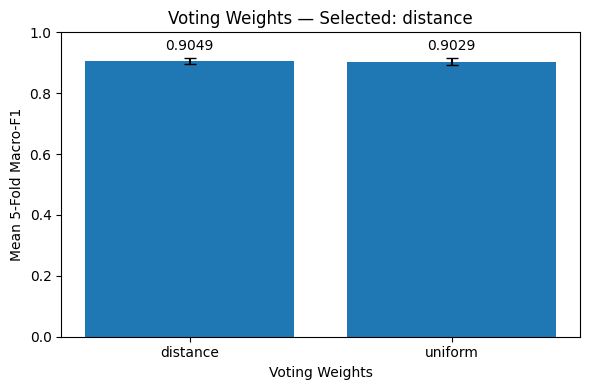

In [27]:
weight_comparison = grid_results[
    (
        grid_results[
            "feature_config"
        ] == BEST_FEATURE_CONFIG
    )
    & (
        grid_results[
            "scaler_name"
        ] == BEST_SCALER
    )
    & (
        grid_results[
            "k_value"
        ] == BEST_K
    )
    & (
        grid_results[
            "distance_name"
        ] == BEST_DISTANCE
    )
][
    [
        "weights_name",
        "mean_test_score",
        "std_test_score"
    ]
].copy()

weight_comparison = (
    weight_comparison
    .rename(columns={
        "weights_name":
            "weights",
        "mean_test_score":
            "mean_macro_f1",
        "std_test_score":
            "std_macro_f1"
    })
)

display(
    weight_comparison.round(4)
)

fig, ax = plt.subplots(
    figsize=(6, 4)
)

bars = ax.bar(
    weight_comparison[
        "weights"
    ],
    weight_comparison[
        "mean_macro_f1"
    ],
    yerr=weight_comparison[
        "std_macro_f1"
    ],
    capsize=4
)

ax.bar_label(
    bars,
    labels=[
        f"{value:.4f}"
        for value in
        weight_comparison[
            "mean_macro_f1"
        ]
    ],
    padding=4
)

ax.set_title(
    "Voting Weights — "
    f"Selected: {BEST_WEIGHTS}"
)
ax.set_xlabel(
    "Voting Weights"
)
ax.set_ylabel(
    "Mean 5-Fold Macro-F1"
)
ax.set_ylim(0, 1)

plt.tight_layout()
plt.show()

### KNN Distance Metric Comparison

**Why**  
Explain the distance-metric choice independently.

**What**  
Compare Manhattan, Euclidean, Chebyshev, and Cosine distance while the other selected settings are fixed.

**How**  
The two relevant validated permutations are filtered from Grid Search.

**Expected result**  
A direct distance-metric comparison.

,distance,mean_macro_f1,std_macro_f1
0,Cosine,0.9049,0.0095
86,Chebyshev,0.8191,0.0171
89,Euclidean,0.8157,0.0239
188,Manhattan,0.7679,0.0106


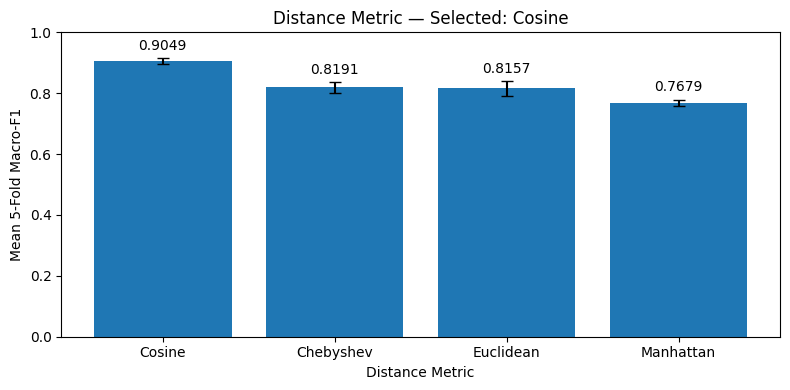

In [28]:
distance_comparison = grid_results[
    (
        grid_results[
            "feature_config"
        ] == BEST_FEATURE_CONFIG
    )
    & (
        grid_results[
            "scaler_name"
        ] == BEST_SCALER
    )
    & (
        grid_results[
            "k_value"
        ] == BEST_K
    )
    & (
        grid_results[
            "weights_name"
        ] == BEST_WEIGHTS
    )
][
    [
        "distance_name",
        "mean_test_score",
        "std_test_score"
    ]
].copy()

distance_comparison[
    "distance"
] = (
    distance_comparison[
        "distance_name"
    ].str.title()
)

distance_comparison = (
    distance_comparison
    .rename(columns={
        "mean_test_score":
            "mean_macro_f1",
        "std_test_score":
            "std_macro_f1"
    })
    .sort_values(
        "mean_macro_f1",
        ascending=False
    )
)

display(
    distance_comparison[
        [
            "distance",
            "mean_macro_f1",
            "std_macro_f1"
        ]
    ].round(4)
)

fig, ax = plt.subplots(
    figsize=(8, 4)
)

bars = ax.bar(
    distance_comparison[
        "distance"
    ],
    distance_comparison[
        "mean_macro_f1"
    ],
    yerr=distance_comparison[
        "std_macro_f1"
    ],
    capsize=4
)

ax.bar_label(
    bars,
    labels=[
        f"{value:.4f}"
        for value in
        distance_comparison[
            "mean_macro_f1"
        ]
    ],
    padding=4
)

ax.set_title(
    "Distance Metric — "
    f"Selected: "
    f"{BEST_DISTANCE.title()}"
)
ax.set_xlabel(
    "Distance Metric"
)
ax.set_ylabel(
    "Mean 5-Fold Macro-F1"
)
ax.set_ylim(0, 1)

plt.tight_layout()
plt.show()

### Scaler Comparison

**Why**  
Explain the scaling choice independently.

**What**  
Compare StandardScaler, RobustScaler, and MinMax[-1,1] while the selected KNN settings are fixed.

**How**  
Each scaler was fitted independently inside the training portion of every CV fold.

**Expected result**  
A direct scaler comparison with validation variability.

,scaler_name,mean_macro_f1,std_macro_f1
0,RobustScaler,0.9049,0.0095
51,StandardScaler,0.8790,0.0067
163,"MinMax[-1,1]",0.7759,0.0096


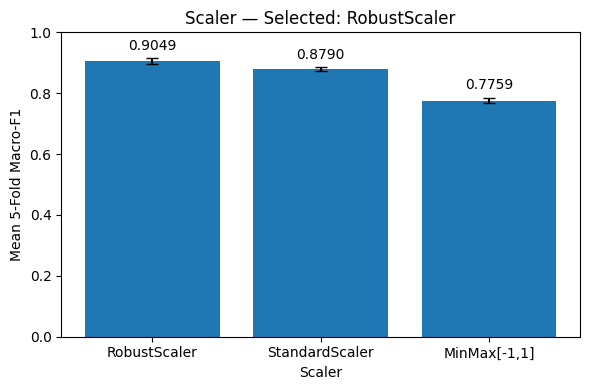

In [29]:
scaler_comparison = grid_results[
    (
        grid_results[
            "feature_config"
        ] == BEST_FEATURE_CONFIG
    )
    & (
        grid_results[
            "k_value"
        ] == BEST_K
    )
    & (
        grid_results[
            "weights_name"
        ] == BEST_WEIGHTS
    )
    & (
        grid_results[
            "distance_name"
        ] == BEST_DISTANCE
    )
][
    [
        "scaler_name",
        "mean_test_score",
        "std_test_score"
    ]
].copy()

scaler_comparison = (
    scaler_comparison
    .rename(columns={
        "mean_test_score":
            "mean_macro_f1",
        "std_test_score":
            "std_macro_f1"
    })
)

display(
    scaler_comparison.round(4)
)

fig, ax = plt.subplots(
    figsize=(6, 4)
)

bars = ax.bar(
    scaler_comparison[
        "scaler_name"
    ],
    scaler_comparison[
        "mean_macro_f1"
    ],
    yerr=scaler_comparison[
        "std_macro_f1"
    ],
    capsize=4
)

ax.bar_label(
    bars,
    labels=[
        f"{value:.4f}"
        for value in
        scaler_comparison[
            "mean_macro_f1"
        ]
    ],
    padding=4
)

ax.set_title(
    "Scaler — "
    f"Selected: {BEST_SCALER}"
)
ax.set_xlabel(
    "Scaler"
)
ax.set_ylabel(
    "Mean 5-Fold Macro-F1"
)
ax.set_ylim(0, 1)

plt.tight_layout()
plt.show()

### Best-Configuration Fold Stability

**Why**  
Check the stability of the winning configuration.

**What**  
Plot the five individual validation-fold Macro-F1 values and their mean.

**How**  
Stored split scores are extracted from the winning Grid Search row.

**Expected result**  
Five bars showing whether performance is stable across folds.

,fold,macro_f1
0,Fold 1,0.8977
1,Fold 2,0.9048
2,Fold 3,0.9194
3,Fold 4,0.9103
4,Fold 5,0.8923


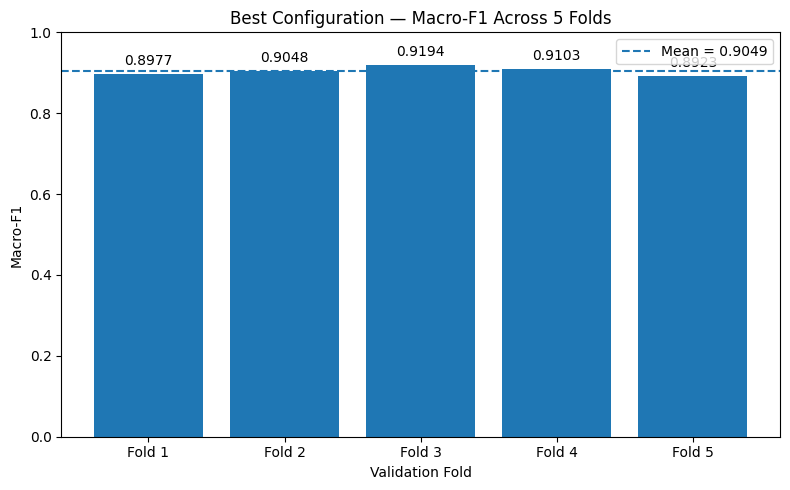

In [30]:
fold_columns = [f"split{i}_test_score" for i in range(5)]
best_fold_scores = [float(best_row[column]) for column in fold_columns]

fold_results_df = pd.DataFrame({
    "fold": [f"Fold {i}" for i in range(1, 6)],
    "macro_f1": best_fold_scores
})

display(fold_results_df.round(4))

fig, ax = plt.subplots(figsize=(8, 5))
bars = ax.bar(
    fold_results_df["fold"],
    fold_results_df["macro_f1"]
)
ax.axhline(
    BEST_CV_MACRO_F1,
    linestyle="--",
    label=f"Mean = {BEST_CV_MACRO_F1:.4f}"
)
ax.bar_label(
    bars,
    labels=[f"{v:.4f}" for v in fold_results_df["macro_f1"]],
    padding=4
)
ax.set_title("Best Configuration — Macro-F1 Across 5 Folds")
ax.set_xlabel("Validation Fold")
ax.set_ylabel("Macro-F1")
ax.set_ylim(0, 1)
ax.legend()
plt.tight_layout()
plt.show()

## Educational 2D Visualization of the Effect of `k`

The actual model operates in a high-dimensional feature space. For visualization only, PCA projects the best feature vectors to two dimensions, and small KNN models show how the decision boundary changes as `k` increases.

This visualization does not determine the final score.

### PCA Decision-Boundary Visualization

This visualization is deliberately separated from model selection. PCA compresses the high-dimensional feature space to two dimensions only so the qualitative effect of k can be seen; the final classifier still operates in the full feature space.

**Why**  
Visualize how k changes KNN behavior without affecting model selection.

**What**  
Project a stratified sample of winning features into two PCA dimensions and plot boundaries for every tested k.

**How**  
Only a bounded float64 visualization sample is standardized and projected; the final model remains unchanged.

**Expected result**  
Three educational boundary plots for k=3, 9, and 21 with the selected value marked.

PCA explained variance ratio: [0.0767 0.0249]


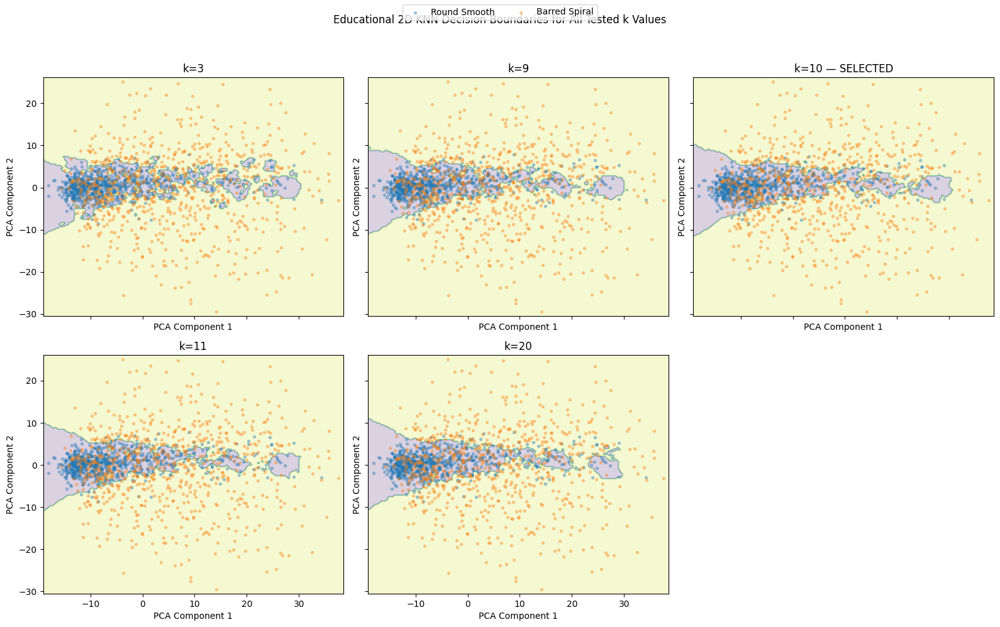

In [31]:
rng = np.random.default_rng(
    RANDOM_STATE
)

sample_size = min(
    1500,
    len(X_best_train)
)

sample_indices = []
target_per_class = (
    sample_size //
    len(np.unique(y_train))
)

for class_id in sorted(
    np.unique(y_train)
):
    class_indices = np.flatnonzero(
        y_train == class_id
    )

    take = min(
        target_per_class,
        len(class_indices)
    )

    selected = rng.choice(
        class_indices,
        size=take,
        replace=False
    )

    sample_indices.extend(
        selected.tolist()
    )

sample_indices = np.array(
    sample_indices,
    dtype=int
)

X_visual = (
    X_best_train[sample_indices]
    .astype(np.float64)
)
y_pca_sample = y_train[
    sample_indices
]

visual_scaler = StandardScaler()
X_visual_scaled = (
    visual_scaler.fit_transform(
        X_visual
    )
)

if not np.isfinite(
    X_visual_scaled
).all():
    raise ValueError(
        "Non-finite values detected "
        "before PCA visualization."
    )

pca = PCA(
    n_components=2,
    svd_solver="full"
)

X_pca_sample = pca.fit_transform(
    X_visual_scaled
)

print(
    "PCA explained variance ratio:",
    np.round(
        pca.explained_variance_ratio_,
        4
    )
)

x_min = X_pca_sample[:, 0].min() - 1
x_max = X_pca_sample[:, 0].max() + 1
y_min = X_pca_sample[:, 1].min() - 1
y_max = X_pca_sample[:, 1].max() + 1

xx, yy = np.meshgrid(
    np.linspace(
        x_min,
        x_max,
        160
    ),
    np.linspace(
        y_min,
        y_max,
        160
    )
)

grid = np.c_[
    xx.ravel(),
    yy.ravel()
]

k_values_for_visualization = sorted(
    PARAM_GRID["knn__n_neighbors"]
)

plot_columns = 3
plot_rows = int(
    np.ceil(
        len(k_values_for_visualization)
        / plot_columns
    )
)

fig, axes = plt.subplots(
    plot_rows,
    plot_columns,
    figsize=(
        16,
        5 * plot_rows
    ),
    sharex=True,
    sharey=True
)

axes = np.atleast_1d(
    axes
).ravel()

for ax, k_value in zip(axes, k_values_for_visualization):
    demo = KNeighborsClassifier(
        n_neighbors=k_value,
        weights="uniform",
        p=2
    )
    demo.fit(X_pca_sample, y_pca_sample)
    zz = demo.predict(grid).reshape(xx.shape)

    ax.contourf(xx, yy, zz, alpha=0.2)

    for class_id in [0, 1]:
        mask = y_pca_sample == class_id
        ax.scatter(
            X_pca_sample[mask, 0],
            X_pca_sample[mask, 1],
            s=8,
            alpha=0.35,
            label=CLASS_NAMES[class_id]
        )

    selected_note = " — SELECTED" if k_value == BEST_K else ""
    ax.set_title(f"k={k_value}{selected_note}")
    ax.set_xlabel("PCA Component 1")
    ax.set_ylabel("PCA Component 2")

for unused_ax in axes[
    len(k_values_for_visualization):
]:
    unused_ax.axis("off")

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc="upper center", ncol=2)
fig.suptitle(
    "Educational 2D KNN Decision Boundaries for All Tested k Values",
    y=0.98
)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

### Interpretation Note for the PCA Boundary Plots

The exact explained-variance ratio of the first two PCA components is printed immediately above the figure during the current run. Because the original classifier operates in a much higher-dimensional feature space, these 2D plots illustrate only the qualitative effect of changing `k`; they are not the true decision boundary of the final KNN model and are not used for model selection.

# Bonus 6B — Imbalanced-Data Treatments

We compare:

- no sampling
- random oversampling
- random undersampling
- SMOTE

**Why this block exists:** determine whether modifying the class distribution improves the official Macro-F1 metric.

**How it is evaluated:** every strategy is placed inside the training pipeline and evaluated using the same 5-fold stratified cross-validation. Resampling is applied only to the training portion of each fold, which prevents synthetic or duplicated observations from leaking into that fold's validation portion.

**Important interpretation:** SMOTE produces synthetic **feature vectors**, not physically rendered galaxy images.

The winning sampling strategy becomes part of the complete pipeline used for the independent validation check and final training.

### Cross-Validated Sampling Strategy Comparison

This is Bonus 6B. Each imbalance treatment is evaluated with the same 5-fold Macro-F1 framework, and resampling occurs only inside training folds to avoid validation leakage.

**Why**  
Test the Bonus 6B imbalance-handling strategies.

**What**  
Compare no sampling, random over-sampling, random under-sampling, and SMOTE.

**How**  
Each sampler operates only inside training folds of the same 5-fold validation scheme.

**Expected result**  
A ranked sampling-results table and the selected strategy.

In [32]:
sampling_methods = [
    "none",
    "random_over",
    "random_under",
    "smote"
]

sampling_results = []

for method_name in sampling_methods:
    cv_model = build_knn_pipeline(
        n_neighbors=BEST_K,
        weights=BEST_WEIGHTS,
        distance_metric=BEST_DISTANCE,
        scaler_name=best_scaler_name,
        sampling_name=method_name,
        knn_n_jobs=1
    )

    scores = cross_val_score(
        cv_model,
        X_best_train,
        y_train,
        cv=CV,
        scoring="f1_macro",
        n_jobs=PARALLEL_JOBS,
        pre_dispatch=PARALLEL_JOBS
    )

    sampling_results.append({
        "sampling_method":
            method_name,
        "mean_macro_f1":
            scores.mean(),
        "std_macro_f1":
            scores.std(),
        "fold_1": scores[0],
        "fold_2": scores[1],
        "fold_3": scores[2],
        "fold_4": scores[3],
        "fold_5": scores[4]
    })

sampling_results_df = (
    pd.DataFrame(
        sampling_results
    )
    .sort_values(
        "mean_macro_f1",
        ascending=False
    )
    .reset_index(drop=True)
)

BEST_SAMPLING_METHOD = str(
    sampling_results_df.iloc[
        0
    ]["sampling_method"]
)

sampling_results_df.to_csv(
    OUTPUT_DIR
    / "bonus_6b_sampling_results.csv",
    index=False
)

display(
    sampling_results_df
)

print(
    "Selected sampling strategy:",
    BEST_SAMPLING_METHOD
)

,sampling_method,mean_macro_f1,std_macro_f1,fold_1,fold_2,fold_3,fold_4,fold_5
0,none,0.904907,0.009484,0.897677,0.904837,0.919371,0.910342,0.892308
1,random_under,0.898650,0.008144,0.892875,0.898636,0.912860,0.899956,0.888922
2,random_over,0.897538,0.008116,0.896757,0.895730,0.906231,0.905241,0.883733
3,smote,0.890519,0.010165,0.879638,0.892043,0.909083,0.888027,0.883806


Selected sampling strategy: none


### Sampling Performance Visualization

**Why**  
Make the Bonus 6B selection visually clear while also showing how stable each result is across folds.

**What**  
Plot the mean 5-fold Macro-F1 for `none`, random over-sampling, random under-sampling, and SMOTE, including one-standard-deviation error bars.

**How**  
The means and standard deviations come directly from the same 5-fold experiment used to select the sampling method. The cell also prints the absolute improvement over no sampling.

**Expected result**  
A fair comparison showing the highest mean score and whether its advantage is large or modest relative to fold-to-fold variability.

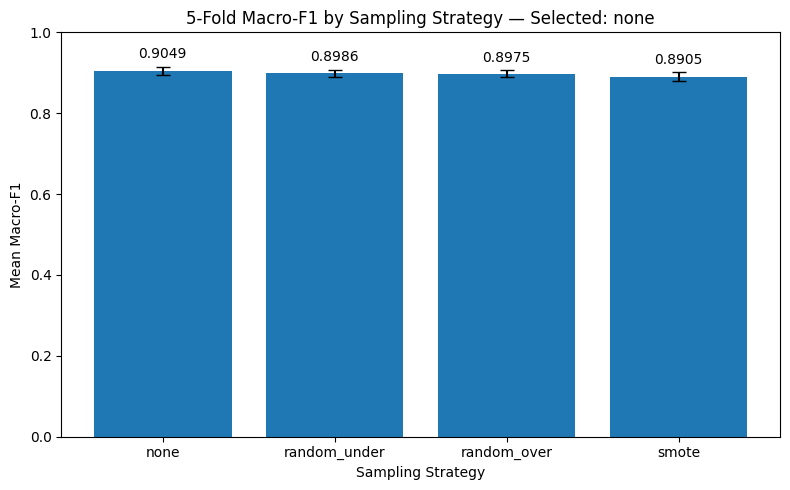

Best sampling mean Macro-F1: 0.9049
No-sampling mean Macro-F1: 0.9049
Absolute improvement: 0.0000
Best-strategy fold standard deviation: 0.0095


In [33]:
if sampling_results_df.empty:
    print("No sampling results are available to plot.")
else:
    fig, ax = plt.subplots(figsize=(8, 5))
    bars = ax.bar(
        sampling_results_df["sampling_method"],
        sampling_results_df["mean_macro_f1"],
        yerr=sampling_results_df["std_macro_f1"],
        capsize=5
    )
    ax.bar_label(
        bars,
        labels=[f"{v:.4f}" for v in sampling_results_df["mean_macro_f1"]],
        padding=4
    )
    ax.set_title(
        "5-Fold Macro-F1 by Sampling Strategy "
        f"— Selected: {BEST_SAMPLING_METHOD}"
    )
    ax.set_xlabel("Sampling Strategy")
    ax.set_ylabel("Mean Macro-F1")
    ax.set_ylim(0, 1)
    plt.tight_layout()
    plt.show()

    no_sampling_score = float(
        sampling_results_df.loc[
            sampling_results_df["sampling_method"] == "none",
            "mean_macro_f1"
        ].iloc[0]
    )
    best_sampling_score = float(
        sampling_results_df.iloc[0]["mean_macro_f1"]
    )
    best_sampling_std = float(
        sampling_results_df.iloc[0]["std_macro_f1"]
    )
    sampling_gain = best_sampling_score - no_sampling_score

    print(f"Best sampling mean Macro-F1: {best_sampling_score:.4f}")
    print(f"No-sampling mean Macro-F1: {no_sampling_score:.4f}")
    print(f"Absolute improvement: {sampling_gain:.4f}")
    print(
        "Best-strategy fold standard deviation: "
        f"{best_sampling_std:.4f}"
    )

### Interpretation of the Sampling Experiment

The figure reports both the **mean 5-fold Macro-F1** and the **fold-to-fold standard deviation** for every sampling strategy.

The code immediately above also prints the absolute difference between the selected strategy and no sampling. This is important because the numerically highest mean should not automatically be described as a large improvement when its advantage is small relative to cross-validation variability.

SMOTE is evaluated in the engineered feature space. It creates synthetic numerical feature vectors, not physically rendered galaxy images, so its result should be interpreted in the context of that high-dimensional representation.

## Visualizing What Each Sampling Method Changes

**Why:** A score alone does not show what oversampling, undersampling, and SMOTE actually do to the training data.

**What:** The following demonstration applies each strategy to the complete training feature matrix only for visualization and reports the resulting number of examples in each class.

**Expected result:** oversampling and SMOTE increase the minority class, undersampling reduces the majority class, and `none` preserves the original counts.

### Sampling Class-Count Effects

**Why**  
Show what each sampling method changes in the data.

**What**  
Compare resulting class counts after no sampling, over-sampling, under-sampling, and SMOTE.

**How**  
Each strategy is applied to a demonstration copy of the training feature vectors.

**Expected result**  
A table and grouped class-count bar chart.

,sampling_method,class,count
0,none,Round Smooth,2116
1,none,Barred Spiral,1634
2,random_over,Round Smooth,2116
3,random_over,Barred Spiral,2116
4,random_under,Round Smooth,1634
5,random_under,Barred Spiral,1634
6,smote,Round Smooth,2116
7,smote,Barred Spiral,2116


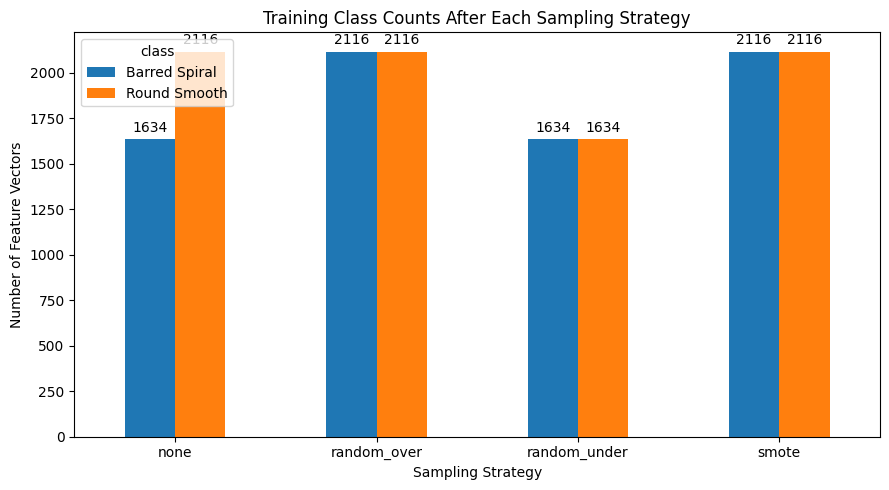

In [34]:
sampling_distribution_rows = []

X_scaled_for_demo = make_scaler(
    best_scaler_name
).fit_transform(X_best_train)

for method_name in sampling_methods:
    sampler = make_sampler(method_name)

    if sampler is None:
        y_resampled = y_train
    else:
        _, y_resampled = sampler.fit_resample(
            X_scaled_for_demo,
            y_train
        )

    counts = pd.Series(y_resampled).value_counts().sort_index()

    for class_id in sorted(np.unique(y_train)):
        sampling_distribution_rows.append({
            "sampling_method": method_name,
            "class": CLASS_NAMES[int(class_id)],
            "count": int(counts.get(class_id, 0))
        })

sampling_distribution_df = pd.DataFrame(
    sampling_distribution_rows
)

display(sampling_distribution_df)

sampling_distribution_pivot = sampling_distribution_df.pivot(
    index="sampling_method",
    columns="class",
    values="count"
)

ax = sampling_distribution_pivot.plot(
    kind="bar",
    figsize=(9, 5)
)

for container in ax.containers:
    ax.bar_label(
        container,
        fmt="%d",
        padding=3
    )

ax.set_title(
    "Training Class Counts After Each Sampling Strategy"
)
ax.set_xlabel("Sampling Strategy")
ax.set_ylabel("Number of Feature Vectors")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

# Fixed Validation Split — Independent Sanity Check

The fixed validation split is **not used to select the grid-search winner**. Selection is based on the required 5-fold CV over the training set.

After selection, validation provides an additional independent sanity check before final test evaluation.

### Independent Validation Evaluation

**Why**  
Check the selected full pipeline on independent validation data.

**What**  
Apply the winning features, scaler, sampling, and KNN configuration to Validation.

**How**  
No validation observation participated in Grid Search parameter fitting.

**Expected result**  
Independent validation Macro-F1, classification report, and confusion matrix.

In [35]:
best_feature_settings = FEATURE_CONFIGS[BEST_FEATURE_CONFIG]

X_val_best, best_groups = extract_feature_matrix(
    X_val_img,
    method=best_feature_settings["method"],
    size=best_feature_settings["size"],
    stretch=best_feature_settings["stretch"]
)


validation_model = train_knn(
    X_best_train,
    y_train,
    n_neighbors=BEST_K,
    weights=BEST_WEIGHTS,
    distance_metric=BEST_DISTANCE,
    scaler_name=best_scaler_name,
    sampling_name=BEST_SAMPLING_METHOD
)

val_pred = predict_knn(validation_model, X_val_best)
val_macro_f1 = macro_f1(y_val, val_pred)

print(f"Validation Macro-F1: {val_macro_f1:.4f}")
print(classification_report(
    y_val,
    val_pred,
    target_names=[CLASS_NAMES[0], CLASS_NAMES[1]],
    digits=4
))

Validation Macro-F1: 0.8966
               precision    recall  f1-score   support

 Round Smooth     0.8780    0.9545    0.9147       264
Barred Spiral     0.9341    0.8293    0.8786       205

     accuracy                         0.8998       469
    macro avg     0.9061    0.8919    0.8966       469
 weighted avg     0.9025    0.8998    0.8989       469



### Validation Confusion Matrix

**Why**  
Keep the workflow modular and easy to explain during the presentation.

**What**  
Execute the next data-processing, modeling, evaluation, or visualization stage.

**How**  
Use the objects created in previous cells while preserving the fixed Train/Validation/Test separation.

**Expected result**  
A clearly interpretable intermediate result used by the following stage.

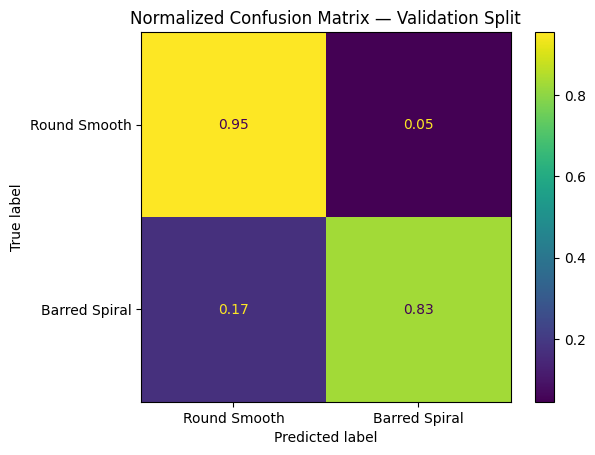

In [36]:
ConfusionMatrixDisplay.from_predictions(
    y_val,
    val_pred,
    display_labels=[CLASS_NAMES[0], CLASS_NAMES[1]],
    normalize="true",
    values_format=".2f"
)
plt.title("Normalized Confusion Matrix — Validation Split")
plt.show()

# Part 4 — Final Training

The complete configuration has now been selected using training-only 5-fold validation:

- image feature representation
- scaler
- number of neighbors
- voting weights
- distance metric
- sampling strategy

The selected pipeline is now fitted on the **entire fixed training set**. No external test observations participate in this fit.

This directly satisfies the assignment requirement to retrain the winning combination on the full train set.

## Winning Feature-Engineering Flow on Training Examples

This section therefore visualizes the **actual winning Feature Engineering configuration** selected by 5-fold cross-validation.

### Winning Feature Engineering on Train

**Why**  
Meet Part 4's requirement to demonstrate the successful preprocessing on Train examples.

**What**  
Visualize the actual winning Feature Engineering settings on three representative training galaxies.

**How**  
The winning stretch and image size are read from the selected configuration.

**Expected result**  
Three training processing-flow figures using the final chosen Feature Engineering.

Winning feature configuration: hog_color_stats64_linear {'method': 'hog_color_stats', 'size': 64, 'stretch': 'linear'}


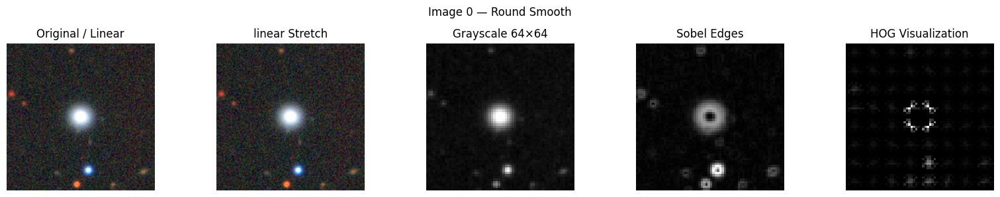

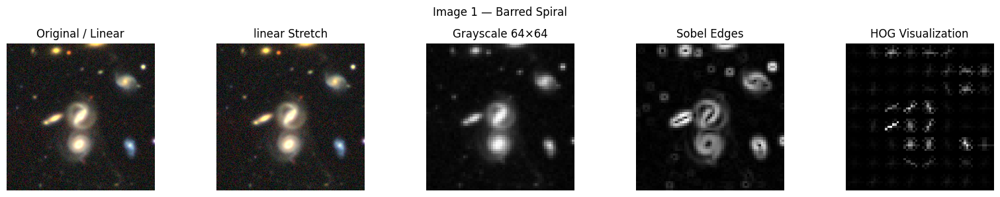

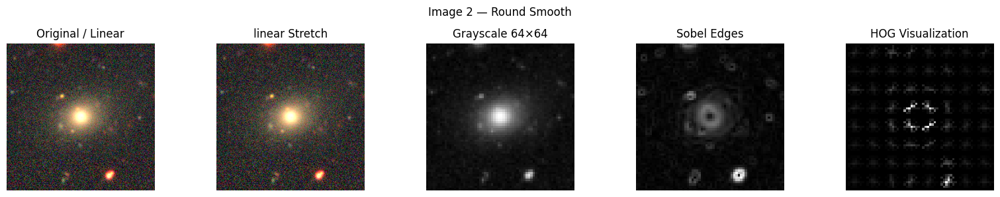

In [37]:
selected_fe = FEATURE_CONFIGS[
    BEST_FEATURE_CONFIG
]

print(
    "Winning feature configuration:",
    BEST_FEATURE_CONFIG,
    selected_fe
)

visualize_processing_flow(
    X_train_img,
    y_train,
    representative_indices(
        y_train,
        n=3
    ),
    stretch=selected_fe["stretch"],
    size=selected_fe["size"]
)

### Final Training on the Full Train Set

All model-selection decisions are already complete at this point. The winning complete pipeline is retrained on every observation in the fixed Train set, exactly as required before final Test evaluation.

**Why**  
Fit the final model only after every choice is complete.

**What**  
Train the winning scaler, sampler, and KNN on the entire fixed Train set.

**How**  
No Test observations participate in fitting or model selection.

**Expected result**  
A fitted final pipeline ready for external Test prediction.

In [38]:
final_model = train_knn(
    X_best_train,
    y_train,
    n_neighbors=BEST_K,
    weights=BEST_WEIGHTS,
    distance_metric=BEST_DISTANCE,
    scaler_name=best_scaler_name,
    sampling_name=BEST_SAMPLING_METHOD
)

print(final_model)

Pipeline(steps=[('float64',
                 FunctionTransformer(func=<function to_float64_features at 0x133b223a0>)),
                ('scaler', RobustScaler()), ('cosine_normalizer', Normalizer()),
                ('knn',
                 KNeighborsClassifier(algorithm='brute', metric='euclidean',
                                      n_jobs=1, n_neighbors=10,
                                      weights=<function cosine_distance_weights at 0x133b224c0>))])


# Part 5 — Test Prediction and Final Evaluation

The same image preprocessing and feature extraction selected during 5-fold CV are now applied to every test image.

## Winning Feature-Engineering Flow on Test Examples

The exact Feature Engineering configuration selected from training-only validation is now demonstrated on three unseen test examples. No test information is used to change the preprocessing.

### Winning Feature Engineering on Test

**Why**  
Meet Part 5's requirement to show the selected preprocessing on Test examples.

**What**  
Apply the already selected image transformation to three representative test galaxies.

**How**  
The configuration is not changed based on Test; it is only visualized.

**Expected result**  
Three Test processing-flow figures using exactly the training-selected settings.

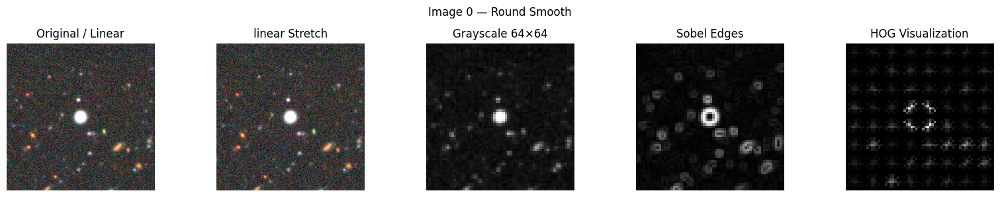

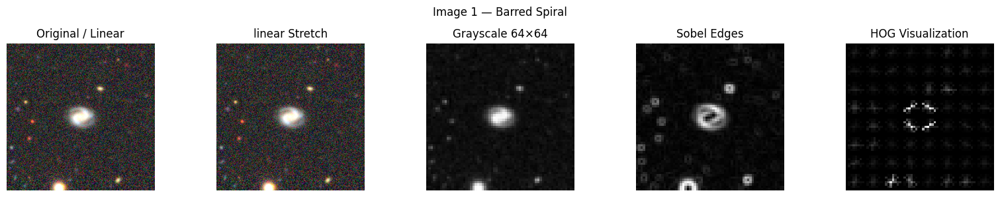

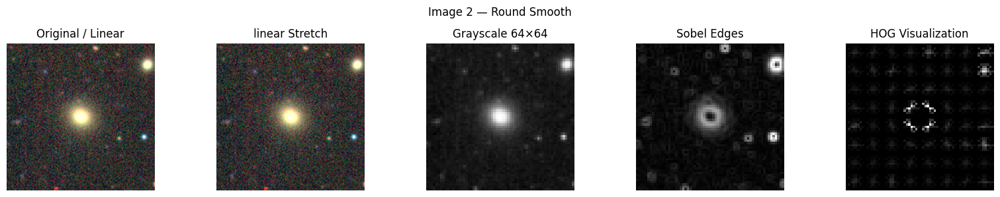

In [39]:
visualize_processing_flow(
    X_test_img,
    y_test,
    representative_indices(
        y_test,
        n=3
    ),
    stretch=selected_fe["stretch"],
    size=selected_fe["size"]
)

### Final Test Prediction

This is the first stage where the untouched Test set contributes to the final model-quality result. No parameter is changed after this point.

**Why**  
Produce the final predictions used for grading.

**What**  
Extract the winning Test feature representation and call the final fitted model.

**How**  
Test preprocessing is identical to the representation selected from Train CV.

**Expected result**  
The final untouched Test Macro-F1.

In [40]:
X_test_best, _ = extract_feature_matrix(
    X_test_img,
    method=best_feature_settings["method"],
    size=best_feature_settings["size"],
    stretch=best_feature_settings["stretch"]
)

y_test_pred = predict_knn(
    final_model,
    X_test_best
)

test_macro_f1 = macro_f1(
    y_test,
    y_test_pred
)

print(f"Final Test Macro-F1: {test_macro_f1:.4f}")

Final Test Macro-F1: 0.8903


### First Five Test Predictions Table

**Why**  
Meet the explicit requirement to show the first five Test predictions.

**What**  
Create a table with actual and predicted labels/classes for Test indices 0–4.

**How**  
Values are taken directly from the final Test predictions.

**Expected result**  
A five-row prediction table.

In [41]:
first_five_predictions = pd.DataFrame({
    "index": np.arange(5),
    "actual_label": y_test[:5],
    "actual_class": [CLASS_NAMES[int(v)] for v in y_test[:5]],
    "predicted_label": y_test_pred[:5],
    "predicted_class": [CLASS_NAMES[int(v)] for v in y_test_pred[:5]]
})

display(first_five_predictions)

,index,actual_label,actual_class,predicted_label,predicted_class
0,0,0,Round Smooth,0,Round Smooth
1,1,1,Barred Spiral,1,Barred Spiral
2,2,0,Round Smooth,0,Round Smooth
3,3,1,Barred Spiral,1,Barred Spiral
4,4,1,Barred Spiral,1,Barred Spiral


### First Five Test Predictions Gallery

**Why**  
Make the first five predictions visually understandable.

**What**  
Render the same five Test galaxies with true and predicted class names.

**How**  
Each image title contains the actual and predicted morphology.

**Expected result**  
A five-image prediction gallery.

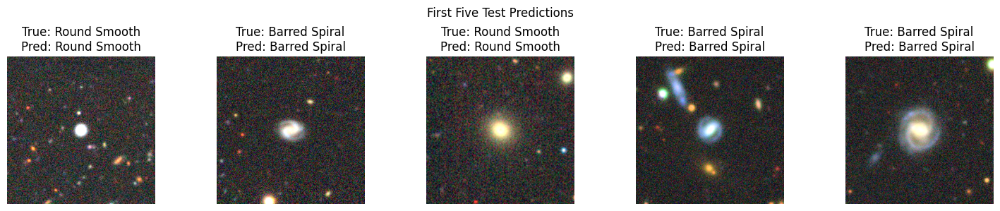

In [42]:
fig, axes = plt.subplots(1, 5, figsize=(15, 3))

for i, ax in enumerate(axes):
    ax.imshow(normalize_image(X_test_img[i], stretch="linear"))
    ax.set_title(
        f"True: {CLASS_NAMES[int(y_test[i])]}\n"
        f"Pred: {CLASS_NAMES[int(y_test_pred[i])]}"
    )
    ax.axis("off")

plt.suptitle("First Five Test Predictions")
plt.tight_layout()
plt.show()

## Official and Additional Test Metrics

**Macro-F1 is the official assignment metric.** Additional metrics are included only to improve analysis.

### Final Test Metrics

**Why**  
Report the official metric and useful supporting diagnostics.

**What**  
Calculate Macro-F1, Accuracy, Balanced Accuracy, Macro Precision/Recall, MCC, and Cohen's Kappa.

**How**  
All values use the same final Test predictions.

**Expected result**  
A metric table and comparison plot; Macro-F1 remains the official score.

,metric,value
0,Macro-F1,0.8903
1,Accuracy,0.8934
2,Balanced Accuracy,0.8865
3,Macro Precision,0.8969
4,Macro Recall,0.8865
5,Matthews Correlation Coefficient,0.7833
6,Cohen's Kappa,0.7809


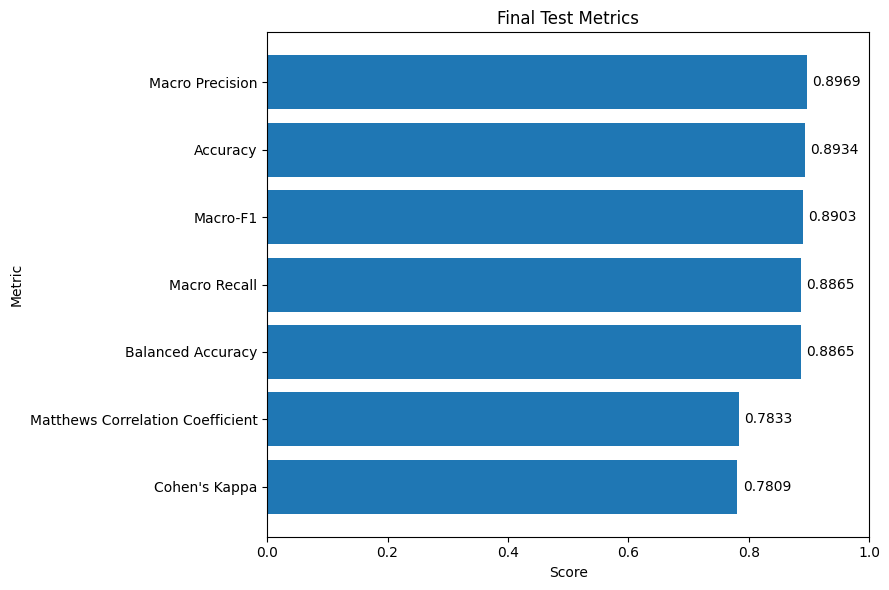

In [43]:
test_scores = pd.DataFrame({
    "metric": [
        "Macro-F1",
        "Accuracy",
        "Balanced Accuracy",
        "Macro Precision",
        "Macro Recall",
        "Matthews Correlation Coefficient",
        "Cohen's Kappa"
    ],
    "value": [
        f1_score(y_test, y_test_pred, average="macro"),
        accuracy_score(y_test, y_test_pred),
        balanced_accuracy_score(y_test, y_test_pred),
        precision_score(y_test, y_test_pred, average="macro"),
        recall_score(y_test, y_test_pred, average="macro"),
        matthews_corrcoef(y_test, y_test_pred),
        cohen_kappa_score(y_test, y_test_pred)
    ]
})

display(test_scores.round(4))

metric_plot_df = test_scores.sort_values("value", ascending=True)

fig, ax = plt.subplots(figsize=(9, 6))
bars = ax.barh(
    metric_plot_df["metric"],
    metric_plot_df["value"]
)
ax.bar_label(
    bars,
    labels=[f"{v:.4f}" for v in metric_plot_df["value"]],
    padding=4
)
ax.set_title("Final Test Metrics")
ax.set_xlabel("Score")
ax.set_ylabel("Metric")
ax.set_xlim(0, 1)
plt.tight_layout()
plt.show()

### Detailed Classification Report

**Why**  
Identify class-specific strengths and weaknesses numerically.

**What**  
Report Precision, Recall, F1, and support for both morphologies.

**How**  
sklearn compares final predictions with true Test labels.

**Expected result**  
A two-class classification report.

In [44]:
print(classification_report(
    y_test,
    y_test_pred,
    target_names=[CLASS_NAMES[0], CLASS_NAMES[1]],
    digits=4
))

               precision    recall  f1-score   support

 Round Smooth     0.8799    0.9396    0.9088       265
Barred Spiral     0.9140    0.8333    0.8718       204

     accuracy                         0.8934       469
    macro avg     0.8969    0.8865    0.8903       469
 weighted avg     0.8947    0.8934    0.8927       469



## Per-Class Precision, Recall, and F1

Macro-F1 remains the official assignment metric. This additional plot shows whether one morphology is substantially harder than the other and explains the components behind the macro average.

### Per-Class Precision, Recall, and F1

**Why**  
Make class-level performance visually comparable.

**What**  
Plot Precision, Recall, and F1 for Round Smooth and Barred Spiral.

**How**  
The numeric classification report is converted into a compact DataFrame.

**Expected result**  
A grouped per-class metrics chart.

,Precision,Recall,F1
Round Smooth,0.8799,0.9396,0.9088
Barred Spiral,0.9140,0.8333,0.8718


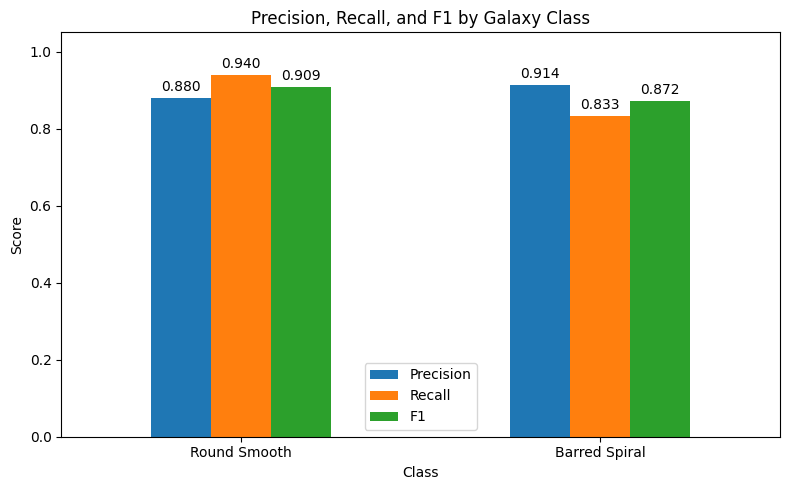

In [45]:
report_dict = classification_report(
    y_test,
    y_test_pred,
    target_names=[
        CLASS_NAMES[0],
        CLASS_NAMES[1]
    ],
    output_dict=True,
    zero_division=0
)

per_class_metrics = pd.DataFrame({
    class_name: {
        "Precision": report_dict[
            class_name
        ]["precision"],
        "Recall": report_dict[
            class_name
        ]["recall"],
        "F1": report_dict[
            class_name
        ]["f1-score"]
    }
    for class_name in [
        CLASS_NAMES[0],
        CLASS_NAMES[1]
    ]
}).T

display(
    per_class_metrics.round(4)
)

ax = per_class_metrics.plot(
    kind="bar",
    figsize=(8, 5)
)

for container in ax.containers:
    ax.bar_label(
        container,
        fmt="%.3f",
        padding=3
    )

ax.set_title(
    "Precision, Recall, and F1 by Galaxy Class"
)
ax.set_xlabel("Class")
ax.set_ylabel("Score")
ax.set_ylim(0.0, 1.05)
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

### Raw and Normalized Test Confusion Matrices

**Why**  
Keep the workflow modular and easy to explain during the presentation.

**What**  
Execute the next data-processing, modeling, evaluation, or visualization stage.

**How**  
Use the objects created in previous cells while preserving the fixed Train/Validation/Test separation.

**Expected result**  
A clearly interpretable intermediate result used by the following stage.

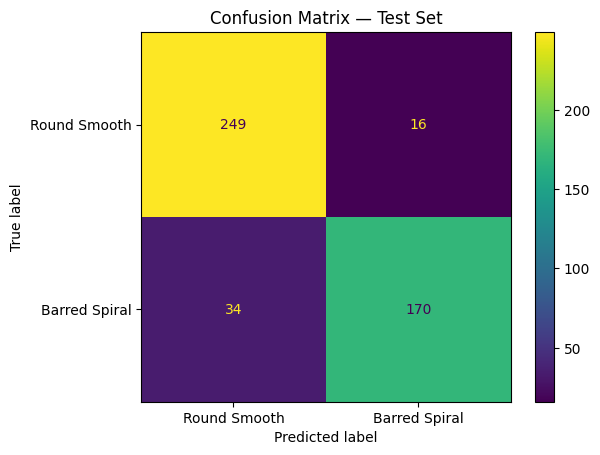

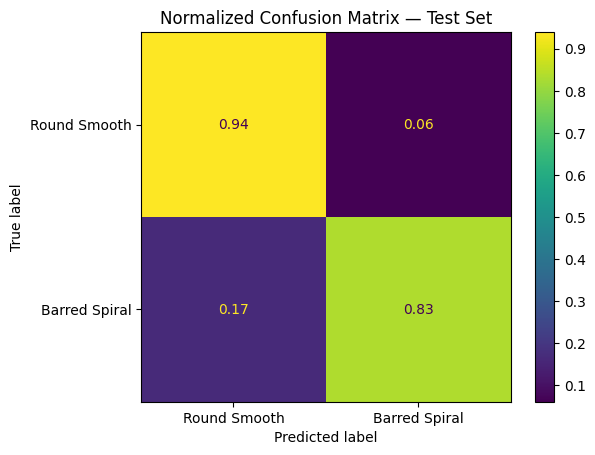

In [46]:
ConfusionMatrixDisplay.from_predictions(
    y_test,
    y_test_pred,
    display_labels=[CLASS_NAMES[0], CLASS_NAMES[1]],
    values_format="d"
)
plt.title("Confusion Matrix — Test Set")
plt.show()

ConfusionMatrixDisplay.from_predictions(
    y_test,
    y_test_pred,
    display_labels=[CLASS_NAMES[0], CLASS_NAMES[1]],
    normalize="true",
    values_format=".2f"
)
plt.title("Normalized Confusion Matrix — Test Set")
plt.show()

## ROC and Precision-Recall Curves

These are additional binary-classification diagnostics. They do not replace Macro-F1.

### ROC and Precision-Recall Diagnostics

**Why**  
Add optional binary-classification diagnostics.

**What**  
Generate ROC/AUC and Precision-Recall/AP curves from KNN vote probabilities.

**How**  
Curves are drawn only when both classes and finite probability scores are present.

**Expected result**  
ROC and PR plots or an explanatory skip message.

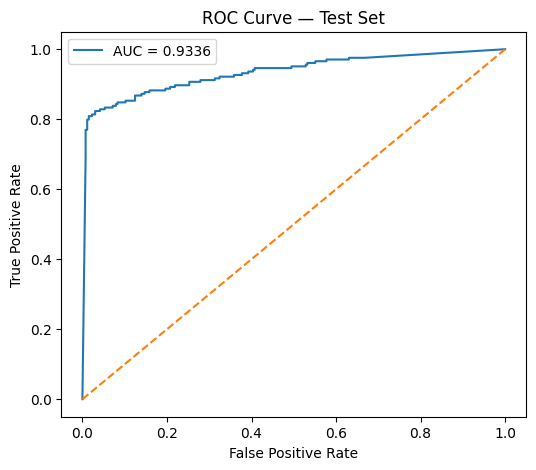

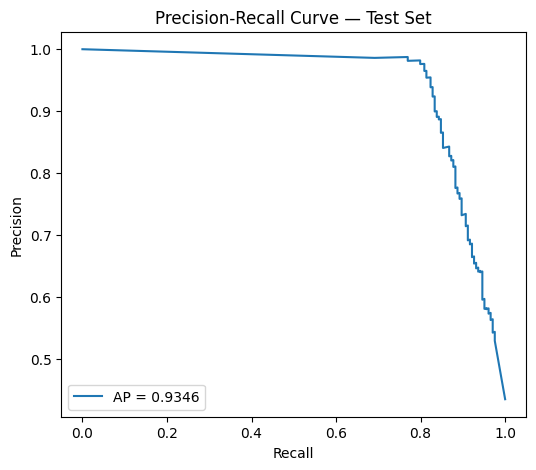

In [47]:
test_proba = final_model.predict_proba(X_test_best)[:, 1]

if len(np.unique(y_test)) < 2:
    print(
        "ROC/PR curves require both classes in the test set; "
        "the curves were skipped."
    )
elif not np.isfinite(test_proba).all():
    print(
        "ROC/PR curves were skipped because non-finite "
        "prediction scores were detected."
    )
else:
    fpr, tpr, _ = roc_curve(y_test, test_proba)
    roc_auc = roc_auc_score(y_test, test_proba)

    plt.figure(figsize=(6, 5))
    plt.plot(fpr, tpr, label=f"AUC = {roc_auc:.4f}")
    plt.plot([0, 1], [0, 1], linestyle="--")
    plt.title("ROC Curve — Test Set")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend()
    plt.show()

    precision_values, recall_values, _ = precision_recall_curve(
        y_test,
        test_proba
    )
    ap = average_precision_score(y_test, test_proba)

    plt.figure(figsize=(6, 5))
    plt.plot(
        recall_values,
        precision_values,
        label=f"AP = {ap:.4f}"
    )
    plt.title("Precision-Recall Curve — Test Set")
    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.legend()
    plt.show()

### Interpreting the ROC and Precision-Recall Shapes

These two curves are **supplementary diagnostics only**; Macro-F1 remains the official assignment metric.

Because the selected KNN uses a small neighborhood and discrete neighbor voting, `predict_proba` can return only a limited set of probability values. The ROC and Precision-Recall curves can therefore look more angular or step-like than curves produced by models with continuous probability scores. This is expected and does not indicate a plotting error.

## Generalization Consistency — CV vs Validation vs Test

A strong final model should not only have a good Test score; its performance should remain reasonably consistent across the cross-validation estimate, the independent Validation split, and the untouched Test split.

The following chart provides one compact visual summary of that consistency using the official Macro-F1 metric.

### CV / Validation / Test Macro-F1 Comparison

This is an important final sanity-check visualization because it places the three independent estimates of model quality side by side.

**Why**  
Show whether the selected pipeline generalizes consistently rather than succeeding only on one evaluation split.

**What**  
Compare the best 5-fold CV Macro-F1, independent Validation Macro-F1, and final Test Macro-F1.

**How**  
The three already-computed scores are collected into one small DataFrame and shown as labeled bars.

**Expected result**  
Three reasonably close Macro-F1 values, supporting the claim that the selected pipeline has stable generalization.

,evaluation,macro_f1
0,5-Fold CV,0.9049
1,Validation,0.8966
2,Test,0.8903


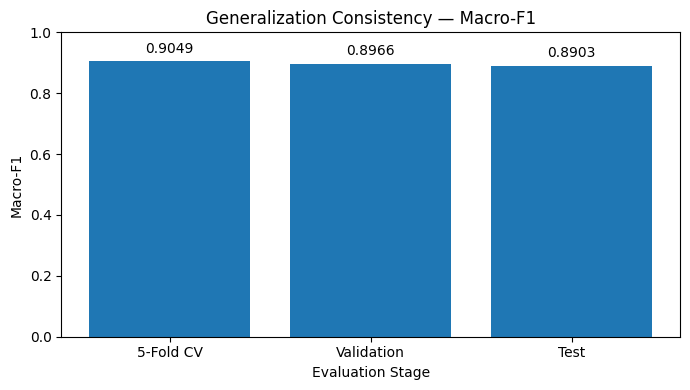

In [48]:
generalization_scores = pd.DataFrame({
    "evaluation": [
        "5-Fold CV",
        "Validation",
        "Test"
    ],
    "macro_f1": [
        BEST_CV_MACRO_F1,
        val_macro_f1,
        test_macro_f1
    ]
})

display(
    generalization_scores.round(4)
)

fig, ax = plt.subplots(figsize=(7, 4))

bars = ax.bar(
    generalization_scores["evaluation"],
    generalization_scores["macro_f1"]
)

ax.bar_label(
    bars,
    labels=[
        f"{value:.4f}"
        for value in generalization_scores["macro_f1"]
    ],
    padding=4
)

ax.set_title(
    "Generalization Consistency — Macro-F1"
)
ax.set_xlabel("Evaluation Stage")
ax.set_ylabel("Macro-F1")
ax.set_ylim(0, 1)

plt.tight_layout()
plt.show()

# Error Analysis

A high score is not enough. The following visualizations show **where and how the model fails**.

### Misclassification Direction Analysis

**Why**  
Understand which direction of error is most common.

**What**  
Count each Actual → Predicted misclassification pair.

**How**  
Correct predictions are removed and remaining errors are grouped.

**Expected result**  
A table and bar chart of error directions.

,error_type,count
0,Barred Spiral → Round Smooth,34
1,Round Smooth → Barred Spiral,16


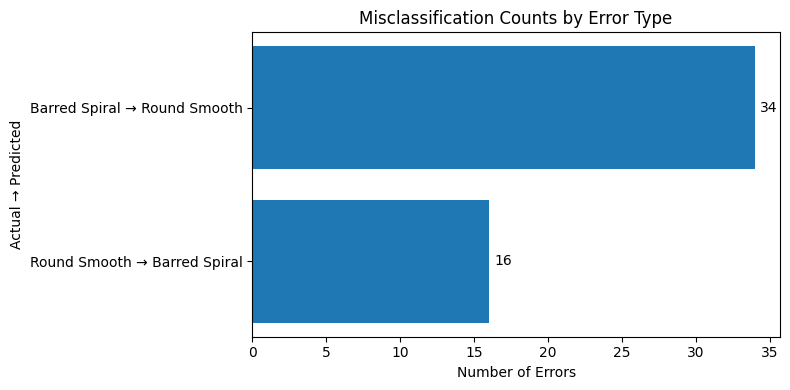

In [49]:
error_df = pd.DataFrame({
    "actual": y_test,
    "predicted": y_test_pred
})

error_df = error_df[
    error_df["actual"] != error_df["predicted"]
].copy()

if len(error_df) > 0:
    error_df["error_type"] = error_df.apply(
        lambda row: (
            f"{CLASS_NAMES[int(row['actual'])]} → "
            f"{CLASS_NAMES[int(row['predicted'])]}"
        ),
        axis=1
    )

    error_counts = (
        error_df["error_type"]
        .value_counts()
        .rename_axis("error_type")
        .reset_index(name="count")
    )

    display(error_counts)

    error_plot_df = (
        error_counts
        .sort_values("count", ascending=True)
    )

    fig, ax = plt.subplots(figsize=(8, 4))

    bars = ax.barh(
        error_plot_df["error_type"],
        error_plot_df["count"]
    )

    ax.bar_label(
        bars,
        labels=[
            str(int(v))
            for v in error_plot_df["count"]
        ],
        padding=4
    )

    ax.set_title(
        "Misclassification Counts by Error Type"
    )
    ax.set_xlabel("Number of Errors")
    ax.set_ylabel("Actual → Predicted")

    plt.tight_layout()
    plt.show()
else:
    error_counts = pd.DataFrame(
        columns=["error_type", "count"]
    )
    print("No test misclassifications.")

### Misclassified Image Gallery

**Why**  
Inspect the visual characteristics of model mistakes.

**What**  
Show a gallery of misclassified Test galaxies.

**How**  
Indices where prediction differs from truth are selected and rendered.

**Expected result**  
A visual error gallery for presentation discussion.

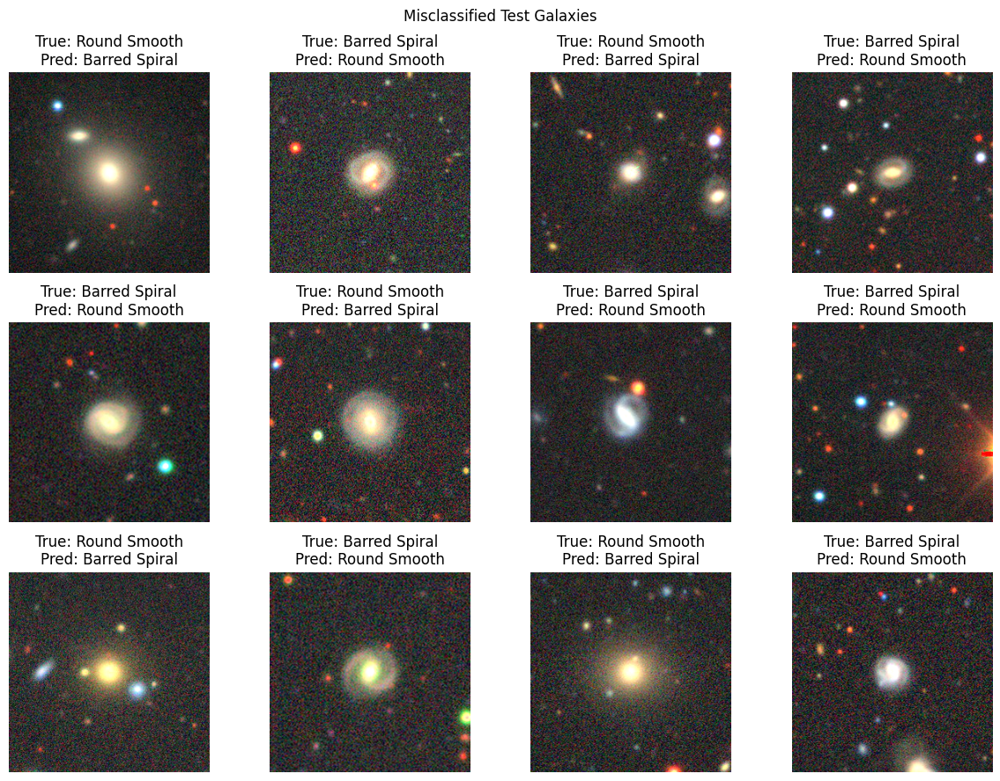

In [50]:
misclassified_indices = np.flatnonzero(
    y_test != y_test_pred
)

if len(misclassified_indices) > 0:
    n_show = min(12, len(misclassified_indices))
    selected = misclassified_indices[:n_show]

    cols = 4
    rows = int(np.ceil(n_show / cols))

    fig, axes = plt.subplots(
        rows,
        cols,
        figsize=(12, 3 * rows)
    )
    axes = np.asarray(axes).reshape(-1)

    for ax in axes:
        ax.axis("off")

    for ax, idx in zip(axes, selected):
        ax.imshow(
            normalize_image(
                X_test_img[idx],
                stretch="linear"
            )
        )
        ax.set_title(
            f"True: {CLASS_NAMES[int(y_test[idx])]}\n"
            f"Pred: {CLASS_NAMES[int(y_test_pred[idx])]}"
        )
        ax.axis("off")

    plt.suptitle("Misclassified Test Galaxies")
    plt.tight_layout()
    plt.show()

# Bonus 6C — Explainability

KNN provides unusually intuitive local explanations: a prediction can be traced to actual training images.

We provide:

1. **local nearest-neighbor image explanation**
2. **neighbor distance / vote analysis**
3. **feature-group distance contribution**
4. **global group permutation importance**

## Local Explanation — Nearest Training Galaxies

For the first misclassified test image, display the query next to its nearest training neighbors.

If the winning pipeline uses a resampling strategy, the KNN model may contain duplicated or synthetic feature vectors. In that case, an auxiliary no-resampling KNN with the same scaler and hyperparameters is used only for the **image gallery**, because every neighbor in that auxiliary model maps to a real original training image. This distinction is printed explicitly and does not change the final test score.


### Exact Final-Model Neighbor Gallery

This local Explainability block uses the fitted final KNN itself and shows exactly the neighbors that participated in one real prediction, rather than using an approximate or auxiliary explanation.

**Why**  
Explain one real final-model mistake using exactly the neighbors that participated in the KNN prediction.

**What**  
Select one misclassified Test galaxy and display only the `BEST_K` nearest feature vectors used by the fitted final model.

**How**  
The query is transformed with the fitted final scaler and passed directly to the fitted KNN. For random under/over-sampling, `sample_indices_` maps the resampled neighbors back to the original training images.

**Expected result**  
One query image plus exactly three neighbor images in the current winning configuration (`k=3`), with their classes and distances.

Exact final-model neighbor gallery using the 10 neighbors that participate in the prediction.


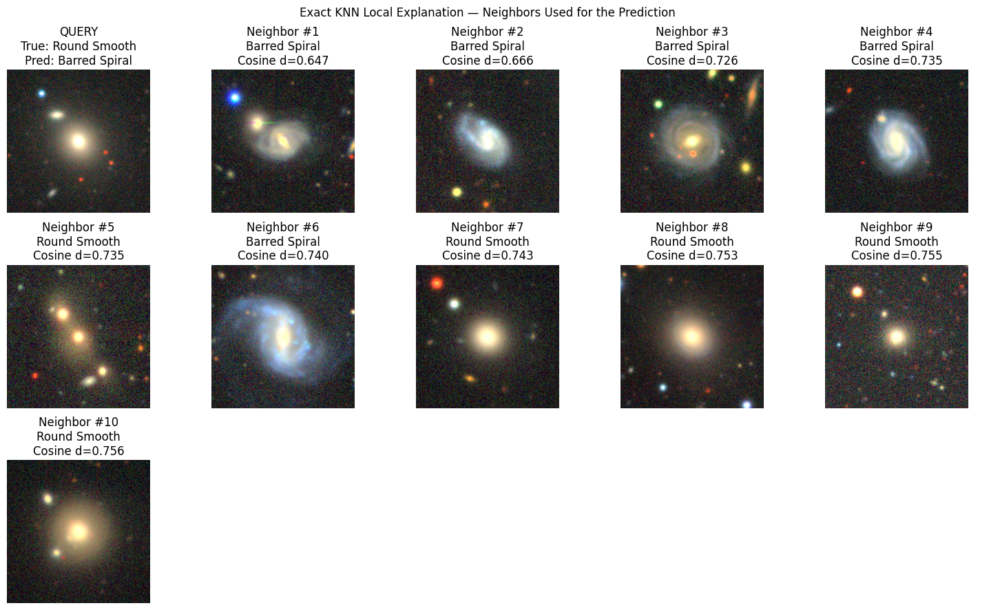

In [51]:
if len(misclassified_indices) > 0:
    query_index = int(
        misclassified_indices[0]
    )

    scaler = final_model.named_steps[
        "scaler"
    ]
    knn_model = final_model.named_steps[
        "knn"
    ]

    query_prepared = (
        to_float64_features(
            X_test_best[
                [query_index]
            ]
        )
    )

    query_prepared = (
        scaler.transform(
            query_prepared
        )
    )

    if (
        BEST_DISTANCE == "cosine"
        and "cosine_normalizer"
        in final_model.named_steps
    ):
        query_prepared = (
            final_model.named_steps[
                "cosine_normalizer"
            ].transform(
                query_prepared
            )
        )

    internal_distances, model_neighbor_indices = (
        knn_model.kneighbors(
            query_prepared,
            n_neighbors=BEST_K,
            return_distance=True
        )
    )

    model_neighbor_indices = (
        model_neighbor_indices[0]
    )

    distances = reported_neighbor_distances(
        internal_distances[0],
        BEST_DISTANCE
    )

    original_neighbor_indices = None

    if BEST_SAMPLING_METHOD == "none":
        original_neighbor_indices = (
            model_neighbor_indices.copy()
        )

    elif "sampler" in final_model.named_steps:
        sampler = final_model.named_steps[
            "sampler"
        ]

        if hasattr(
            sampler,
            "sample_indices_"
        ):
            original_neighbor_indices = (
                sampler.sample_indices_[
                    model_neighbor_indices
                ]
            )

    if original_neighbor_indices is not None:
        print(
            "Exact final-model neighbor gallery "
            f"using the {BEST_K} neighbors "
            "that participate in the prediction."
        )

        total_panels = (
            BEST_K + 1
        )
        columns = min(
            5,
            total_panels
        )
        rows = int(
            np.ceil(
                total_panels
                / columns
            )
        )

        fig, axes = plt.subplots(
            rows,
            columns,
            figsize=(
                3 * columns,
                3 * rows
            )
        )

        axes = np.atleast_1d(
            axes
        ).ravel()

        axes[0].imshow(
            normalize_image(
                X_test_img[
                    query_index
                ],
                stretch="linear"
            )
        )
        axes[0].set_title(
            f"QUERY\n"
            f"True: "
            f"{CLASS_NAMES[int(y_test[query_index])]}\n"
            f"Pred: "
            f"{CLASS_NAMES[int(y_test_pred[query_index])]}"
        )
        axes[0].axis("off")

        for rank, (
            original_idx,
            distance
        ) in enumerate(
            zip(
                original_neighbor_indices,
                distances
            ),
            start=1
        ):
            axes[rank].imshow(
                normalize_image(
                    X_train_img[
                        int(
                            original_idx
                        )
                    ],
                    stretch="linear"
                )
            )
            axes[rank].set_title(
                f"Neighbor #{rank}\n"
                f"{CLASS_NAMES[int(y_train[int(original_idx)])]}\n"
                f"{BEST_DISTANCE.title()} "
                f"d={distance:.3f}"
            )
            axes[rank].axis("off")

        for ax in axes[
            total_panels:
        ]:
            ax.axis("off")

        plt.suptitle(
            "Exact KNN Local Explanation — "
            "Neighbors Used for the Prediction"
        )
        plt.tight_layout()
        plt.show()

    else:
        print(
            "The selected sampler creates synthetic "
            "feature vectors, so exact final-model "
            "neighbors cannot all be mapped to "
            "physical training images. "
            "The vote table below remains exact."
        )
else:
    print(
        "No misclassified test observations are "
        "available for local error explanation."
    )

## Neighbor Vote Strength

KNN does not use every nearby observation. It uses exactly the selected `k` nearest neighbors.

For the winning model, `k=3` and `weights="uniform"`, so each of those three neighbors contributes one equal vote. The predicted class is the class with the largest total vote.

The table and plots below therefore show only the neighbors that actually participate in the prediction.

### Exact KNN Vote Breakdown

This block turns the selected neighbors into the actual KNN decision. It uses exactly the selected k neighbors and the weighting rule chosen by Grid Search.

**Why**  
Show exactly how the selected KNN converted its nearest neighbors into the predicted class.

**What**  
Build a table for only the `k` neighbors used in the prediction, including distance, class, and the actual vote weight.

**How**  
With `uniform` weighting each neighbor receives weight `1`. If `distance` weighting were selected, the weight would be proportional to `1 / distance`. Votes are then summed by class.

**Expected result**  
For the current winning model, exactly three neighbors and a class-vote chart that directly explains the final KNN prediction.

,rank,distance,label,class_name,used_for_prediction,vote_weight
0,1,0.6471,1,Barred Spiral,True,1.5454
1,2,0.6664,1,Barred Spiral,True,1.5006
2,3,0.7259,1,Barred Spiral,True,1.3777
3,4,0.7345,1,Barred Spiral,True,1.3615
4,5,0.7354,0,Round Smooth,True,1.3599
5,6,0.7402,1,Barred Spiral,True,1.3509
6,7,0.7433,0,Round Smooth,True,1.3453
7,8,0.7533,0,Round Smooth,True,1.3275
8,9,0.7551,0,Round Smooth,True,1.3243
9,10,0.7564,0,Round Smooth,True,1.3220


,class_name,total_vote_strength
0,Barred Spiral,7.1361
1,Round Smooth,6.6789


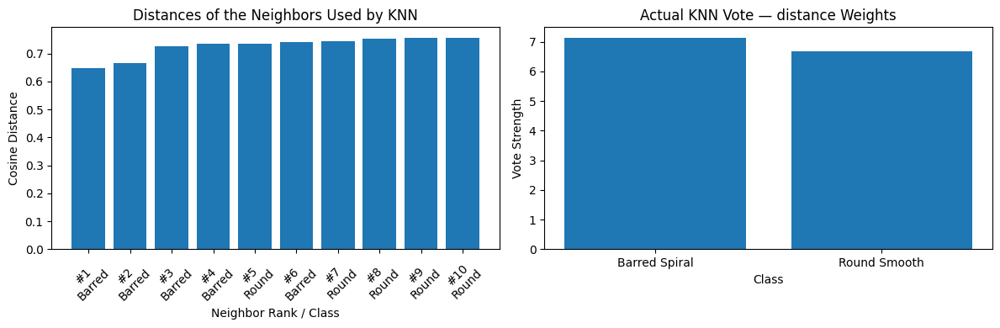

In [52]:
if len(misclassified_indices) > 0:
    if original_neighbor_indices is not None:
        neighbor_labels = y_train[
            original_neighbor_indices
        ].astype(int)
    else:
        neighbor_labels = knn_model._y[
            model_neighbor_indices
        ].astype(int)

    local_neighbor_table = pd.DataFrame({
        "rank":
            np.arange(
                1,
                BEST_K + 1
            ),
        "distance":
            distances,
        "label":
            neighbor_labels,
        "class_name": [
            CLASS_NAMES[int(value)]
            for value in neighbor_labels
        ],
        "used_for_prediction":
            True
    })

    if BEST_WEIGHTS == "uniform":
        local_neighbor_table[
            "vote_weight"
        ] = 1.0

    elif BEST_DISTANCE == "cosine":
        local_neighbor_table[
            "vote_weight"
        ] = (
            cosine_distance_weights(
                distances.reshape(
                    1,
                    -1
                )
                ** 0.5
                * np.sqrt(2.0)
            )[0]
        )

    else:
        local_neighbor_table[
            "vote_weight"
        ] = (
            1.0
            / np.maximum(
                local_neighbor_table[
                    "distance"
                ],
                1e-12
            )
        )

    display(
        local_neighbor_table.round(
            4
        )
    )

    vote_summary = (
        local_neighbor_table
        .groupby(
            "class_name",
            as_index=False
        )["vote_weight"]
        .sum()
        .rename(columns={
            "vote_weight":
                "total_vote_strength"
        })
        .sort_values(
            "total_vote_strength",
            ascending=False
        )
    )

    display(
        vote_summary.round(4)
    )

    fig, axes = plt.subplots(
        1,
        2,
        figsize=(12, 4)
    )

    short_class_names = {
        "Round Smooth": "Round",
        "Barred Spiral": "Barred"
    }

    neighbor_axis_labels = [
        (
            f"#{int(row['rank'])}\n"
            f"{short_class_names.get(row['class_name'], row['class_name'])}"
        )
        for _, row in
        local_neighbor_table.iterrows()
    ]

    axes[0].bar(
        neighbor_axis_labels,
        local_neighbor_table[
            "distance"
        ]
    )
    axes[0].set_title(
        "Distances of the Neighbors "
        "Used by KNN"
    )
    axes[0].set_xlabel(
        "Neighbor Rank / Class"
    )
    axes[0].set_ylabel(
        f"{BEST_DISTANCE.title()} Distance"
    )
    axes[0].tick_params(
        axis="x",
        labelrotation=45
    )

    axes[1].bar(
        vote_summary[
            "class_name"
        ],
        vote_summary[
            "total_vote_strength"
        ]
    )
    axes[1].set_title(
        "Actual KNN Vote — "
        f"{BEST_WEIGHTS} Weights"
    )
    axes[1].set_xlabel(
        "Class"
    )
    axes[1].set_ylabel(
        "Vote Strength"
    )

    plt.tight_layout()
    plt.show()

## Feature-Group Contribution to Local Distance

For the closest neighbor, the model's distance can be decomposed into contributions from HOG, color histograms, and morphology statistics when those groups exist in the selected representation.

### Local Feature-Group Distance Contribution

This block explains why the closest neighbor is close in the selected feature space by decomposing the KNN distance into HOG, color-histogram, and morphology feature groups.

**Why**  
Explain which feature groups contribute to local KNN distance.

**What**  
Decompose the selected distance into HOG, color-histogram, and morphology components.

**How**  
Differences are summed within each feature-group slice and normalized when total distance is nonzero.

**Expected result**  
A contribution table and a non-empty bar chart when the neighbor distance is meaningful.

,feature_group,component_value,component_type
0,hog,0.335,Cosine similarity contribution
1,color_histograms,0.017,Cosine similarity contribution
2,morphology_statistics,0.000,Cosine similarity contribution


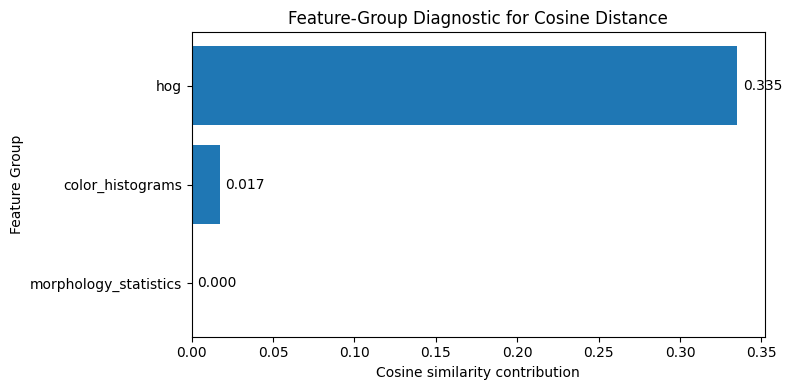

For Chebyshev and Cosine, the group values are diagnostic rather than additive distance percentages.


In [53]:
def group_distance_contributions(
    query_vector,
    neighbor_vector,
    groups,
    distance_metric
):
    rows = []

    for group_name, group_slice in groups.items():
        query_group = np.asarray(
            query_vector[group_slice],
            dtype=np.float64
        )
        neighbor_group = np.asarray(
            neighbor_vector[group_slice],
            dtype=np.float64
        )

        diff = np.abs(
            query_group -
            neighbor_group
        )

        if distance_metric == "manhattan":
            component = diff.sum()
            component_label = (
                "L1 distance contribution"
            )

        elif distance_metric == "euclidean":
            component = np.square(
                diff
            ).sum()
            component_label = (
                "Squared L2 contribution"
            )

        elif distance_metric == "chebyshev":
            component = diff.max()
            component_label = (
                "Maximum absolute difference"
            )

        elif distance_metric == "cosine":
            numerator = np.dot(
                query_group,
                neighbor_group
            )

            denominator = (
                np.linalg.norm(
                    query_vector
                )
                * np.linalg.norm(
                    neighbor_vector
                )
                + 1e-12
            )

            component = numerator / denominator
            component_label = (
                "Cosine similarity contribution"
            )

        else:
            raise ValueError(
                f"Unsupported distance "
                f"metric: {distance_metric}"
            )

        rows.append({
            "feature_group": group_name,
            "component_value":
                float(component),
            "component_type":
                component_label
        })

    result = pd.DataFrame(rows)

    if distance_metric in {
        "manhattan",
        "euclidean"
    }:
        total = (
            result[
                "component_value"
            ].sum()
            + 1e-12
        )

        result[
            "percentage"
        ] = (
            100
            * result[
                "component_value"
            ]
            / total
        )

    return result.sort_values(
        "component_value",
        ascending=False
    )


if len(misclassified_indices) > 0:
    query_scaled_vector = scaler.transform(
        to_float64_features(
            X_test_best[[query_index]]
        )
    )

    if (
        BEST_DISTANCE == "cosine"
        and "cosine_normalizer"
        in final_model.named_steps
    ):
        query_scaled_vector = (
            final_model.named_steps[
                "cosine_normalizer"
            ].transform(
                query_scaled_vector
            )
        )

    query_scaled_vector = (
        query_scaled_vector[0]
    )

    if original_neighbor_indices is not None:
        closest_train_scaled = scaler.transform(
            to_float64_features(
                X_best_train[
                    [
                        int(
                            original_neighbor_indices[
                                0
                            ]
                        )
                    ]
                ]
            )
        )

        if (
            BEST_DISTANCE == "cosine"
            and "cosine_normalizer"
            in final_model.named_steps
        ):
            closest_train_scaled = (
                final_model.named_steps[
                    "cosine_normalizer"
                ].transform(
                    closest_train_scaled
                )
            )

        closest_train_scaled = (
            closest_train_scaled[0]
        )

    else:
        closest_train_scaled = (
            knn_model._fit_X[
                int(
                    model_neighbor_indices[
                        0
                    ]
                )
            ]
        )

    contribution_df = group_distance_contributions(
        query_scaled_vector,
        closest_train_scaled,
        best_groups,
        BEST_DISTANCE
    )

    display(
        contribution_df.round(3)
    )

    if BEST_DISTANCE in {
        "manhattan",
        "euclidean"
    }:
        plot_df = (
            contribution_df
            .sort_values(
                "percentage",
                ascending=True
            )
        )

        fig, ax = plt.subplots(
            figsize=(8, 4)
        )

        bars = ax.barh(
            plot_df[
                "feature_group"
            ],
            plot_df[
                "percentage"
            ]
        )

        ax.bar_label(
            bars,
            labels=[
                f"{value:.2f}%"
                for value in plot_df[
                    "percentage"
                ]
            ],
            padding=4
        )

        ax.set_title(
            "Feature-Group Contribution "
            "to the Closest KNN Distance"
        )
        ax.set_xlabel(
            "Contribution to Distance (%)"
        )
        ax.set_ylabel(
            "Feature Group"
        )

        plt.tight_layout()
        plt.show()

    else:
        plot_df = (
            contribution_df
            .sort_values(
                "component_value",
                ascending=True
            )
        )

        fig, ax = plt.subplots(
            figsize=(8, 4)
        )

        bars = ax.barh(
            plot_df[
                "feature_group"
            ],
            plot_df[
                "component_value"
            ]
        )

        ax.bar_label(
            bars,
            labels=[
                f"{value:.3f}"
                for value in plot_df[
                    "component_value"
                ]
            ],
            padding=4
        )

        ax.set_title(
            "Feature-Group Diagnostic "
            f"for {BEST_DISTANCE.title()} Distance"
        )
        ax.set_xlabel(
            str(
                plot_df[
                    "component_type"
                ].iloc[0]
            )
        )
        ax.set_ylabel(
            "Feature Group"
        )

        plt.tight_layout()
        plt.show()

        print(
            "For Chebyshev and Cosine, "
            "the group values are diagnostic "
            "rather than additive distance "
            "percentages."
        )
else:
    print(
        "No misclassified test observation "
        "is available for local "
        "feature-distance explanation."
    )

## Global Feature-Group Permutation Importance

Instead of permuting individual HOG dimensions—which are difficult to interpret—entire feature groups are shuffled together on the independent validation split.

The decrease in Macro-F1 measures how much the model relies on each group.

### Global Feature-Group Permutation Importance

This is the global Explainability component of Bonus 6C. It measures how much validation Macro-F1 drops when one complete feature group is deliberately destroyed by permutation.

**Why**  
Provide global Explainability for Bonus 6C.

**What**  
Measure how much validation Macro-F1 drops after permuting each feature group.

**How**  
The fitted model is held fixed while one group is destroyed repeatedly.

**Expected result**  
A ranked feature-group importance table and plot with variability.

,feature_group,mean_macro_f1_drop,std_macro_f1_drop
0,hog,0.3565,0.0123
1,color_histograms,0.0191,0.0060
2,morphology_statistics,0.0026,0.0009


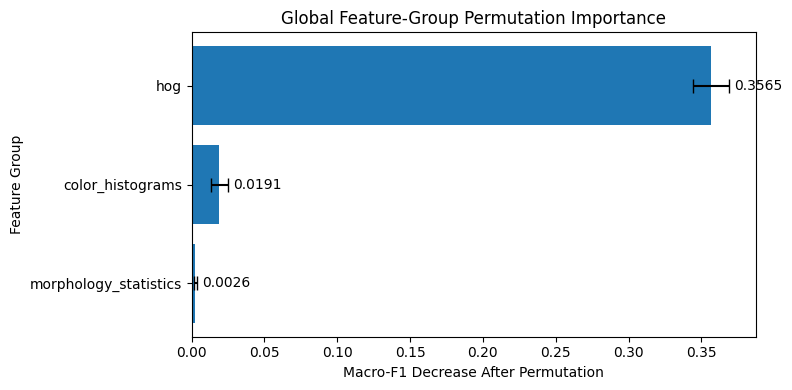

In [54]:
def group_permutation_importance(
    model,
    X,
    y,
    groups,
    repeats=5,
    random_state=RANDOM_STATE
):
    rng = np.random.default_rng(random_state)

    baseline_pred = model.predict(X)
    baseline = f1_score(
        y,
        baseline_pred,
        average="macro"
    )

    rows = []

    for group_name, group_slice in groups.items():
        drops = []

        for _ in range(repeats):
            shuffled = X.copy()

            permutation = rng.permutation(len(shuffled))
            shuffled[:, group_slice] = (
                shuffled[permutation][:, group_slice]
            )

            score = f1_score(
                y,
                model.predict(shuffled),
                average="macro"
            )

            drops.append(baseline - score)

        rows.append({
            "feature_group": group_name,
            "mean_macro_f1_drop": np.mean(drops),
            "std_macro_f1_drop": np.std(drops)
        })

    return (
        pd.DataFrame(rows)
        .sort_values(
            "mean_macro_f1_drop",
            ascending=False
        )
    )


group_importance_df = group_permutation_importance(
    validation_model,
    X_val_best,
    y_val,
    best_groups,
    repeats=5
)


display(group_importance_df.round(4))

if group_importance_df.empty:
    print(
        "No feature groups are available for "
        "permutation-importance plotting."
    )
else:
    importance_plot_df = (
        group_importance_df
        .sort_values(
            "mean_macro_f1_drop",
            ascending=True
        )
    )

    fig, ax = plt.subplots(figsize=(8, 4))

    bars = ax.barh(
        importance_plot_df["feature_group"],
        importance_plot_df["mean_macro_f1_drop"],
        xerr=importance_plot_df["std_macro_f1_drop"],
        capsize=5
    )

    ax.bar_label(
        bars,
        labels=[
            f"{v:.4f}"
            for v in importance_plot_df["mean_macro_f1_drop"]
        ],
        padding=4
    )

    ax.set_title(
        "Global Feature-Group Permutation Importance"
    )
    ax.set_xlabel(
        "Macro-F1 Decrease After Permutation"
    )
    ax.set_ylabel("Feature Group")

    plt.tight_layout()
    plt.show()

# Final Results and Conclusions

The summary below is generated automatically from the **current notebook run** so that it always reflects the actual winning permutation, sampling strategy, validation score, test score, class-level behavior, and explainability results.

### Final Results Dashboard

This section summarizes the final executed run directly. The model-selection search is now closed, so the measured results are presented as readable Markdown rather than through a hidden Python cell.

## Model Selection

The complete 5-fold Cartesian Grid Search evaluated **720 Feature Engineering × KNN permutations** (**3,600 fold-level model fits**).

The winning configuration was:

- **Feature representation:** `hog_color_stats64_linear`
- **Scaler:** RobustScaler
- **k:** **10**
- **Voting weights:** **distance**
- **Distance metric:** **Cosine**
- **Mean 5-fold Macro-F1:** **0.9049**

The final focused `k` comparison tested values below, immediately around, and above the winner (`3, 9, 10, 11, 20`), supporting `k=10` as the local optimum.

## Bonus 6B — Imbalance Treatment

The selected strategy was **no sampling**, with mean 5-fold Macro-F1 **0.9049**.

The alternative imbalance treatments did not improve the validated score, so the final pipeline retains the original training distribution.

## Generalization

- **Independent Validation Macro-F1:** **0.8966**
- **Final Test Macro-F1:** **0.8903**
- **Test Accuracy:** **0.8934**
- **Balanced Accuracy:** **0.8865**

The relatively small gap between cross-validation, Validation, and Test performance supports stable generalization rather than a result that exists only inside the Grid Search.

## Class-Level Test Performance

### Round Smooth
- Precision: **0.8799**
- Recall: **0.9396**
- F1: **0.9088**

### Barred Spiral
- Precision: **0.9140**
- Recall: **0.8333**
- F1: **0.8718**

## Main Error Directions

- **Barred Spiral → Round Smooth:** **34** errors
- **Round Smooth → Barred Spiral:** **16** errors

The model is still more likely to miss a true Barred Spiral than to incorrectly classify a Round Smooth galaxy as barred.

## Explainability

Global feature-group permutation importance:

- **HOG:** Macro-F1 decrease ≈ **0.3565**
- **Color histograms:** Macro-F1 decrease ≈ **0.0191**
- **Morphology statistics:** Macro-F1 decrease ≈ **0.0026**

HOG is therefore the dominant information source in the selected representation. The local nearest-neighbor analysis complements this global result by showing the exact training galaxies, distances, and weighted votes involved in a real KNN prediction.

## Overall Conclusion

The final notebook implements a complete supervised **Computer Vision / Image Classification** workflow: course-taught image Feature Engineering, additional domain-specific extensions, full 5-fold Cartesian model selection, imbalance experiments, final Train retraining, untouched Test evaluation, visual error analysis, and both local and global Explainability.

The strongest final pipeline combines structural HOG information with additional histogram and morphology features, Robust scaling, `k=10`, distance-weighted voting, and Cosine distance.